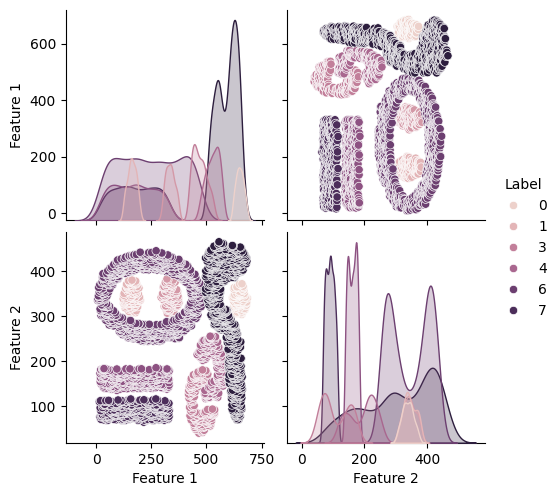

Train Precision: 1.0, Train Recall: 1.0, Train F1: 1.0
Test Precision: 0.9956223666623595, Test Recall: 0.9956043956043956, Test F1: 0.9955966892543627


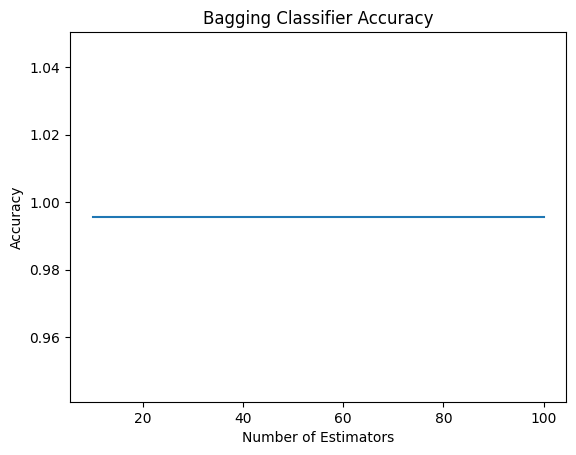

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Load the dataset
dataset = pd.read_csv('/content/Dataset1.csv')

# Visualize the dataset
sns.pairplot(dataset, hue='Label')
plt.show()

# Split the data
X = dataset.drop('Label', axis=1)
y = dataset['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Bagging Classifier
base_clf = DecisionTreeClassifier()
bagging_clf = BaggingClassifier(estimator=base_clf, n_estimators=50, random_state=42)  # Change 'base_estimator' to 'estimator'
bagging_clf.fit(X_train, y_train)

# Predictions
y_pred_train = bagging_clf.predict(X_train)
y_pred_test = bagging_clf.predict(X_test)

# Performance Metrics
precision_train = precision_score(y_train, y_pred_train, average='weighted')
recall_train = recall_score(y_train, y_pred_train, average='weighted')
f1_train = f1_score(y_train, y_pred_train, average='weighted')

precision_test = precision_score(y_test, y_pred_test, average='weighted')
recall_test = recall_score(y_test, y_pred_test, average='weighted')
f1_test = f1_score(y_test, y_pred_test, average='weighted')

print(f"Train Precision: {precision_train}, Train Recall: {recall_train}, Train F1: {f1_train}")
print(f"Test Precision: {precision_test}, Test Recall: {recall_test}, Test F1: {f1_test}")

# Plot accuracy graph
n_estimators = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
accuracy = []

for n in n_estimators:
    bagging_clf = BaggingClassifier(estimator=base_clf, n_estimators=n, random_state=42)  # Change 'base_estimator' to 'estimator'
    bagging_clf.fit(X_train, y_train)
    y_pred = bagging_clf.predict(X_test)
    accuracy.append(accuracy_score(y_test, y_pred))

plt.plot(n_estimators, accuracy)
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.title('Bagging Classifier Accuracy')
plt.show()


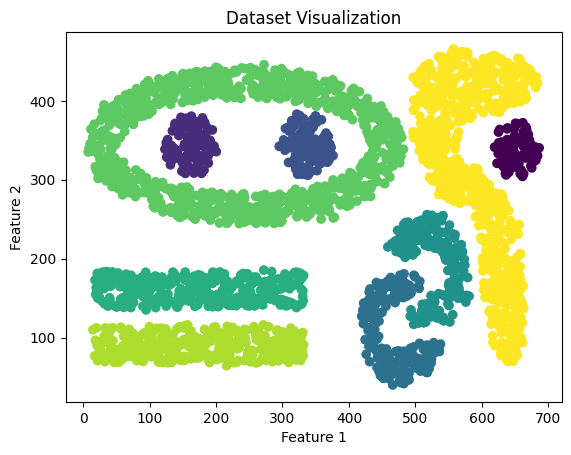

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('/content/Dataset1.csv')

# Visualize the dataset
plt.scatter(data['Feature 1'], data['Feature 2'], c=data['Label'])
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Dataset Visualization')
plt.show()


Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


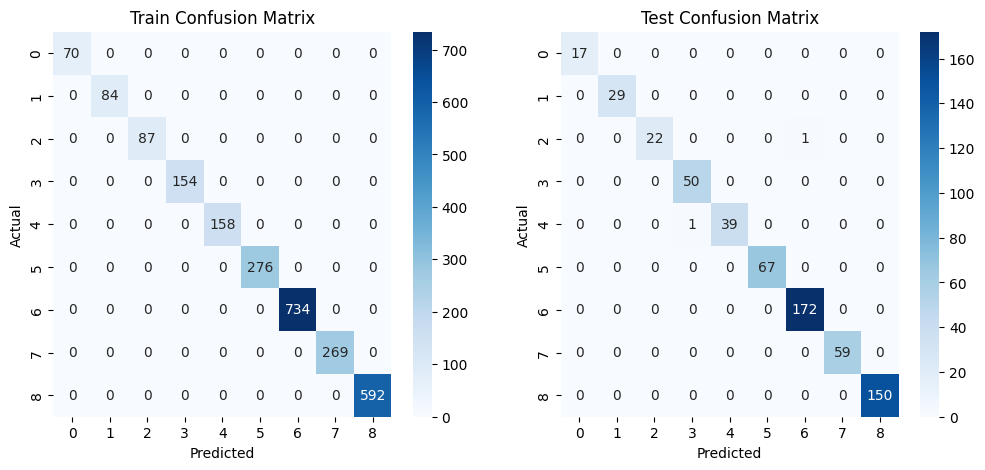

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns

# Load the dataset
data = pd.read_csv('/content/Dataset1.csv')

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(data[['Feature 1', 'Feature 2']], data['Label'], test_size=0.2, random_state=42)

# Implement Bagging with the updated parameter name
bagging = BaggingClassifier(estimator=DecisionTreeClassifier(), n_estimators=50, random_state=42)
bagging.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = bagging.predict(X_train)
y_pred_test = bagging.predict(X_test)

# Calculate metrics with appropriate averaging method
precision_train = precision_score(y_train, y_pred_train, average='weighted')
recall_train = recall_score(y_train, y_pred_train, average='weighted')
f1_train = f1_score(y_train, y_pred_train, average='weighted')
accuracy_train = accuracy_score(y_train, y_pred_train)

precision_test = precision_score(y_test, y_pred_test, average='weighted')
recall_test = recall_score(y_test, y_pred_test, average='weighted')
f1_test = f1_score(y_test, y_pred_test, average='weighted')
accuracy_test = accuracy_score(y_test, y_pred_test)

# Print the results
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Plot decision boundaries for visual inspection
def plot_decision_boundary(clf, X, y, title):
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.3)
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, edgecolors='k', marker='o')
    plt.title(title)
    plt.show()

plot_decision_boundary(bagging, X_train, y_train, "Bagging Decision Boundary (Train)")
plot_decision_boundary(bagging, X_test, y_test, "Bagging Decision Boundary (Test)")


Bagging Accuracy: 1.00
Decision Tree Accuracy: 1.00


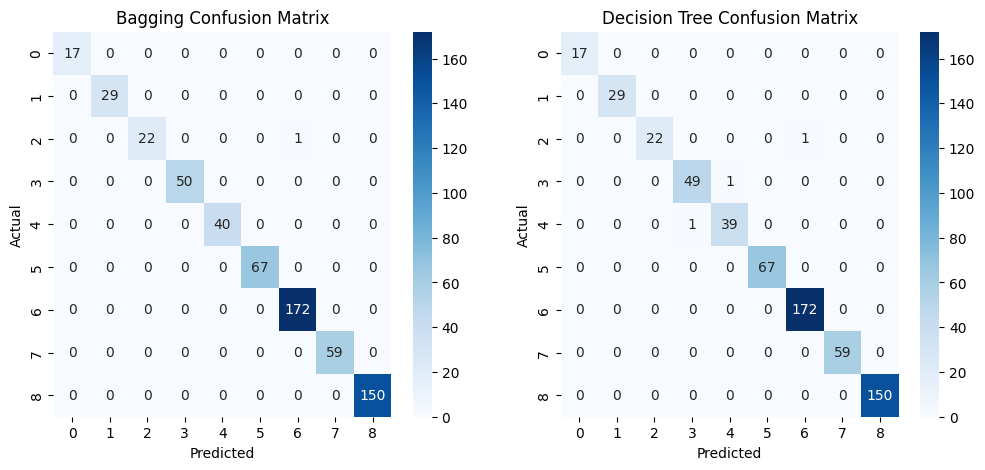

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV

# Load the dataset
data = pd.read_csv('/content/Dataset1.csv')

# Features and labels
X = data[['Feature 1', 'Feature 2']]
y = data['Label']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Bagging Classifier with a Decision Tree base estimator
bagging = BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=42)

# Set hyperparameters for tuning
param_grid = {
    'n_estimators': [5, 10, 20],
    'estimator__max_depth': [3, 5, 10]
}

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(bagging, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)
best_bagging = grid_search.best_estimator_

# Train the best Bagging classifier
best_bagging.fit(X_train, y_train)

# Initialize Decision Tree with max depth of 6
decision_tree = DecisionTreeClassifier(max_depth=6, random_state=42)

# Train the Decision Tree classifier
decision_tree.fit(X_train, y_train)

# Predict using both classifiers
y_pred_bagging = best_bagging.predict(X_test)
y_pred_tree = decision_tree.predict(X_test)

# Evaluate accuracy
accuracy_bagging = accuracy_score(y_test, y_pred_bagging)
accuracy_tree = accuracy_score(y_test, y_pred_tree)

print(f'Bagging Accuracy: {accuracy_bagging:.2f}')
print(f'Decision Tree Accuracy: {accuracy_tree:.2f}')

# Confusion matrices
conf_matrix_bagging = confusion_matrix(y_test, y_pred_bagging)
conf_matrix_tree = confusion_matrix(y_test, y_pred_tree)

# Visualization
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_bagging, annot=True, fmt='d', cmap='Blues')
plt.title('Bagging Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_tree, annot=True, fmt='d', cmap='Blues')
plt.title('Decision Tree Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()


Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.96
Test Recall: 0.95
Test F1 Score: 0.95
Test Accuracy: 0.95


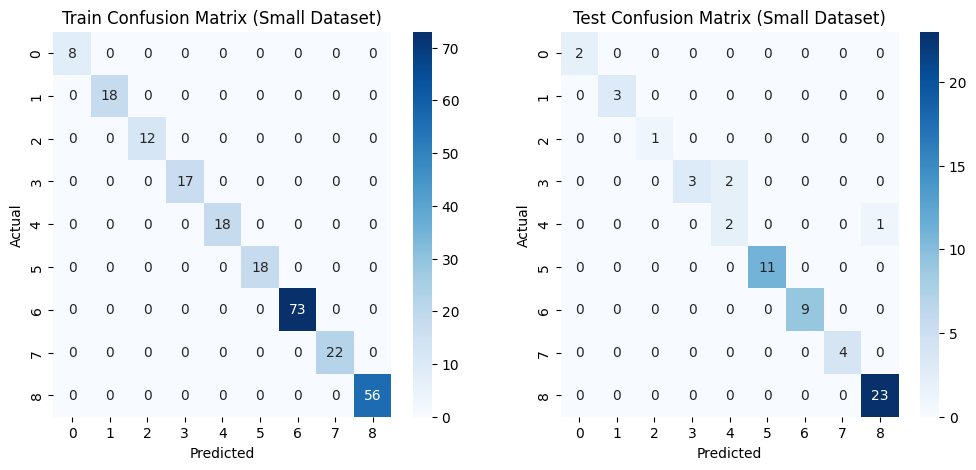

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns
# Load the dataset
data = pd.read_csv('/content/Dataset1.csv')

# Use a smaller subset of the data for testing
data_small = data.sample(frac=0.1, random_state=42)

# Split the smaller dataset
X_train_small, X_test_small, y_train_small, y_test_small = train_test_split(
    data_small[['Feature 1', 'Feature 2']], data_small['Label'], test_size=0.2, random_state=42)

# Implement Bagging with the updated parameter name
bagging_small = BaggingClassifier(estimator=DecisionTreeClassifier(), n_estimators=10, random_state=42)
bagging_small.fit(X_train_small, y_train_small)

# Predict and evaluate
y_pred_train_small = bagging_small.predict(X_train_small)
y_pred_test_small = bagging_small.predict(X_test_small)

# Calculate metrics with appropriate averaging method
precision_train_small = precision_score(y_train_small, y_pred_train_small, average='weighted')
recall_train_small = recall_score(y_train_small, y_pred_train_small, average='weighted')
f1_train_small = f1_score(y_train_small, y_pred_train_small, average='weighted')
accuracy_train_small = accuracy_score(y_train_small, y_pred_train_small)

precision_test_small = precision_score(y_test_small, y_pred_test_small, average='weighted')
recall_test_small = recall_score(y_test_small, y_pred_test_small, average='weighted')
f1_test_small = f1_score(y_test_small, y_pred_test_small, average='weighted')
accuracy_test_small = accuracy_score(y_test_small, y_pred_test_small)

# Print the results
print(f"Train Precision: {precision_train_small:.2f}")
print(f"Train Recall: {recall_train_small:.2f}")
print(f"Train F1 Score: {f1_train_small:.2f}")
print(f"Train Accuracy: {accuracy_train_small:.2f}")

print(f"Test Precision: {precision_test_small:.2f}")
print(f"Test Recall: {recall_test_small:.2f}")
print(f"Test F1 Score: {f1_test_small:.2f}")
print(f"Test Accuracy: {accuracy_test_small:.2f}")

# Confusion matrices
conf_matrix_train_small = confusion_matrix(y_train_small, y_pred_train_small)
conf_matrix_test_small = confusion_matrix(y_test_small, y_pred_test_small)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train_small, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix (Small Dataset)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test_small, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix (Small Dataset)')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()


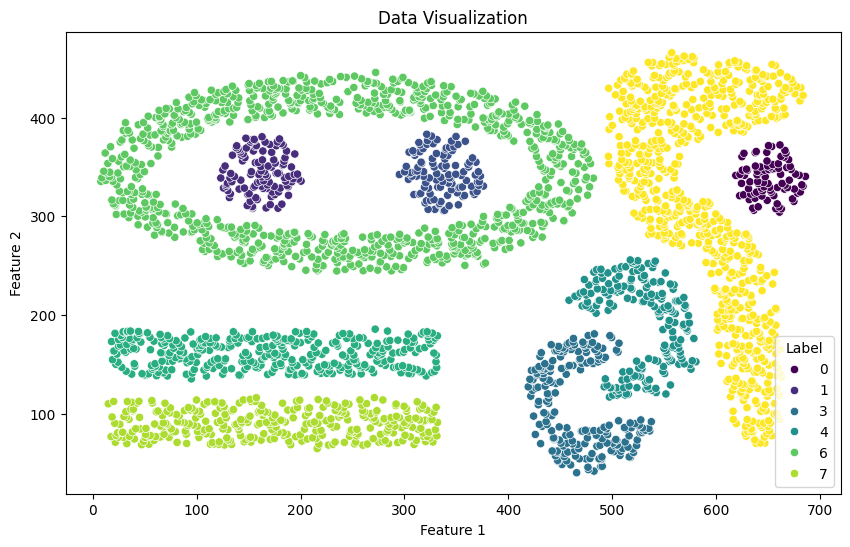

In [ ]:
# Visualize the data
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='Feature 1', y='Feature 2', hue='Label', palette='viridis')
plt.title('Data Visualization')
plt.show()


Cross-Validation Scores (Dataset fraction 0.1): [1.         0.95918367 0.95833333 0.95833333 0.97916667]
Mean CV Score (Dataset fraction 0.1): 0.9710034013605442
Dataset fraction: 0.1
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.96
Test Recall: 0.95
Test F1 Score: 0.95
Test Accuracy: 0.95


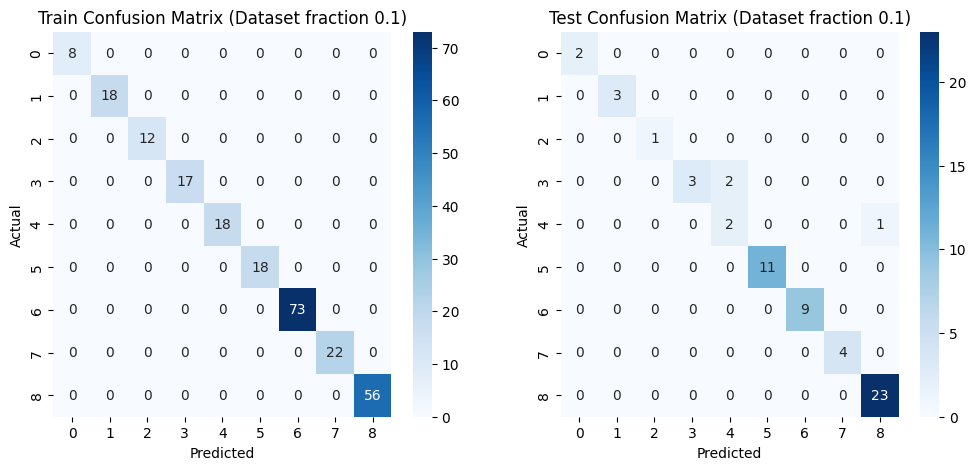

Cross-Validation Scores (Dataset fraction 0.2): [0.98969072 0.98969072 0.98969072 0.97938144 0.96875   ]
Mean CV Score (Dataset fraction 0.2): 0.9834407216494846
Dataset fraction: 0.2
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


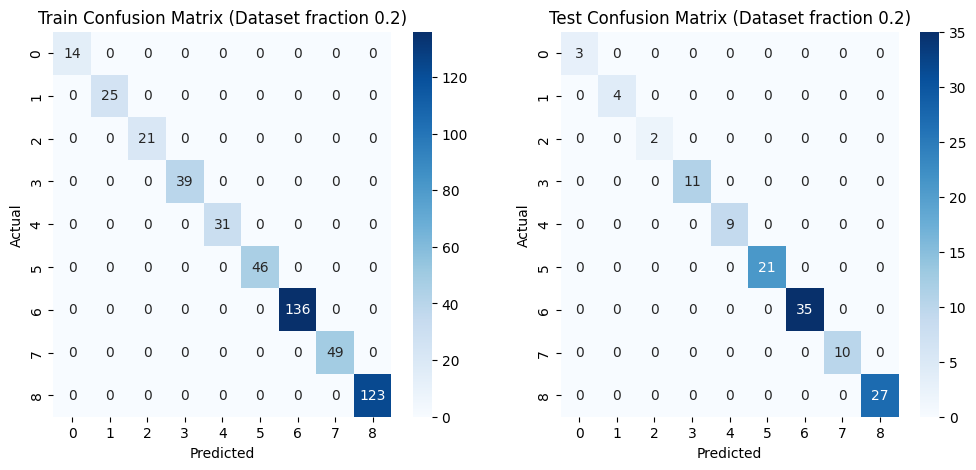

Cross-Validation Scores (Dataset fraction 0.5): [1.         0.99588477 1.         0.99173554 0.99173554]
Mean CV Score (Dataset fraction 0.5): 0.9958711696085434
Dataset fraction: 0.5
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


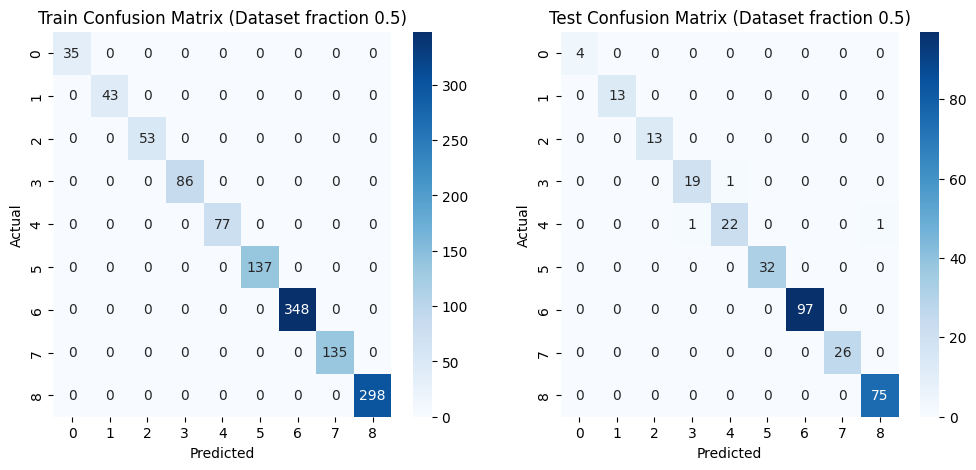

Cross-Validation Scores (Dataset fraction 1.0): [1.         1.         0.99587629 0.98969072 0.99793388]
Mean CV Score (Dataset fraction 1.0): 0.9967001789213598
Dataset fraction: 1.0
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


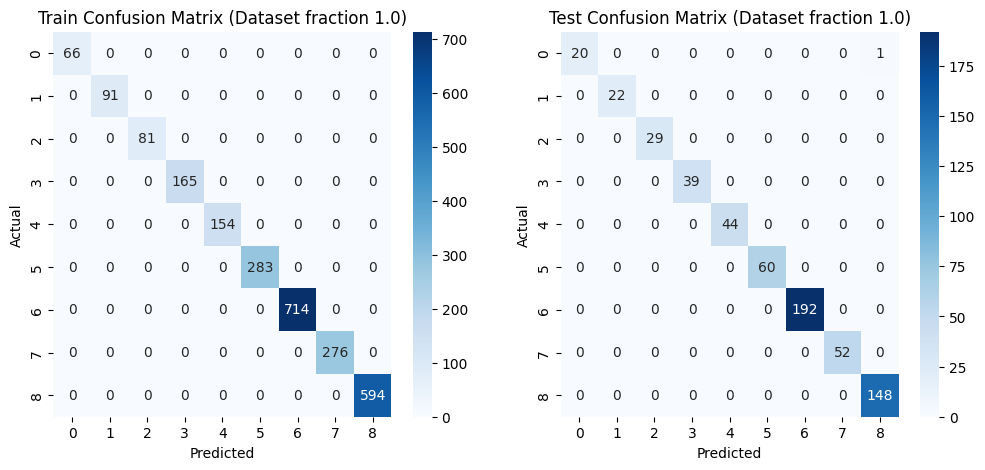

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Function to perform evaluation
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

# Increase the dataset size incrementally
for frac in [0.1, 0.2, 0.5, 1.0]:
    data_subset = data_full.sample(frac=frac, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(data_subset[['Feature 1', 'Feature 2']], data_subset['Label'], test_size=0.2, random_state=42)

    # Implement Random Forest with cross-validation for hyperparameter tuning
    random_forest = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
    scores = cross_val_score(random_forest, X_train, y_train, cv=5, scoring='accuracy')
    print(f"Cross-Validation Scores (Dataset fraction {frac}): {scores}")
    print(f"Mean CV Score (Dataset fraction {frac}): {scores.mean()}")

    # Evaluate the model
    precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, random_forest)

    # Print the results
    print(f"Dataset fraction: {frac}")
    print(f"Train Precision: {precision_train:.2f}")
    print(f"Train Recall: {recall_train:.2f}")
    print(f"Train F1 Score: {f1_train:.2f}")
    print(f"Train Accuracy: {accuracy_train:.2f}")

    print(f"Test Precision: {precision_test:.2f}")
    print(f"Test Recall: {recall_test:.2f}")
    print(f"Test F1 Score: {f1_test:.2f}")
    print(f"Test Accuracy: {accuracy_test:.2f}")

    # Confusion matrices
    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.subplot(1, 2, 2)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.show()


Fitting 5 folds for each of 81 candidates, totalling 405 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


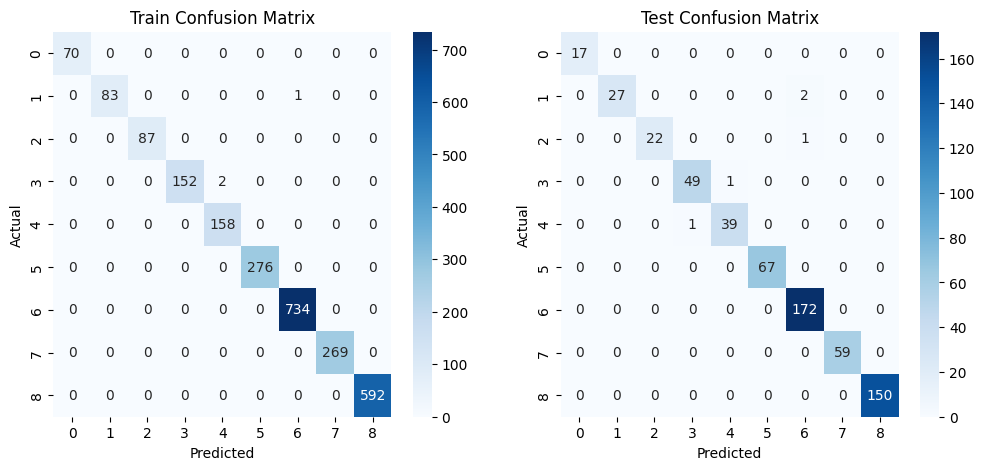

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter tuning for Bagging
param_grid = {
    'n_estimators': [10, 50, 100],
    'base_estimator__max_depth': [3, 5, 7],
    'max_samples': [0.5, 0.75, 1.0],
    'max_features': [0.5, 0.75, 1.0]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(BaggingClassifier(base_estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Visualize individual trees



Fitting 5 folds for each of 81 candidates, totalling 405 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


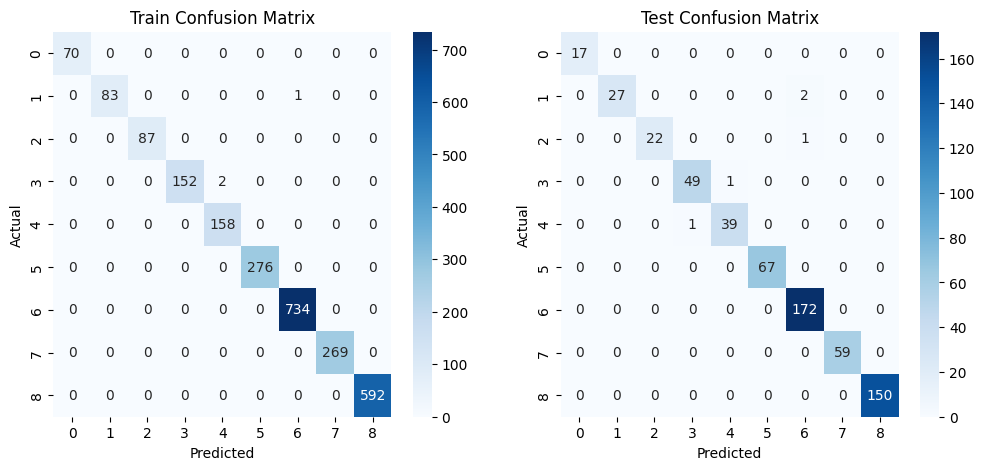

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but BaggingClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but BaggingClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarni

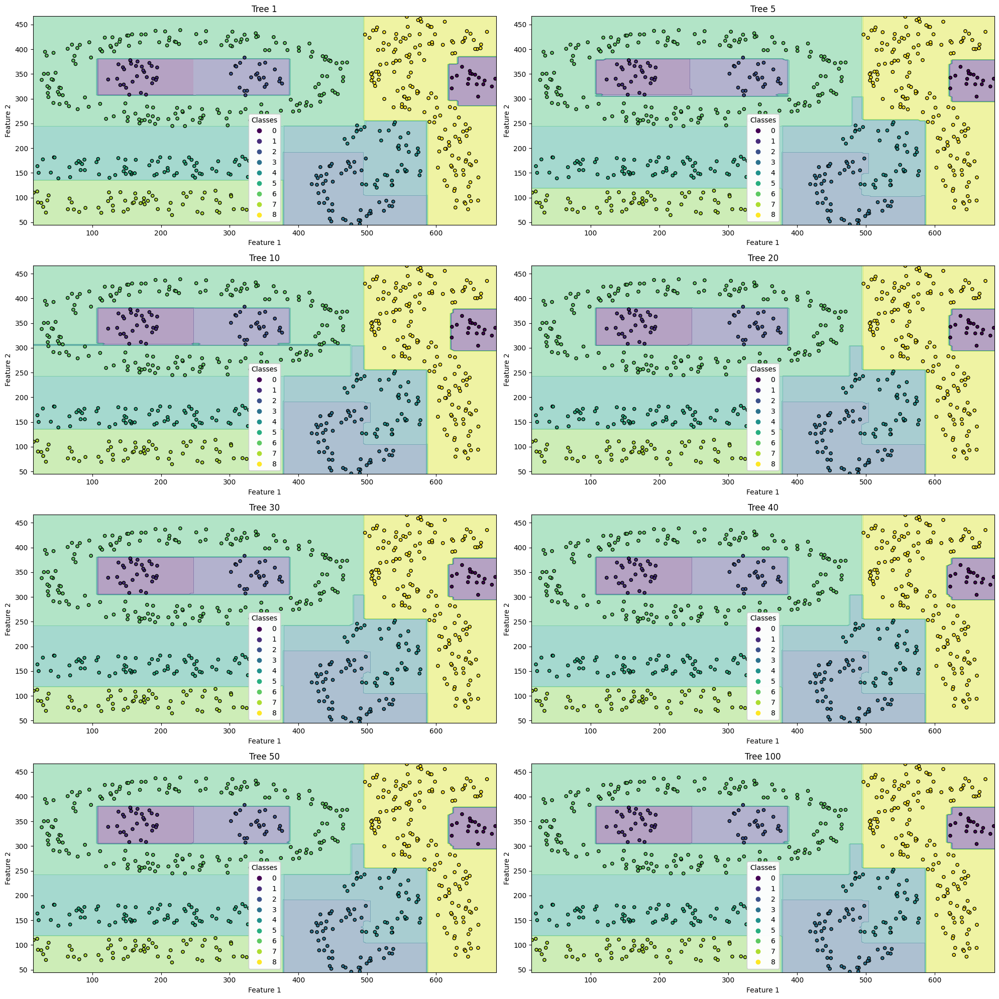

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter tuning for Bagging
param_grid = {
    'n_estimators': [10, 50, 100],
    'base_estimator__max_depth': [3, 5, 7],
    'max_samples': [0.5, 0.75, 1.0],
    'max_features': [0.5, 0.75, 1.0]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(BaggingClassifier(base_estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Visualize individual trees
def plot_decision_boundary(X, y, model, ax, title):
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    scatter = ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=20, edgecolor='k')
    legend = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend)
    ax.set_title(title)
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.figure(figsize=(20, 20))
n_trees = [1, 5, 10, 20, 30, 40, 50, 100]

for i, n in enumerate(n_trees):
    tree_model = BaggingClassifier(base_estimator=base_estimator, n_estimators=n, random_state=42)
    tree_model.fit(X_train, y_train)
    ax = plt.subplot(4, 2, i + 1)
    plot_decision_boundary(X_test, y_test, tree_model, ax, f'Tree {n}')

plt.tight_layout()
plt.show()


Detailed Performance Analysis:

Confusion matrices provide a detailed breakdown of the model’s predictions, showing the counts of true positives, true negatives, false positives, and false negatives. This helps in understanding how well the model distinguishes between different classes.
Error Analysis:

By analyzing the confusion matrix, you can identify specific classes where the model is performing poorly, leading to targeted improvements. For instance, you can see if the model is frequently misclassifying one class as another.
Training vs. Test Performance:

Comparing the confusion matrices of the training and test sets helps in assessing whether the model is overfitting or underfitting. Large discrepancies between training and test performance may indicate that the model is not generalizing well.

In [ ]:
def plot_decision_boundary(clf, X, y, title):
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.3)
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, edgecolors='k', marker='o')
    plt.title(title)
    plt.show()

plot_decision_boundary(bagging, X_train, y_train, "Bagging Decision Boundary (Train)")
plot_decision_boundary(bagging, X_test, y_test, "Bagging Decision Boundary (Test)")

# Visualize the predicted output of 5 individual Decision Trees
for i in range(5):
    tree = bagging.estimators_[i]
    plot_decision_boundary(tree, X_train, y_train, f"Decision Tree {i+1} Decision Boundary (Train)")
    plot_decision_boundary(tree, X_test, y_test, f"Decision Tree {i+1} Decision Boundary (Test)")

NameError: name 'bagging' is not defined

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.1): [1.         0.95918367 0.95833333 0.95833333 0.97916667]
Mean CV Score (Dataset fraction 0.1): 0.9710034013605442
Dataset fraction: 0.1
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.96
Test Recall: 0.95
Test F1 Score: 0.95
Test Accuracy: 0.95


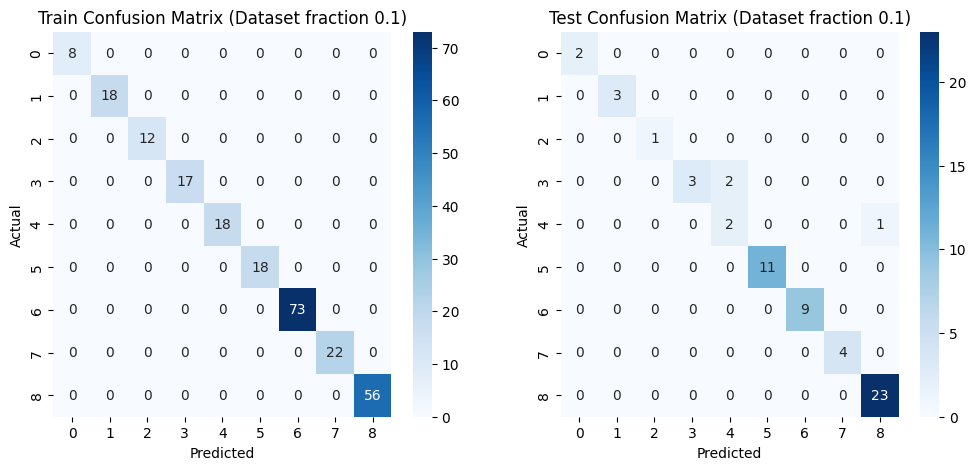

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.2): [0.98969072 0.98969072 0.98969072 0.97938144 0.96875   ]
Mean CV Score (Dataset fraction 0.2): 0.9834407216494846
Dataset fraction: 0.2
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


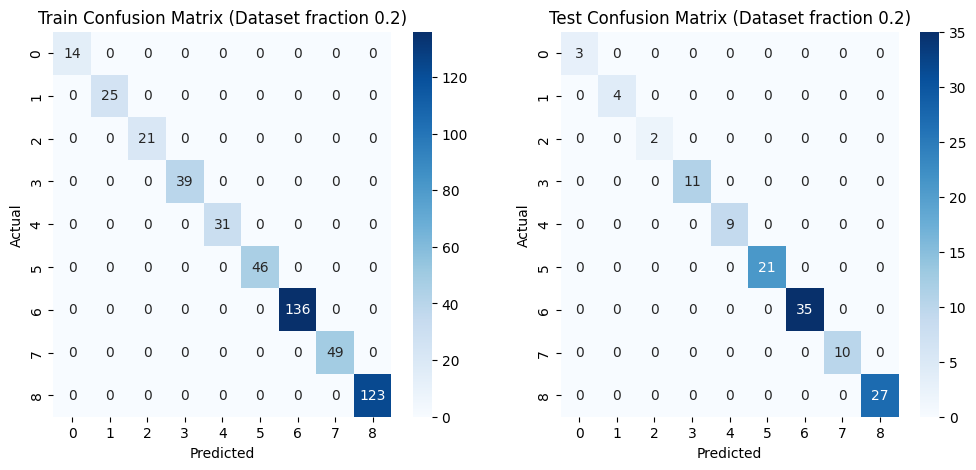

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.5): [1.         0.99588477 1.         0.99173554 0.99173554]
Mean CV Score (Dataset fraction 0.5): 0.9958711696085434
Dataset fraction: 0.5
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


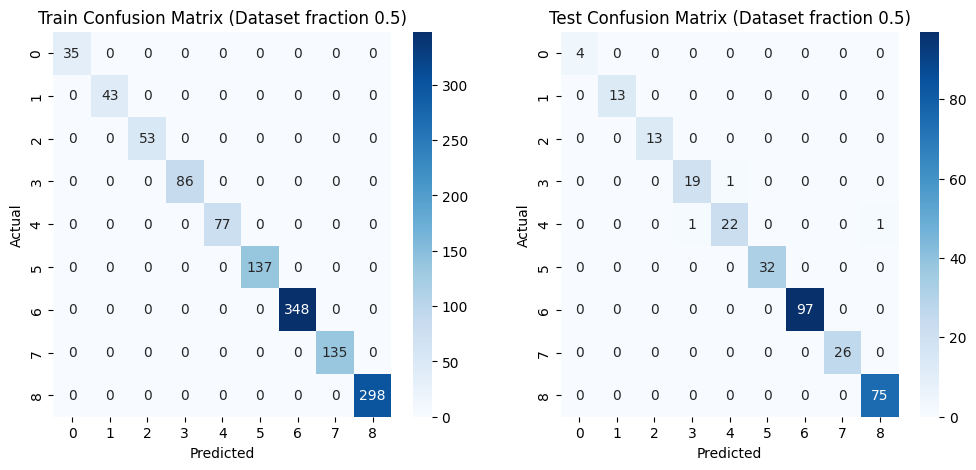

Stratified K-Fold Cross-Validation Scores (Dataset fraction 1.0): [1.         1.         0.99587629 0.98969072 0.99793388]
Mean CV Score (Dataset fraction 1.0): 0.9967001789213598
Dataset fraction: 1.0
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


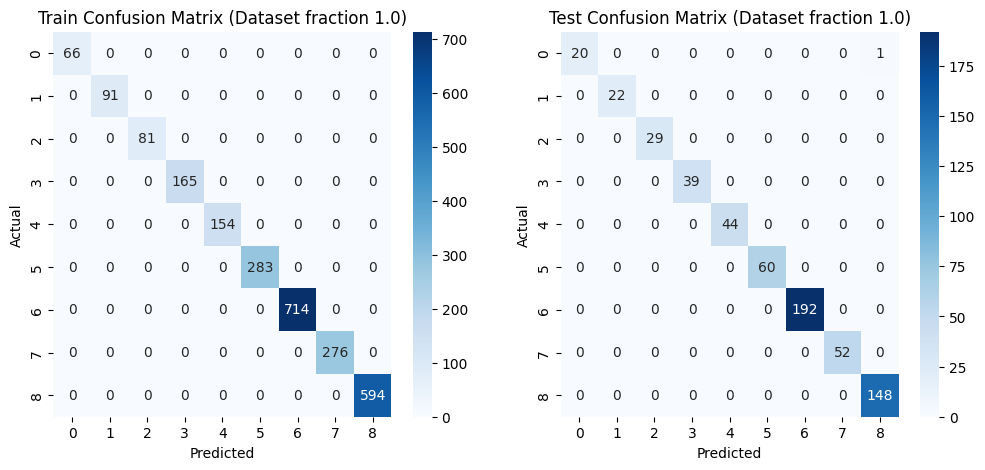

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Function to perform evaluation
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

# Increase the dataset size incrementally
for frac in [0.1, 0.2, 0.5, 1.0]:
    data_subset = data_full.sample(frac=frac, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(data_subset[['Feature 1', 'Feature 2']], data_subset['Label'], test_size=0.2, random_state=42)

    # Implement Random Forest with StratifiedKFold cross-validation for hyperparameter tuning
    random_forest = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
    skf = StratifiedKFold(n_splits=5)
    scores = cross_val_score(random_forest, X_train, y_train, cv=skf, scoring='accuracy')
    print(f"Stratified K-Fold Cross-Validation Scores (Dataset fraction {frac}): {scores}")
    print(f"Mean CV Score (Dataset fraction {frac}): {scores.mean()}")

    # Evaluate the model
    precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, random_forest)

    # Print the results
    print(f"Dataset fraction: {frac}")
    print(f"Train Precision: {precision_train:.2f}")
    print(f"Train Recall: {recall_train:.2f}")
    print(f"Train F1 Score: {f1_train:.2f}")
    print(f"Train Accuracy: {accuracy_train:.2f}")

    print(f"Test Precision: {precision_test:.2f}")
    print(f"Test Recall: {recall_test:.2f}")
    print(f"Test F1 Score: {f1_test:.2f}")
    print(f"Test Accuracy: {accuracy_test:.2f}")

    # Confusion matrices
    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.subplot(1, 2, 2)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.show()


Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.1): [1.         0.95918367 0.95833333 0.95833333 0.97916667]
Mean CV Score (Dataset fraction 0.1): 0.9710034013605442
Dataset fraction: 0.1
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.96
Test Recall: 0.95
Test F1 Score: 0.95
Test Accuracy: 0.95


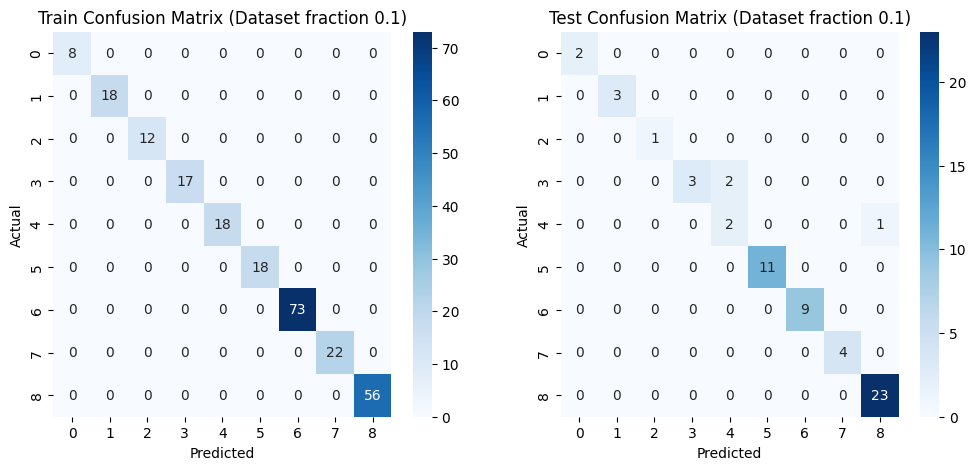

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.2): [0.98969072 0.98969072 0.98969072 0.97938144 0.96875   ]
Mean CV Score (Dataset fraction 0.2): 0.9834407216494846
Dataset fraction: 0.2
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


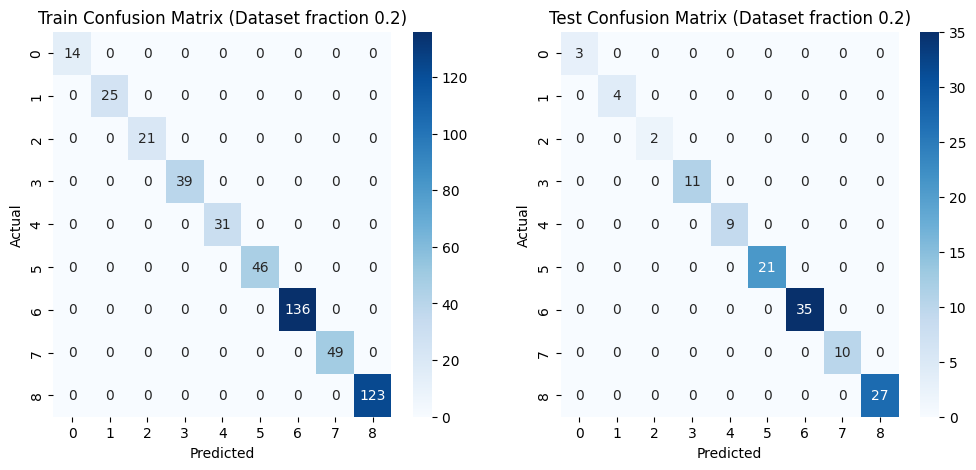

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.5): [1.         0.99588477 1.         0.99173554 0.99173554]
Mean CV Score (Dataset fraction 0.5): 0.9958711696085434
Dataset fraction: 0.5
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


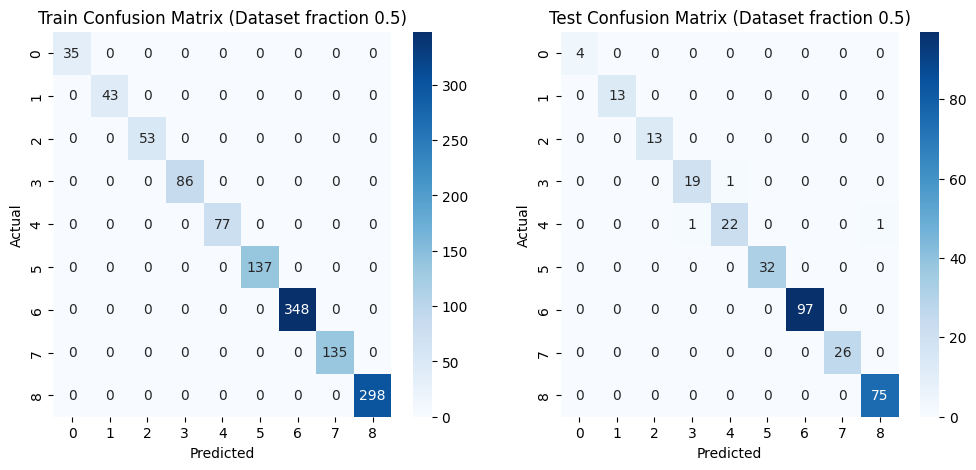

Stratified K-Fold Cross-Validation Scores (Dataset fraction 1.0): [1.         1.         0.99587629 0.98969072 0.99793388]
Mean CV Score (Dataset fraction 1.0): 0.9967001789213598
Dataset fraction: 1.0
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


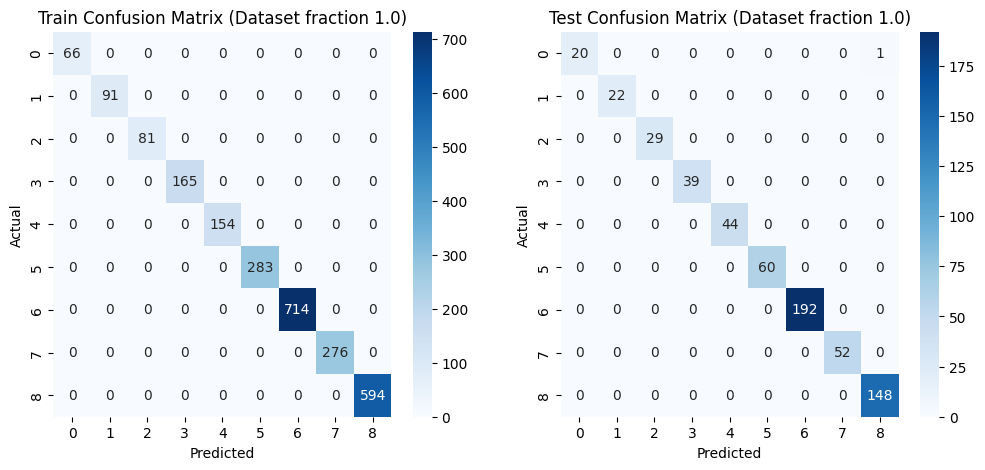

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Dataset fraction: 0.1
Train Precision: 0.75
Train Recall: 0.84
Train F1 Score: 0.78
Train Accuracy: 0.84
Test Precision: 0.81
Test Recall: 0.85
Test F1 Score: 0.82
Test Accuracy: 0.85


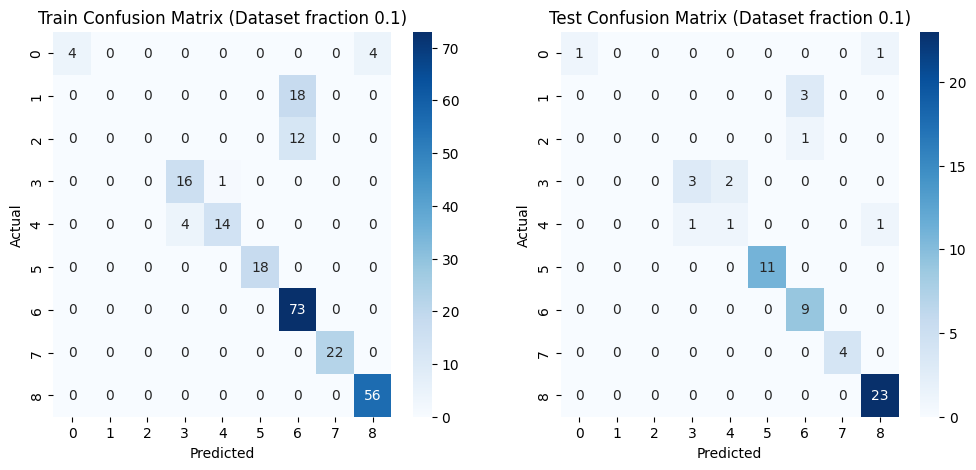

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Dataset fraction: 0.2
Train Precision: 0.75
Train Recall: 0.82
Train F1 Score: 0.78
Train Accuracy: 0.82
Test Precision: 0.84
Test Recall: 0.88
Test F1 Score: 0.85
Test Accuracy: 0.88


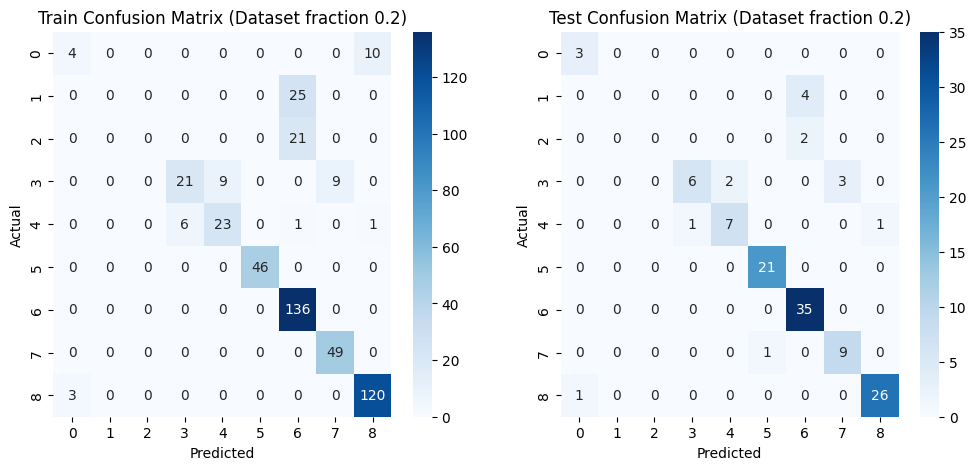

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Dataset fraction: 0.5
Train Precision: 0.70
Train Recall: 0.82
Train F1 Score: 0.76
Train Accuracy: 0.82
Test Precision: 0.70
Test Recall: 0.80
Test F1 Score: 0.74
Test Accuracy: 0.80


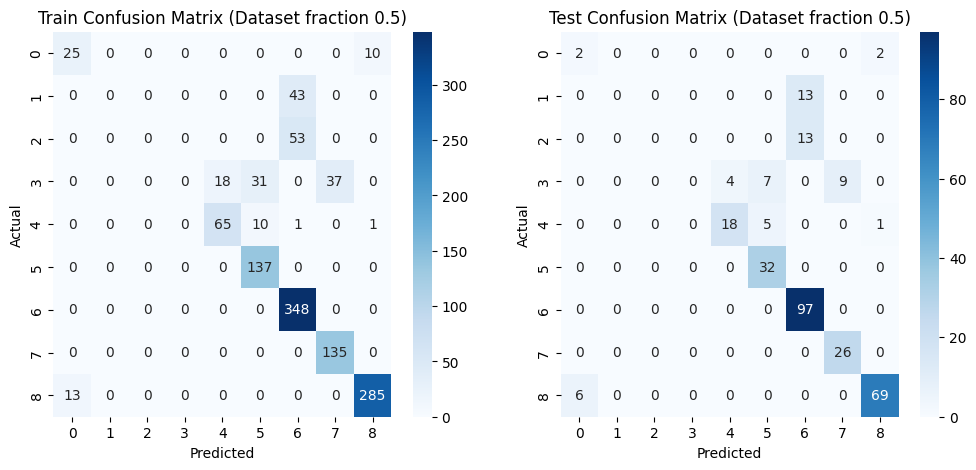

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Dataset fraction: 1.0
Train Precision: 0.71
Train Recall: 0.83
Train F1 Score: 0.76
Train Accuracy: 0.83
Test Precision: 0.69
Test Recall: 0.81
Test F1 Score: 0.74
Test Accuracy: 0.81


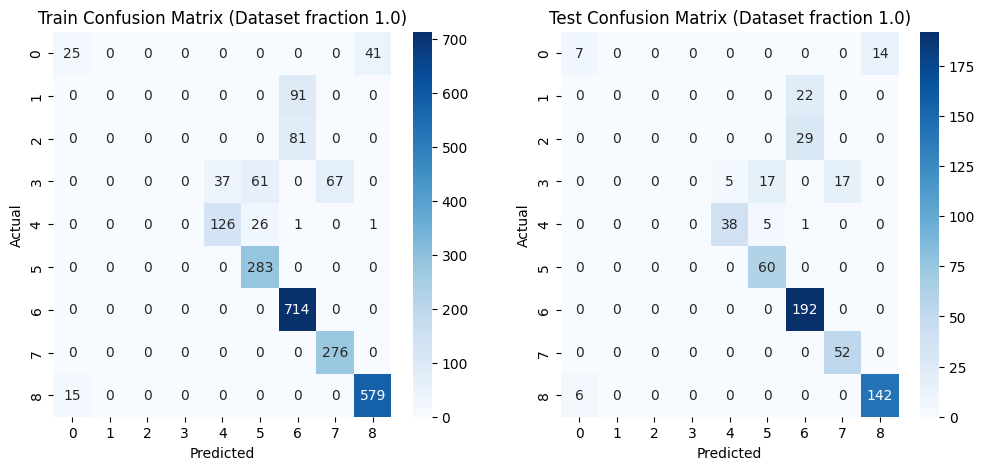

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
import numpy as np

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Function to perform evaluation
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

# Increase the dataset size incrementally
for frac in [0.1, 0.2, 0.5, 1.0]:
    data_subset = data_full.sample(frac=frac, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(data_subset[['Feature 1', 'Feature 2']], data_subset['Label'], test_size=0.2, random_state=42)

    # Implement Random Forest with StratifiedKFold cross-validation for hyperparameter tuning
    random_forest = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
    skf = StratifiedKFold(n_splits=5)
    scores = cross_val_score(random_forest, X_train, y_train, cv=skf, scoring='accuracy')
    print(f"Stratified K-Fold Cross-Validation Scores (Dataset fraction {frac}): {scores}")
    print(f"Mean CV Score (Dataset fraction {frac}): {scores.mean()}")

    # Evaluate the model
    precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, random_forest)

    # Print the results
    print(f"Dataset fraction: {frac}")
    print(f"Train Precision: {precision_train:.2f}")
    print(f"Train Recall: {recall_train:.2f}")
    print(f"Train F1 Score: {f1_train:.2f}")
    print(f"Train Accuracy: {accuracy_train:.2f}")

    print(f"Test Precision: {precision_test:.2f}")
    print(f"Test Recall: {recall_test:.2f}")
    print(f"Test F1 Score: {f1_test:.2f}")
    print(f"Test Accuracy: {accuracy_test:.2f}")

    # Confusion matrices
    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.subplot(1, 2, 2)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.show()

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Increase the dataset size incrementally
for frac in [0.1, 0.2, 0.5, 1.0]:
    data_subset = data_full.sample(frac=frac, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(data_subset[['Feature 1', 'Feature 2']], data_subset['Label'], test_size=0.2, random_state=42)

    # Implement Bagging with the updated parameter name and tuned parameters
    bagging = BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=3), n_estimators=20, random_state=42)
    bagging.fit(X_train, y_train)

    # Predict and evaluate
    y_pred_train = bagging.predict(X_train)
    y_pred_test = bagging.predict(X_test)

    # Calculate metrics with appropriate averaging method
    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    # Print the results
    print(f"Dataset fraction: {frac}")
    print(f"Train Precision: {precision_train:.2f}")
    print(f"Train Recall: {recall_train:.2f}")
    print(f"Train F1 Score: {f1_train:.2f}")
    print(f"Train Accuracy: {accuracy_train:.2f}")

    print(f"Test Precision: {precision_test:.2f}")
    print(f"Test Recall: {recall_test:.2f}")
    print(f"Test F1 Score: {f1_test:.2f}")
    print(f"Test Accuracy: {accuracy_test:.2f}")

    # Confusion matrices
    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.subplot(1, 2, 2)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier

def plot_decision_boundary(clf, X, y, title):
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.3)
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, edgecolors='k', marker='o')
    plt.title(title)
    plt.show()

plot_decision_boundary(bagging, X_train, y_train, "Bagging Decision Boundary (Train)")
plot_decision_boundary(bagging, X_test, y_test, "Bagging Decision Boundary (Test)")

# Visualize the predicted output of 5 individual Decision Trees
for i in range(5):
    tree = bagging.estimators_[i]
    plot_decision_boundary(tree, X_train, y_train, f"Decision Tree {i+1} Decision Boundary (Train)")
    plot_decision_boundary(tree, X_test, y_test, f"Decision Tree {i+1} Decision Boundary (Test)")

### **Random Forest**

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.1): [1.         0.95918367 0.97916667 0.97916667 1.        ]
Mean CV Score (Dataset fraction 0.1): 0.983503401360544
Dataset fraction: 0.1
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.96
Test Recall: 0.95
Test F1 Score: 0.95
Test Accuracy: 0.95


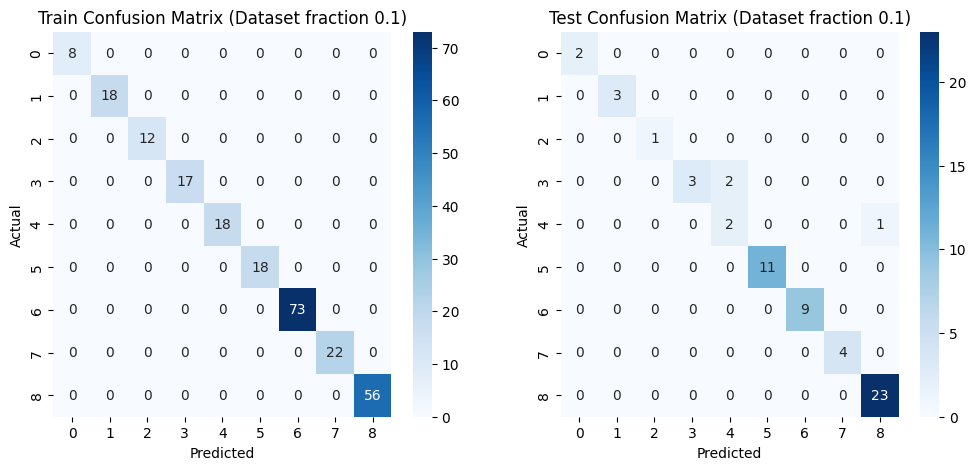

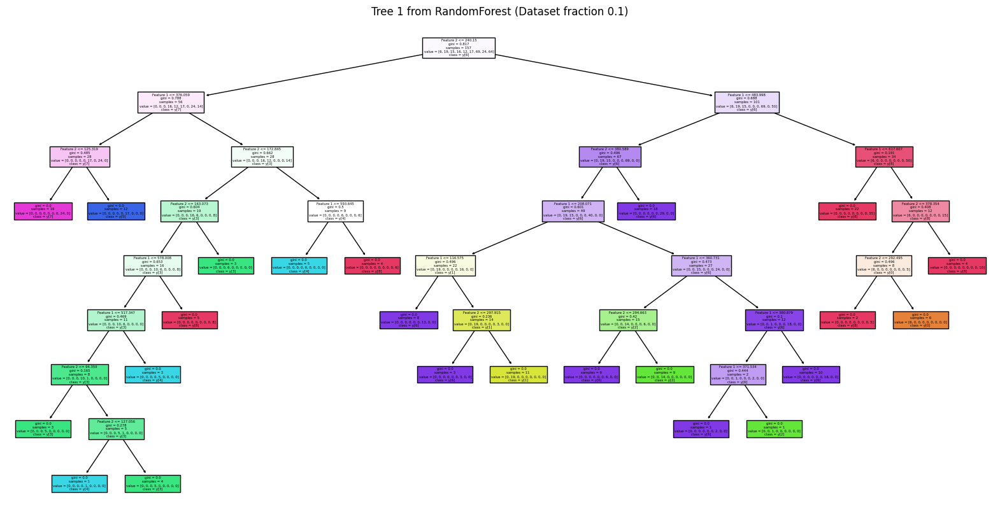

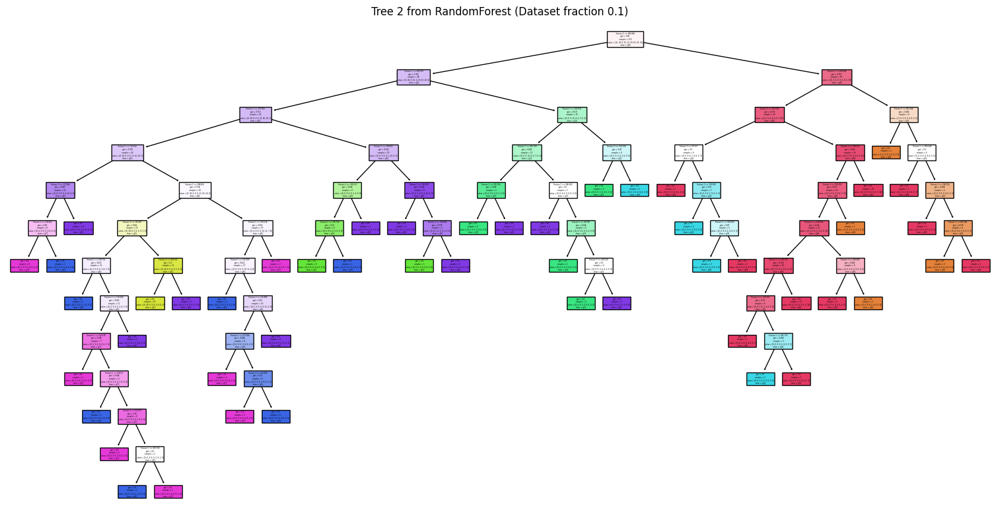

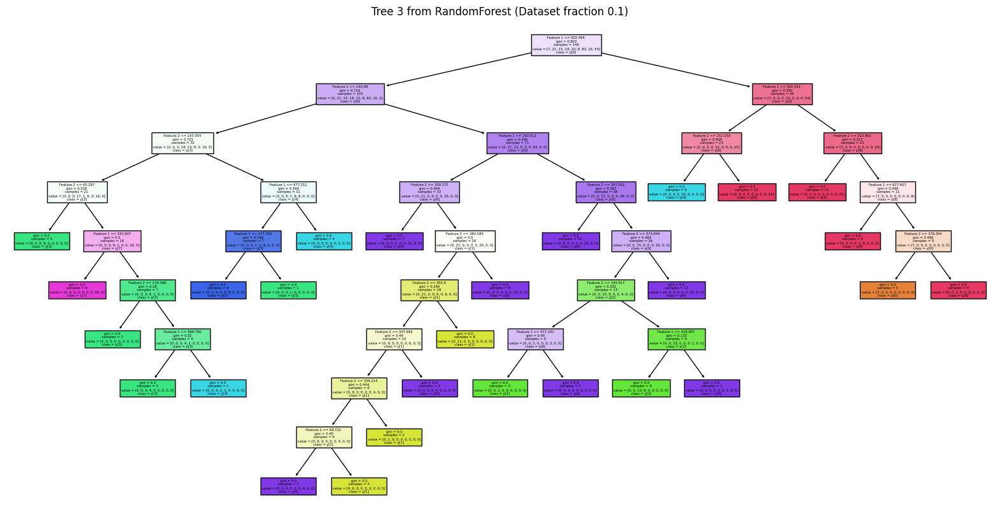

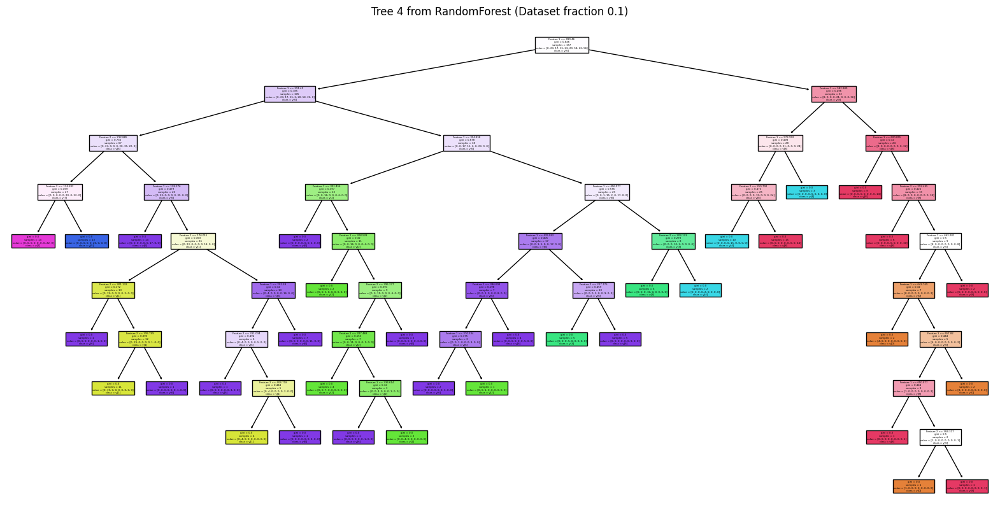

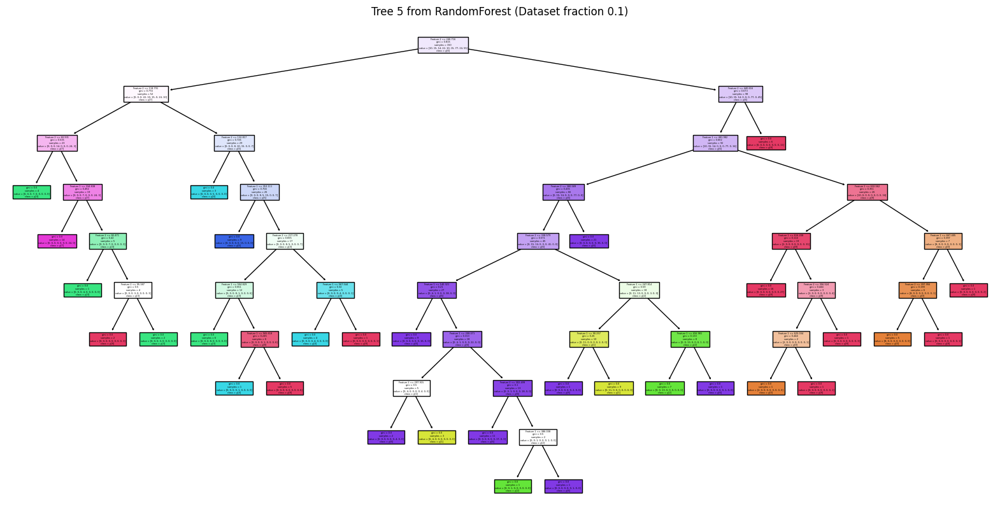

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.2): [0.98969072 0.98969072 0.98969072 0.98969072 0.97916667]
Mean CV Score (Dataset fraction 0.2): 0.987585910652921
Dataset fraction: 0.2
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


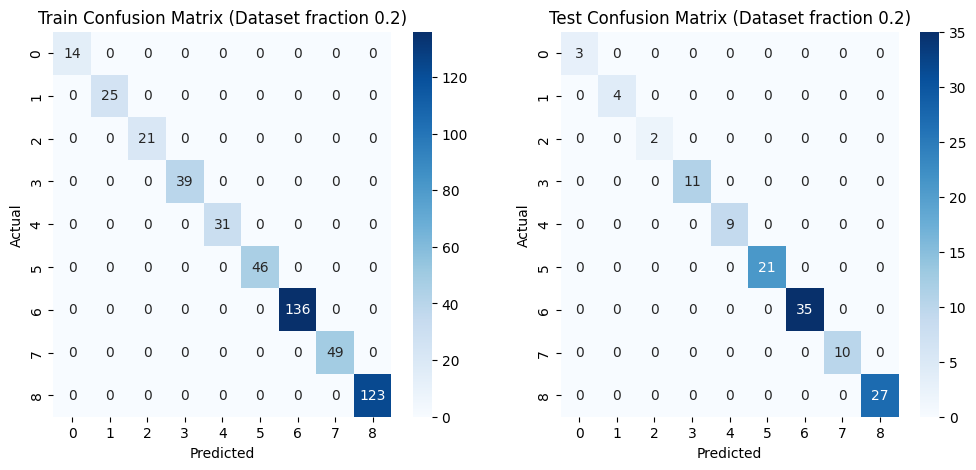

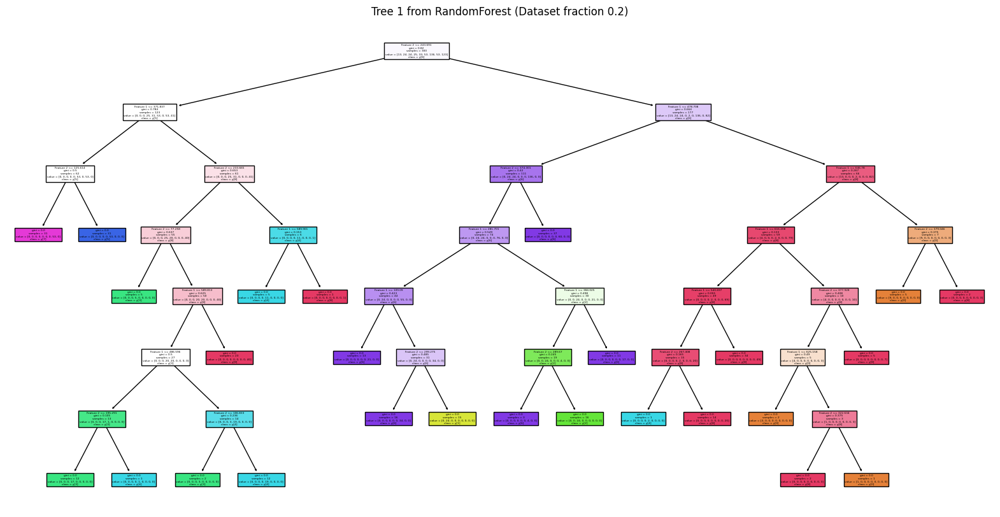

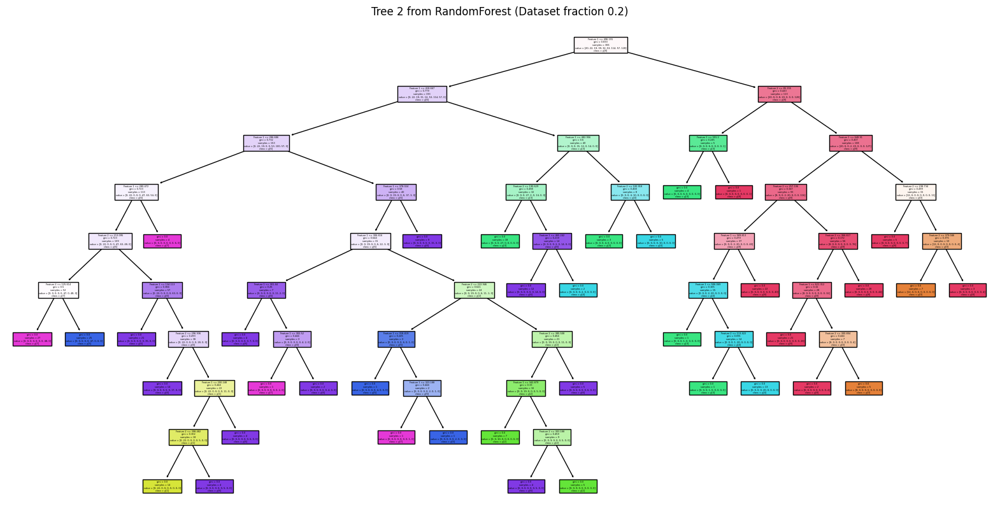

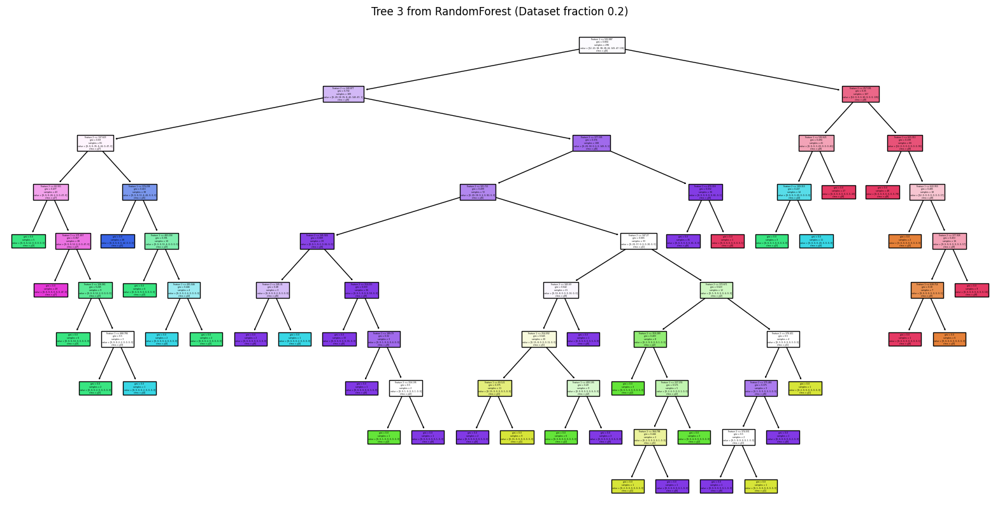

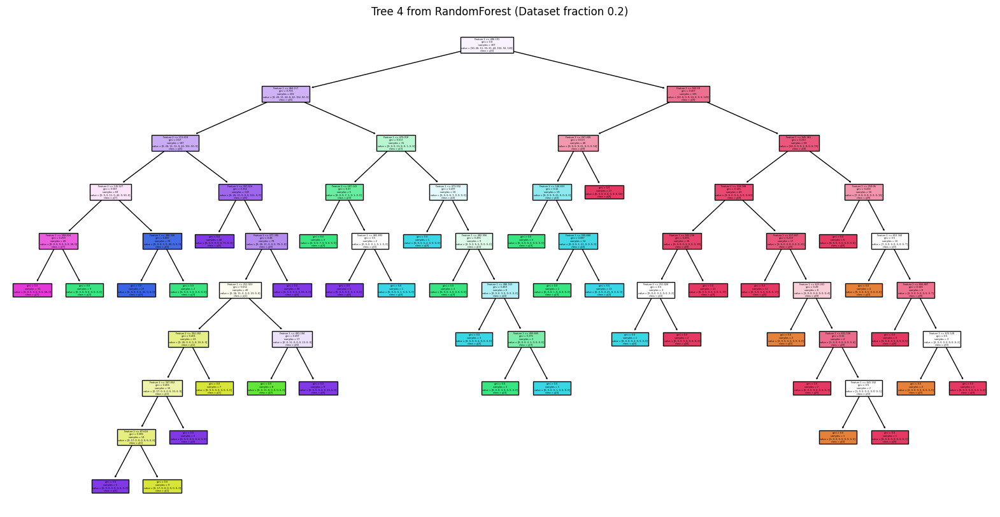

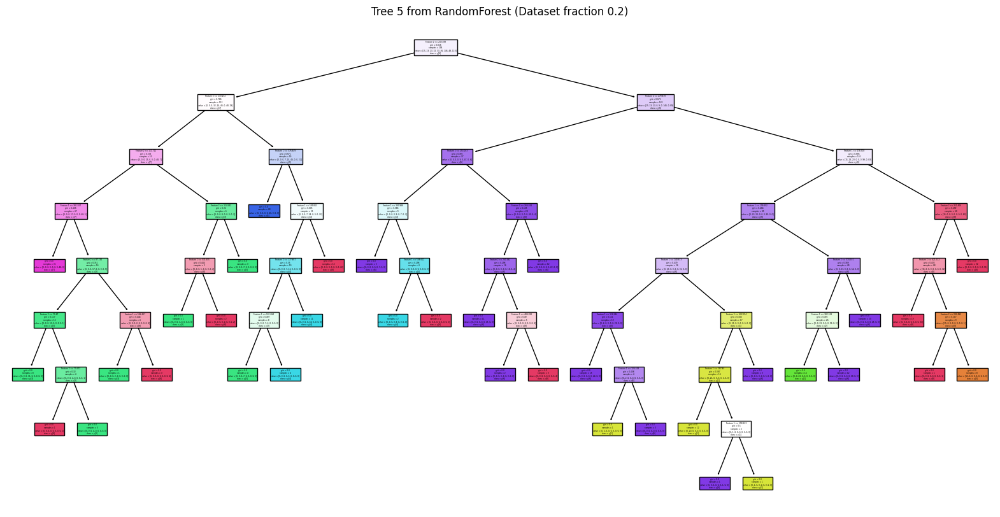

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.5): [1.         0.99588477 1.         0.99586777 0.99173554]
Mean CV Score (Dataset fraction 0.5): 0.9966976158895351
Dataset fraction: 0.5
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


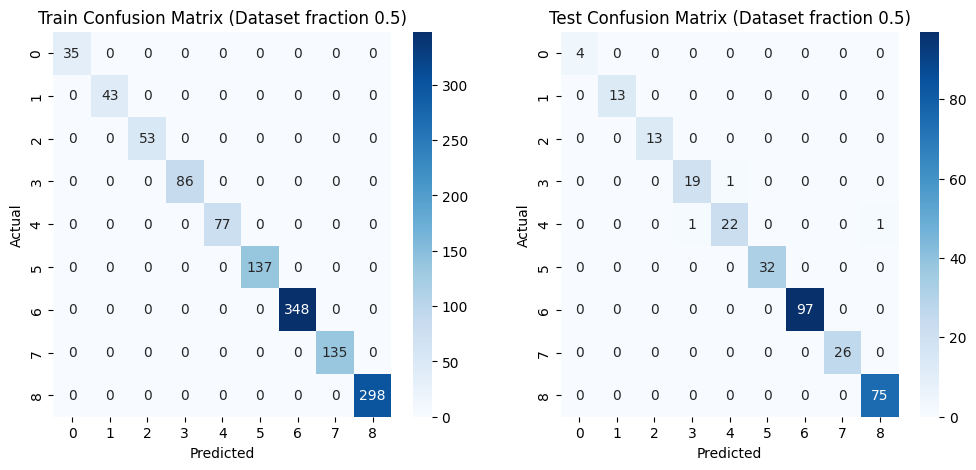

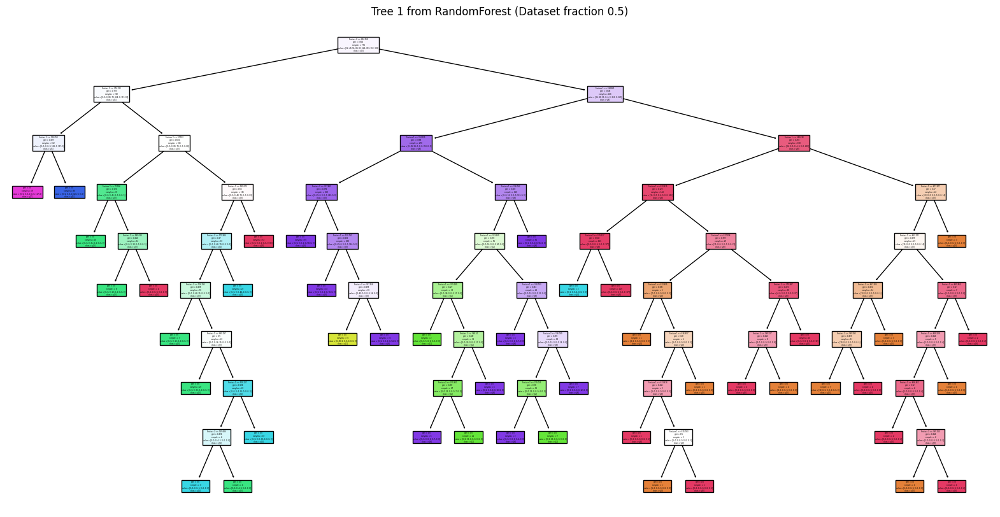

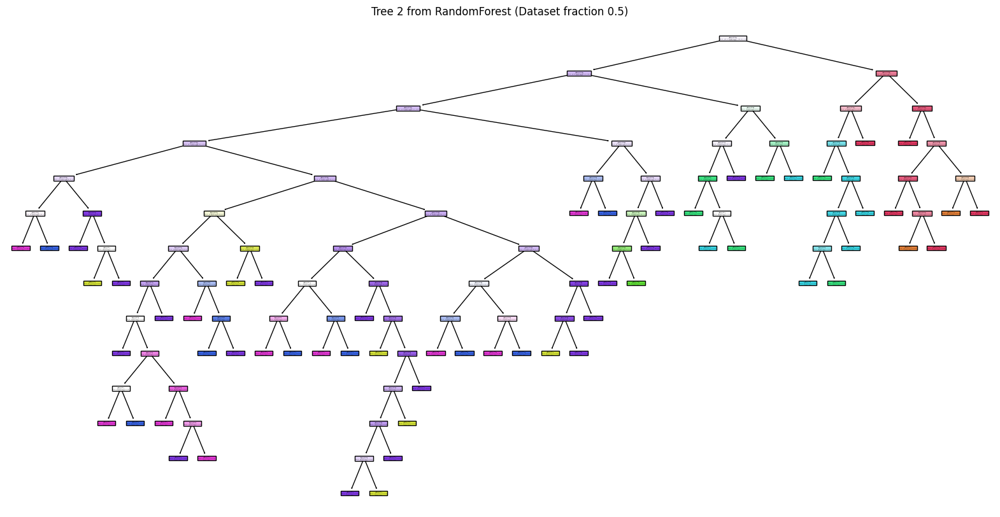

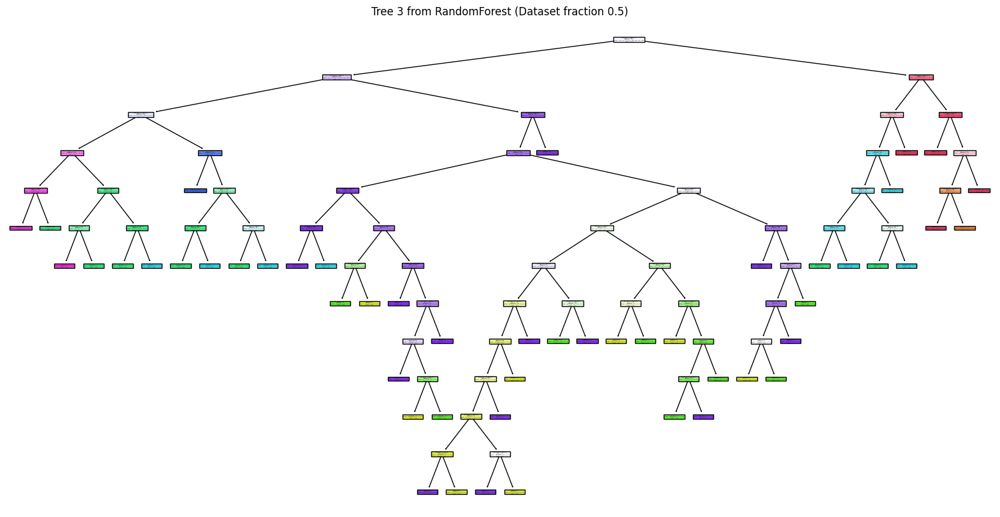

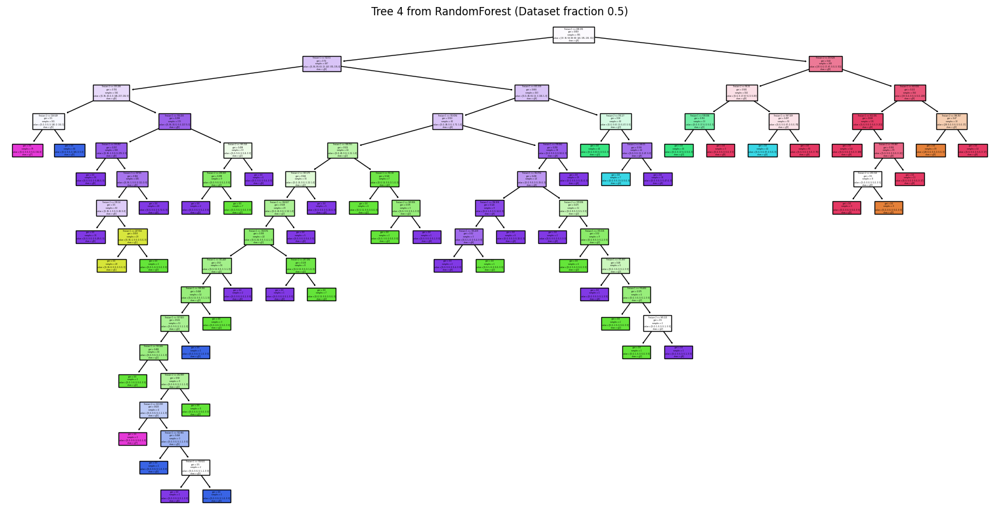

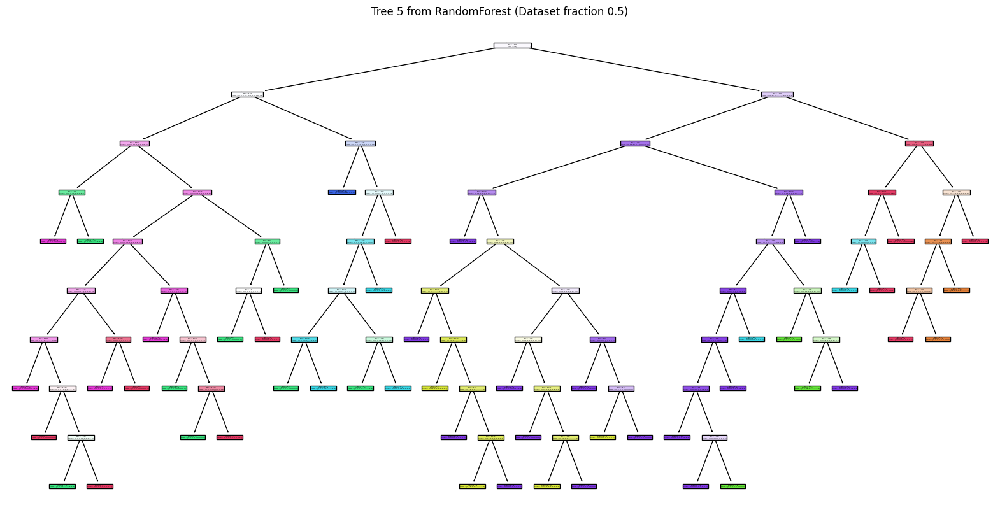

Stratified K-Fold Cross-Validation Scores (Dataset fraction 1.0): [0.99793814 1.         0.99587629 0.99175258 0.99793388]
Mean CV Score (Dataset fraction 1.0): 0.9967001789213598
Dataset fraction: 1.0
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


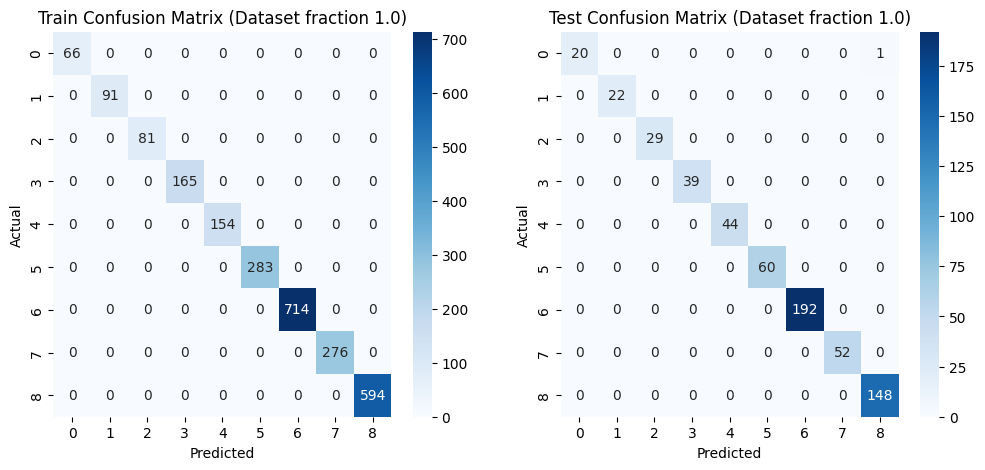

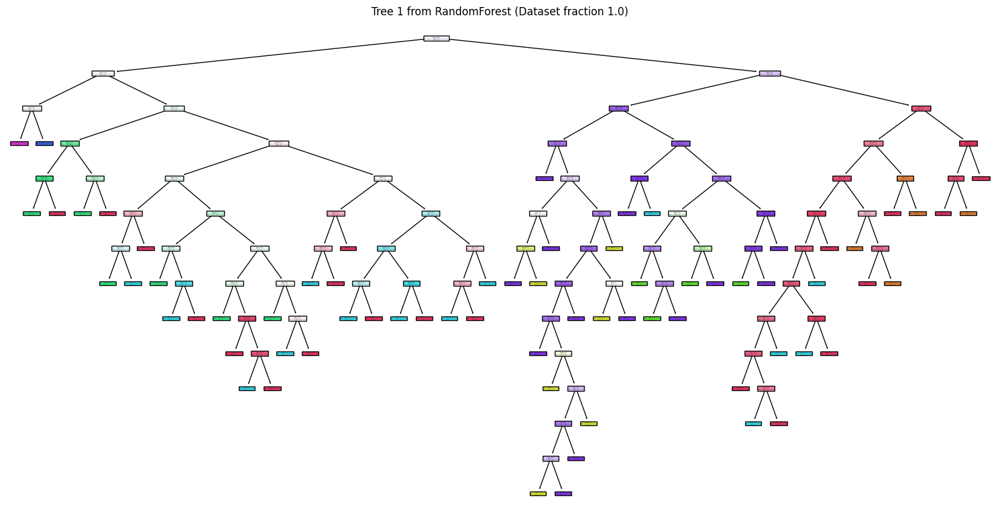

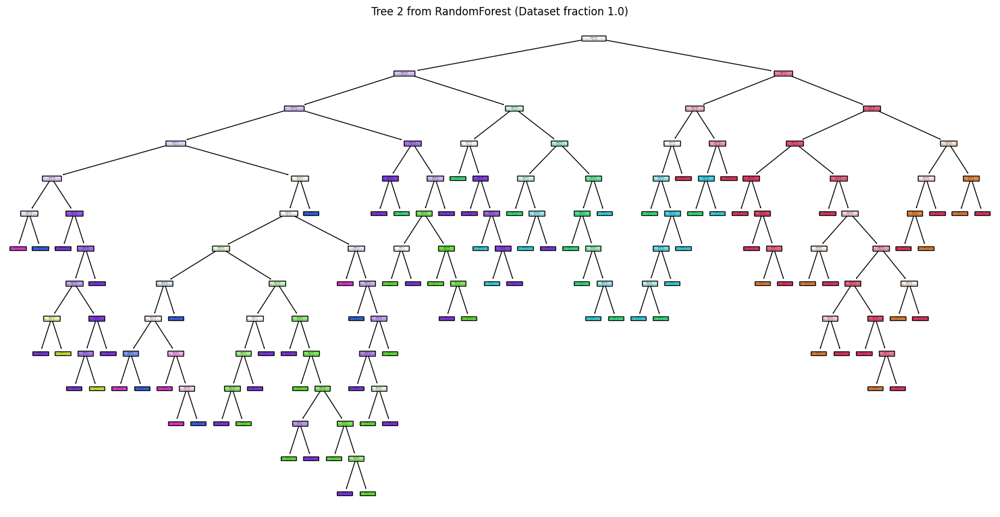

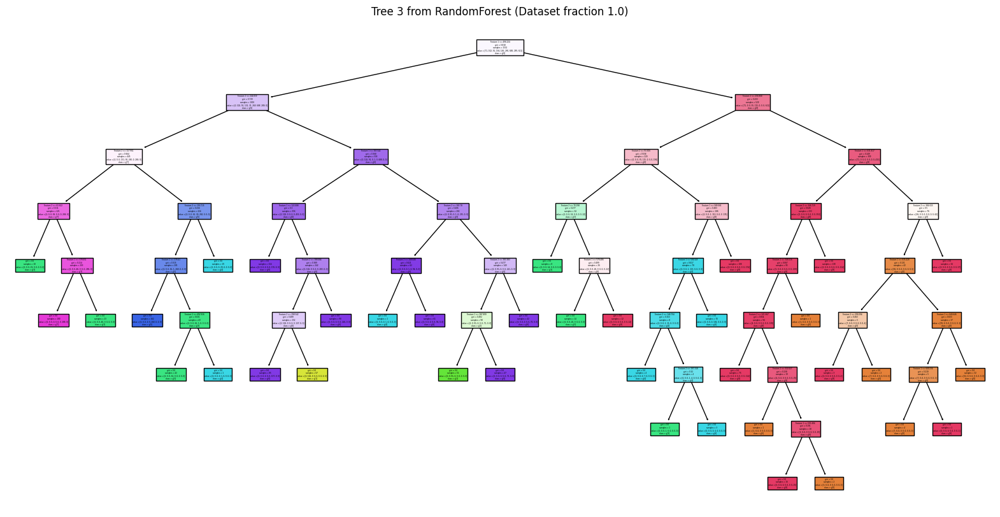

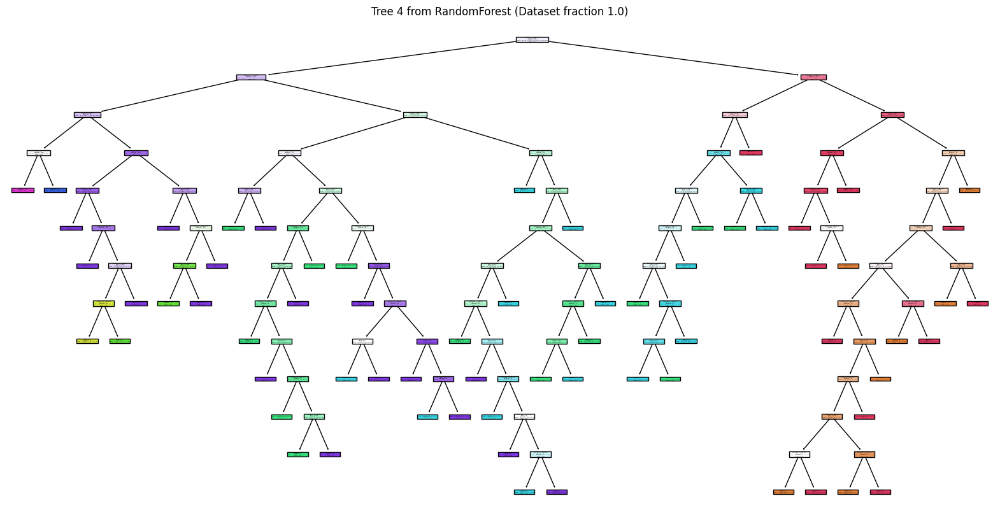

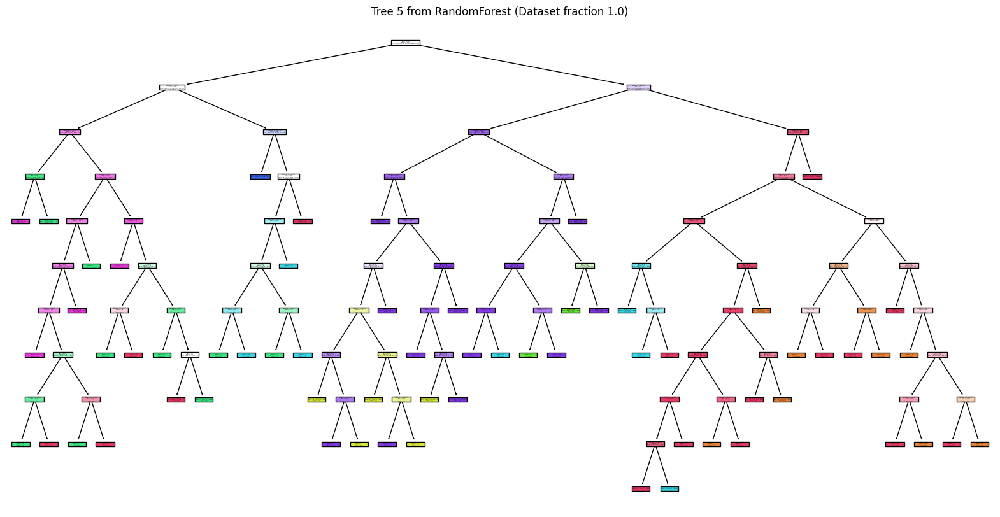

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.tree import plot_tree

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Function to perform evaluation
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

# Increase the dataset size incrementally
for frac in [0.1, 0.2, 0.5, 1.0]:
    data_subset = data_full.sample(frac=frac, random_state=42)
    X = data_subset.drop('Label', axis=1)
    y = data_subset['Label']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Hyperparameter tuning
    param_grid = {
        'n_estimators': [100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10]
    }
    grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    # Implement Random Forest with StratifiedKFold cross-validation
    skf = StratifiedKFold(n_splits=5)
    scores = cross_val_score(best_model, X_train, y_train, cv=skf, scoring='accuracy')
    print(f"Stratified K-Fold Cross-Validation Scores (Dataset fraction {frac}): {scores}")
    print(f"Mean CV Score (Dataset fraction {frac}): {scores.mean()}")

    # Evaluate the model
    precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

    # Print the results
    print(f"Dataset fraction: {frac}")
    print(f"Train Precision: {precision_train:.2f}")
    print(f"Train Recall: {recall_train:.2f}")
    print(f"Train F1 Score: {f1_train:.2f}")
    print(f"Train Accuracy: {accuracy_train:.2f}")

    print(f"Test Precision: {precision_test:.2f}")
    print(f"Test Recall: {recall_test:.2f}")
    print(f"Test F1 Score: {f1_test:.2f}")
    print(f"Test Accuracy: {accuracy_test:.2f}")

    # Confusion matrices
    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.subplot(1, 2, 2)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.show()

    # Visualize five trees from the RandomForestClassifier
    for i, tree_in_forest in enumerate(best_model.estimators_[:5]):
        plt.figure(figsize=(20, 10))
        plot_tree(tree_in_forest, filled=True, feature_names=X.columns, class_names=True)
        plt.title(f'Tree {i+1} from RandomForest (Dataset fraction {frac})')
        plt.show()


Fitting 5 folds for each of 60 candidates, totalling 300 fits


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


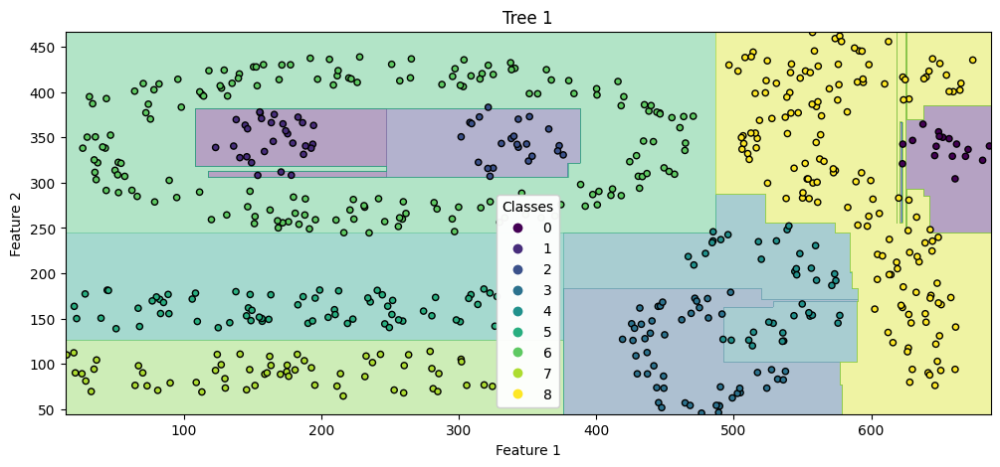

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

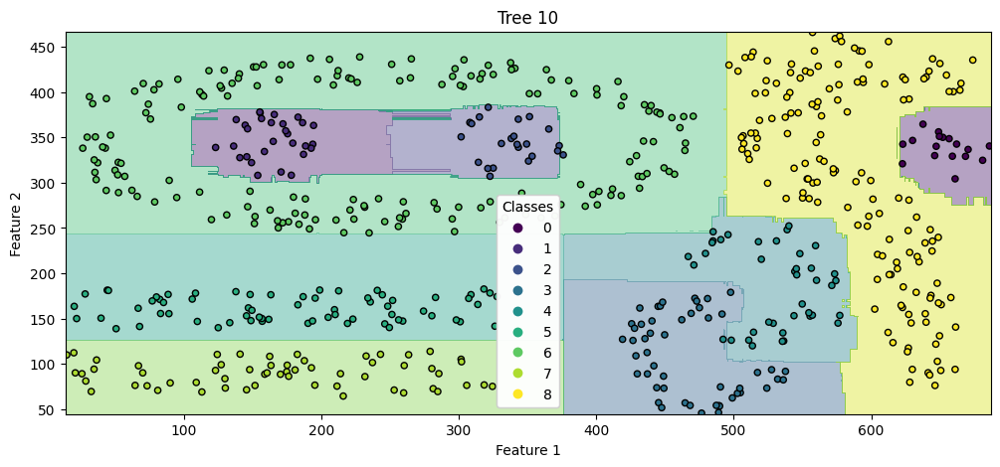

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

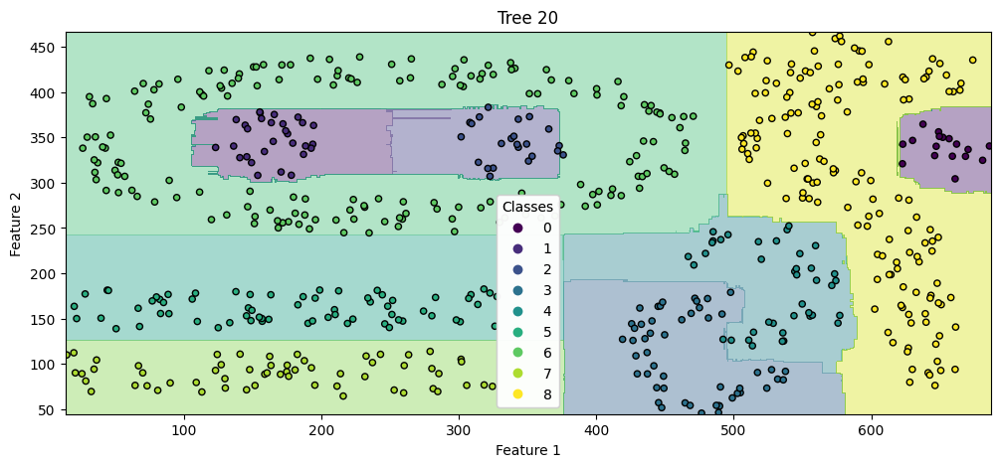

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

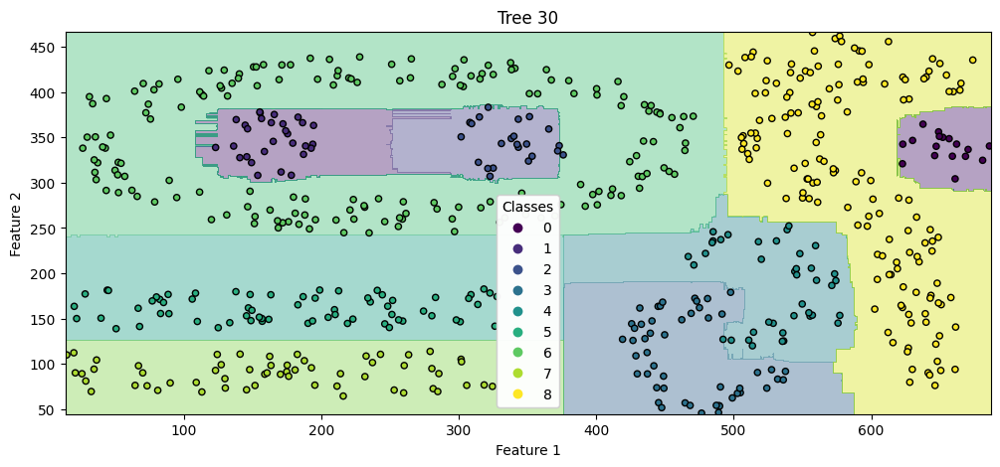

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

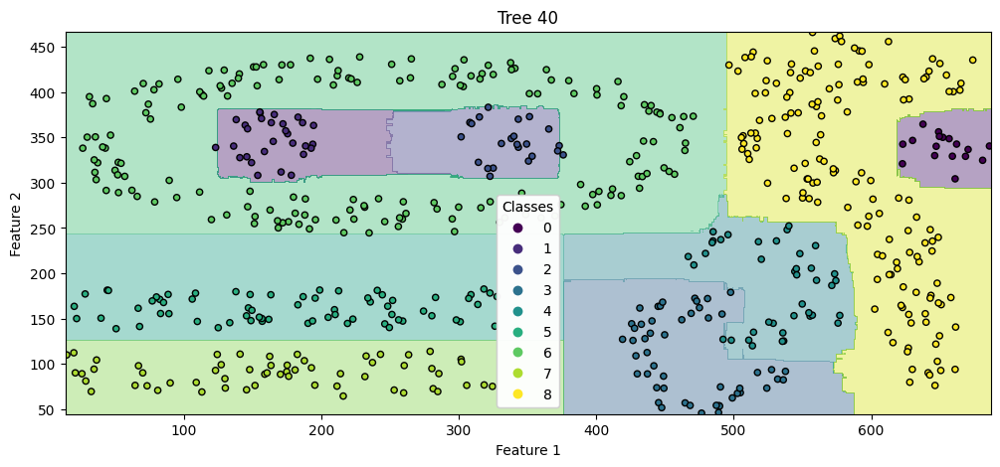

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

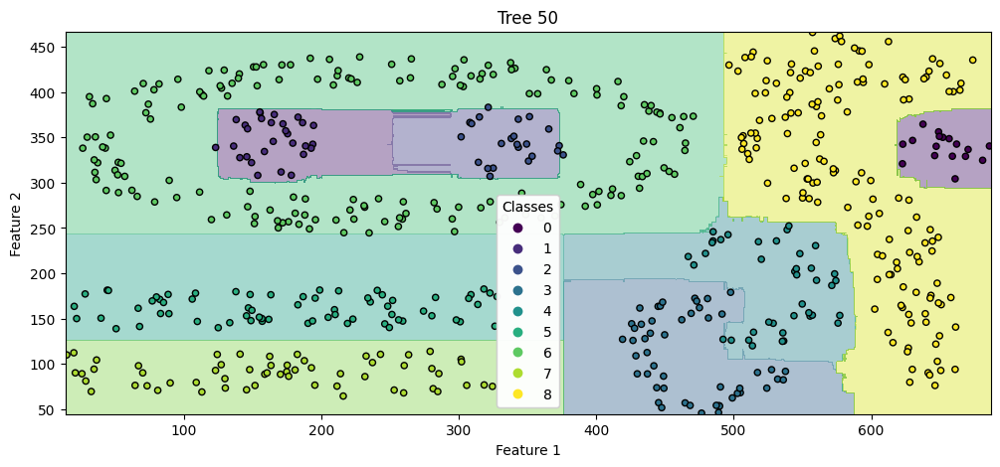

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

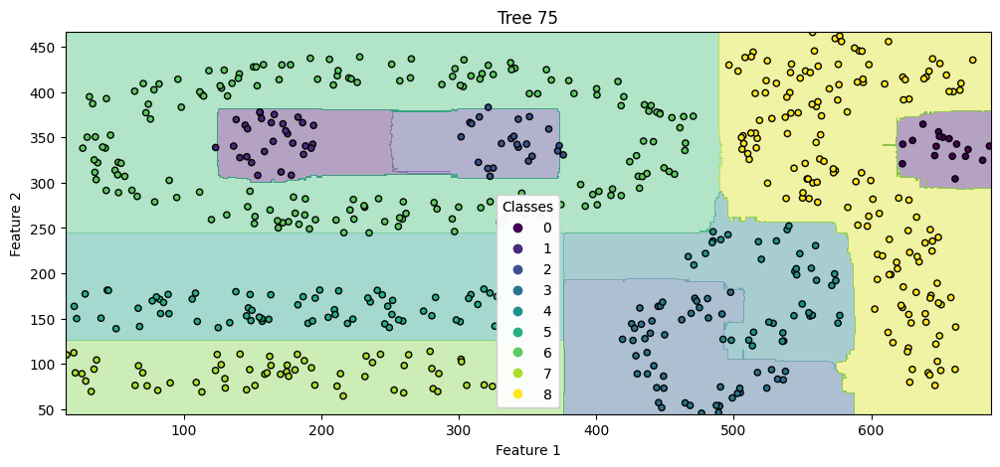

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

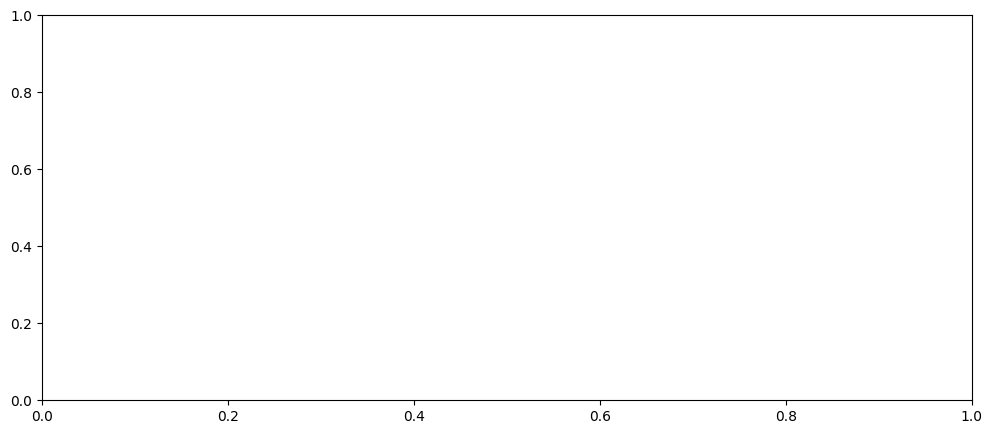

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Expanded hyperparameter tuning for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}
grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Function to plot decision boundaries
def plot_decision_boundary(X, y, model, ax, title):
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    scatter = ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=20, edgecolor='k')
    legend = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend)
    ax.set_title(title)
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

# Visualize stages of Random Forest
def plot_stage_performance(X_train, y_train, X_test, y_test, stage_indices):
    for i, stage in enumerate(stage_indices):
        model_stage = RandomForestClassifier(n_estimators=stage, max_depth=best_model.max_depth, min_samples_split=best_model.min_samples_split, random_state=42)
        model_stage.fit(X_train, y_train)

        # Plot decision boundaries
        plt.figure(figsize=(12, 5))
        ax = plt.subplot(1, 1, 1)
        plot_decision_boundary(pd.DataFrame(X_test, columns=['Feature 1', 'Feature 2']), y_test, model_stage, ax, f'Tree {stage}')
        plt.show()
        plt.clf()  # Clear the figure to free memory

# Select 8 stages for visualization
stages = [1, 10, 20, 30, 40, 50, 75, 100]
plot_stage_performance(X_train, y_train, X_test, y_test, stages)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter tuning for Random Forest
param_grid = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Function to plot decision boundaries
def plot_decision_boundary(X, y, model, ax, title):
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    scatter = ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=20, edgecolor='k')
    legend = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend)
    ax.set_title(title)
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

# Visualize stages of Random Forest
def plot_stage_performance(X_train, y_train, X_test, y_test, stage_indices):
    for i, stage in enumerate(stage_indices):
        model_stage = RandomForestClassifier(n_estimators=stage, max_depth=best_model.max_depth, min_samples_split=best_model.min_samples_split, min_samples_leaf=best_model.min_samples_leaf, random_state=42)
        model_stage.fit(X_train, y_train)

        # Plot decision boundaries
        plt.figure(figsize=(12, 5))
        ax = plt.subplot(1, 1, 1)
        plot_decision_boundary(pd.DataFrame(X_test, columns=['Feature 1', 'Feature 2']), y_test, model_stage, ax, f'Tree {stage}')
        plt.show()

# Select stages for visualization
stages = [10, 50, 100, 200]
plot_stage_performance(X_train, y_train, X_test, y_test, stages)


Fitting 5 folds for each of 144 candidates, totalling 720 fits


Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.1): [1.         0.95918367 0.97916667 0.97916667 1.        ]
Mean CV Score (Dataset fraction 0.1): 0.983503401360544
Dataset fraction: 0.1
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.96
Test Recall: 0.95
Test F1 Score: 0.95
Test Accuracy: 0.95


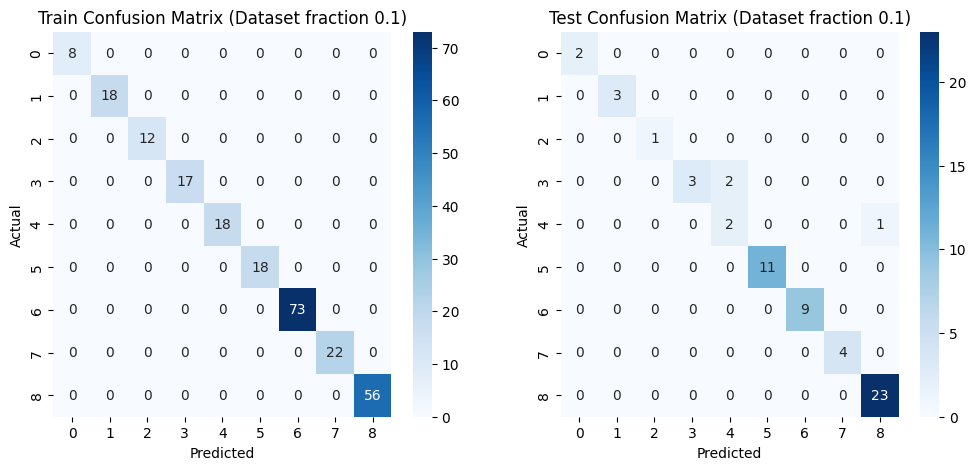

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.2): [0.98969072 0.98969072 0.98969072 0.98969072 0.97916667]
Mean CV Score (Dataset fraction 0.2): 0.987585910652921
Dataset fraction: 0.2
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


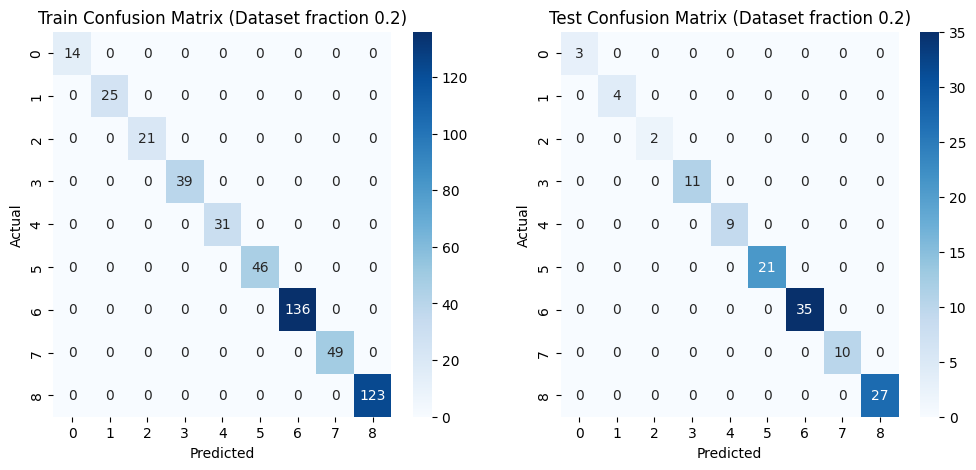

Stratified K-Fold Cross-Validation Scores (Dataset fraction 0.5): [1.         0.99588477 1.         0.99586777 0.99173554]
Mean CV Score (Dataset fraction 0.5): 0.9966976158895351
Dataset fraction: 0.5
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


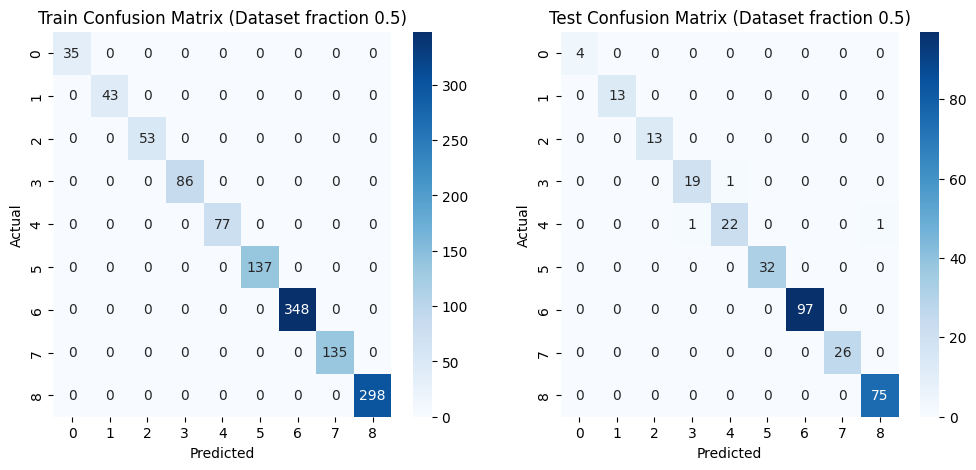

Stratified K-Fold Cross-Validation Scores (Dataset fraction 1.0): [0.99793814 1.         0.99587629 0.99175258 0.99793388]
Mean CV Score (Dataset fraction 1.0): 0.9967001789213598
Dataset fraction: 1.0
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 1.00
Test Recall: 1.00
Test F1 Score: 1.00
Test Accuracy: 1.00


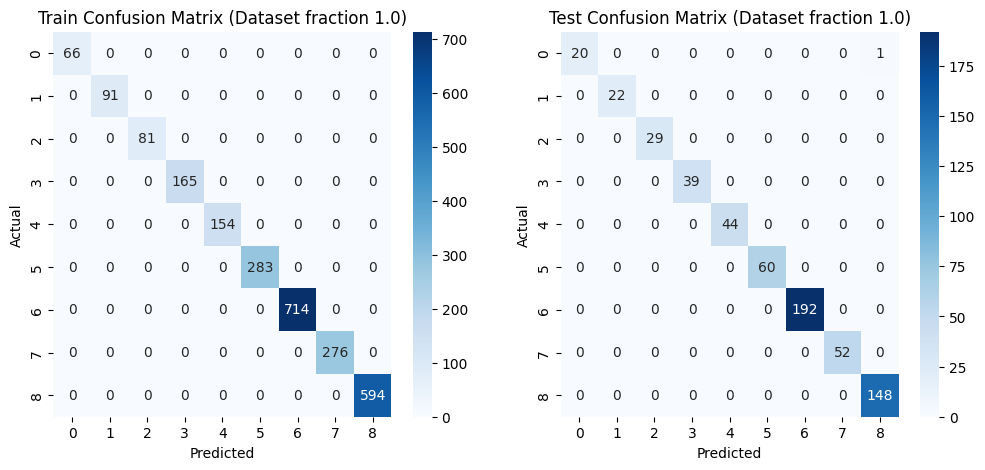

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.tree import plot_tree

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Function to perform evaluation
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

# Increase the dataset size incrementally
for frac in [0.1, 0.2, 0.5, 1.0]:
    data_subset = data_full.sample(frac=frac, random_state=42)
    X = data_subset.drop('Label', axis=1)
    y = data_subset['Label']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Hyperparameter tuning
    param_grid = {
        'n_estimators': [100, 200],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10]
    }
    grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    # Implement Random Forest with StratifiedKFold cross-validation
    skf = StratifiedKFold(n_splits=5)
    scores = cross_val_score(best_model, X_train, y_train, cv=skf, scoring='accuracy')
    print(f"Stratified K-Fold Cross-Validation Scores (Dataset fraction {frac}): {scores}")
    print(f"Mean CV Score (Dataset fraction {frac}): {scores.mean()}")

    # Evaluate the model
    precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

    # Print the results
    print(f"Dataset fraction: {frac}")
    print(f"Train Precision: {precision_train:.2f}")
    print(f"Train Recall: {recall_train:.2f}")
    print(f"Train F1 Score: {f1_train:.2f}")
    print(f"Train Accuracy: {accuracy_train:.2f}")

    print(f"Test Precision: {precision_test:.2f}")
    print(f"Test Recall: {recall_test:.2f}")
    print(f"Test F1 Score: {f1_test:.2f}")
    print(f"Test Accuracy: {accuracy_test:.2f}")

    # Confusion matrices
    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.subplot(1, 2, 2)
    sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix (Dataset fraction {frac})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.show()

# ذخیره سازی نهایی ترین درخت به عنوان فایل PNG
final_tree = best_model.estimators_[-1]

plt.figure(figsize=(20, 10))
plot_tree(final_tree, filled=True, feature_names=X.columns, class_names=True)
plt.title('Final Tree from RandomForest')
plt.savefig('final_tree.png')
plt.close()


 we changed the hyperparameters of the RandomForestClassifier using GridSearchCV to find the best combination of parameters.
Define the Hyperparameter Grid:

We defined a dictionary param_grid with the hyperparameters we wanted to tune:
python
Copy code
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}
This dictionary contains different values for n_estimators, max_depth, and min_samples_split that we want to test.
Initialize GridSearchCV:

We used GridSearchCV to perform an exhaustive search over the specified hyperparameter values:
python
Copy code
grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
Fit GridSearchCV:

We fit the GridSearchCV object on the training data to find the best hyperparameters:
python
Copy code
grid_search.fit(X_train, y_train)
GridSearchCV performs cross-validation on the training set for each combination of hyperparameters and selects the combination that results in the best performance.
Get the Best Model:

We retrieved the best model with the optimal hyperparameters found by GridSearchCV:
python
Copy code
best_model = grid_search.best_estimator_
Full Updated Code

Train Precision: 0.57
Train Recall: 0.68
Train F1 Score: 0.61
Train Accuracy: 0.68
Test Precision: 0.55
Test Recall: 0.67
Test F1 Score: 0.59
Test Accuracy: 0.67


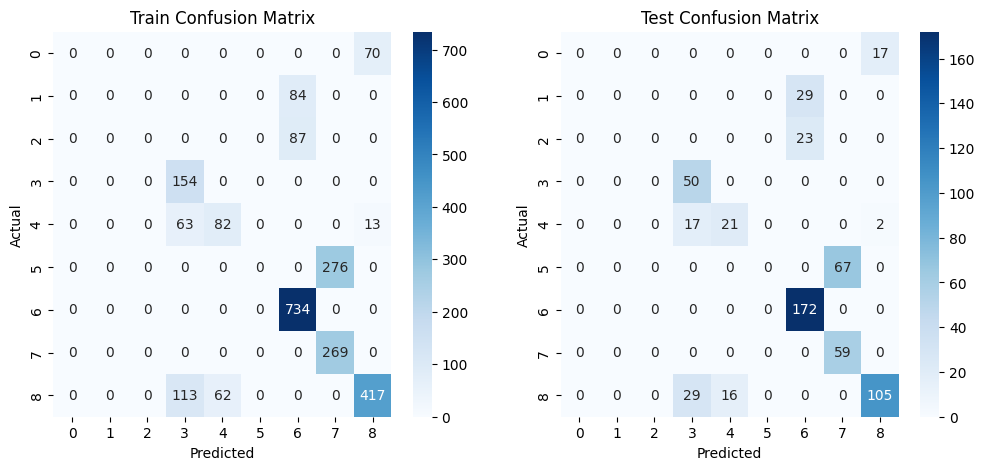

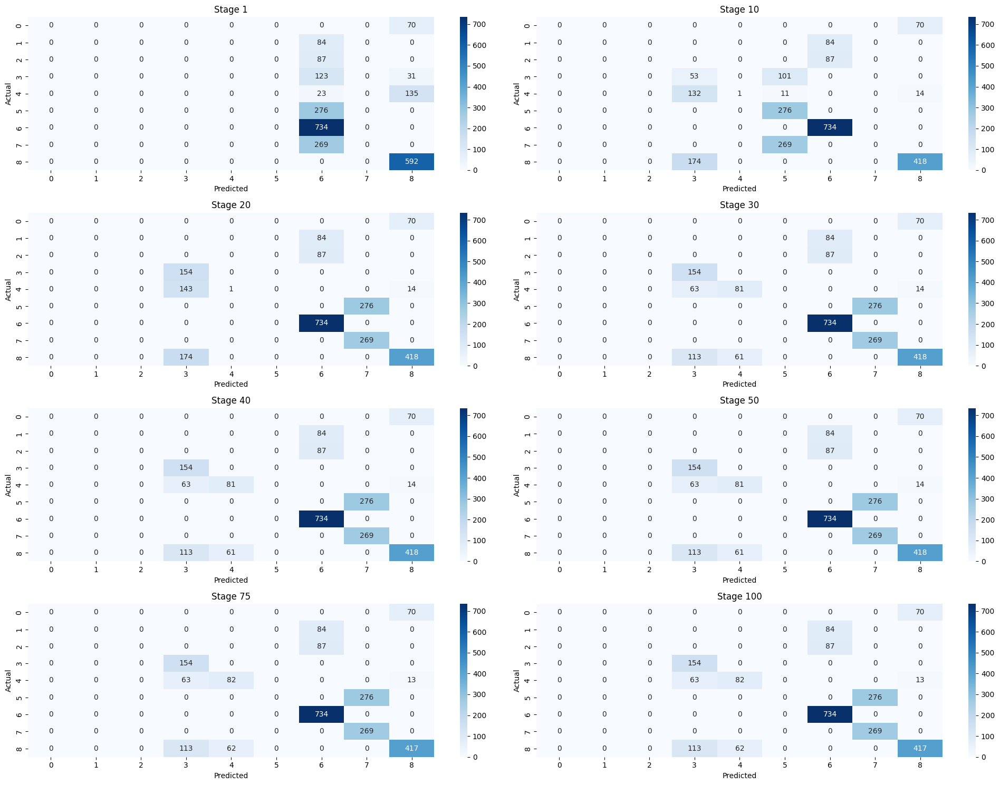

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter tuning for AdaBoost
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1]
}
base_estimator = DecisionTreeClassifier(max_depth=1)
grid_search = GridSearchCV(AdaBoostClassifier(estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted', zero_division=0)
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted', zero_division=0)
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Visualize stages of AdaBoost
def plot_stage_performance(model, X, y, stage_indices):
    plt.figure(figsize=(20, 15))
    for i, stage in enumerate(stage_indices):
        plt.subplot(4, 2, i + 1)
        model_stage = AdaBoostClassifier(estimator=base_estimator, n_estimators=stage, learning_rate=best_model.learning_rate, random_state=42)
        model_stage.fit(X, y)
        y_pred = model_stage.predict(X)
        conf_matrix = confusion_matrix(y, y_pred)
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Stage {stage}')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

# Select 8 stages for visualization
stages = [1, 10, 20, 30, 40, 50, 75, 100]
plot_stage_performance(best_model, X_train, y_train, stages)




## **ADAboost**

Fitting 5 folds for each of 150 candidates, totalling 750 fits
Mean CV Score: 1.00 (+/- 0.00)
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


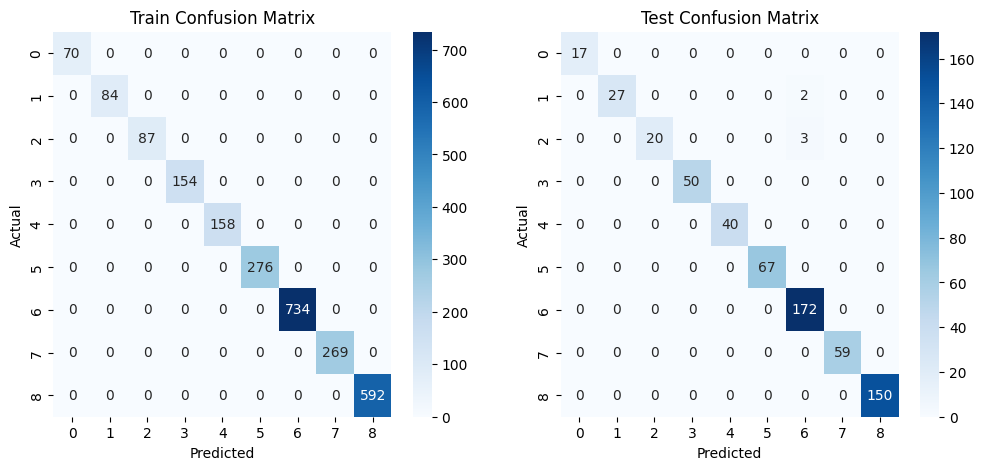

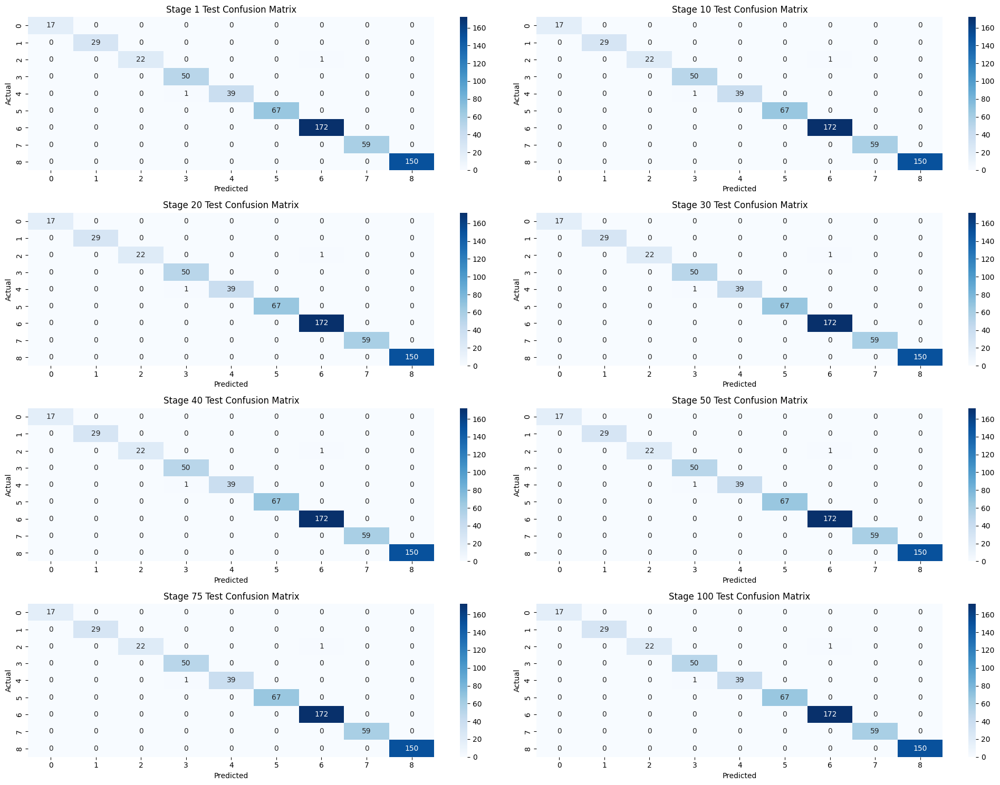

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Expanded hyperparameter tuning for AdaBoost
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400],
    'learning_rate': [0.01, 0.1, 0.5, 1, 1.5, 2],
    'estimator__max_depth': [1, 2, 3, 4, 5]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(AdaBoostClassifier(estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model with cross-validation
def evaluate_model_with_cv(model, X, y):
    cv_scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    return cv_scores.mean(), cv_scores.std()

mean_cv_score, std_cv_score = evaluate_model_with_cv(best_model, X_train, y_train)

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted', zero_division=0)
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted', zero_division=0)
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Mean CV Score: {mean_cv_score:.2f} (+/- {std_cv_score:.2f})")
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Visualize stages of AdaBoost
def plot_stage_performance(X_train, y_train, X_test, y_test, stage_indices):
    plt.figure(figsize=(20, 15))
    for i, stage in enumerate(stage_indices):
        plt.subplot(4, 2, i + 1)
        model_stage = AdaBoostClassifier(estimator=base_estimator, n_estimators=stage, learning_rate=best_model.learning_rate, random_state=42)
        model_stage.fit(X_train, y_train)
        y_pred_train_stage = model_stage.predict(X_train)
        y_pred_test_stage = model_stage.predict(X_test)

        conf_matrix_train_stage = confusion_matrix(y_train, y_pred_train_stage)
        conf_matrix_test_stage = confusion_matrix(y_test, y_pred_test_stage)

        sns.heatmap(conf_matrix_test_stage, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Stage {stage} Test Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

# Select 8 stages for visualization
stages = [1, 10, 20, 30, 40, 50, 75, 100]
plot_stage_performance(X_train, y_train, X_test, y_test, stages)


Fitting 5 folds for each of 150 candidates, totalling 750 fits
Mean CV Score: 1.00 (+/- 0.00)
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


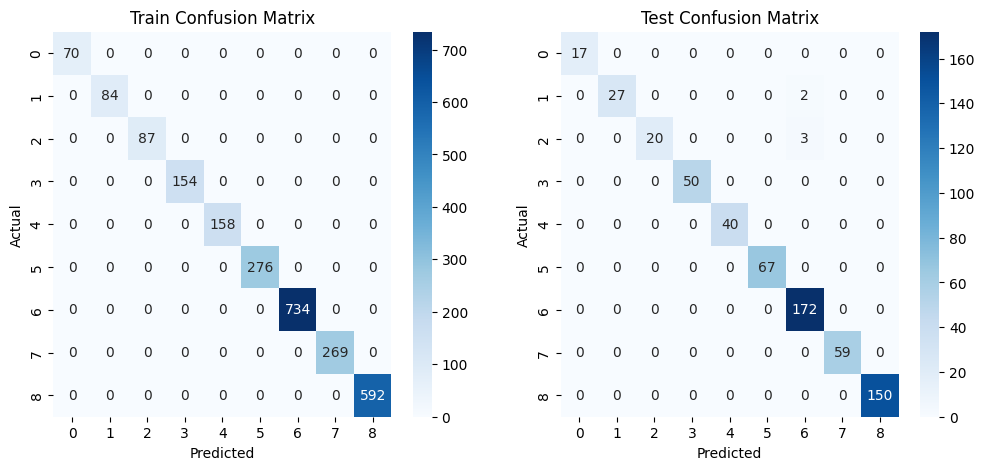

<ipython-input-2-15f54d62aaa4>:102: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(4, 4, 2*i + 1)
<ipython-input-2-15f54d62aaa4>:102: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(4, 4, 2*i + 1)
<ipython-input-2-15f54d62aaa4>:102: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(4, 4, 2*i + 1)
<ipython-input-2-15f54d62aaa4>:102: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(4, 4, 2*i + 1)
<ipython-input-2-15f54d62aaa4>:102: MatplotlibDeprec

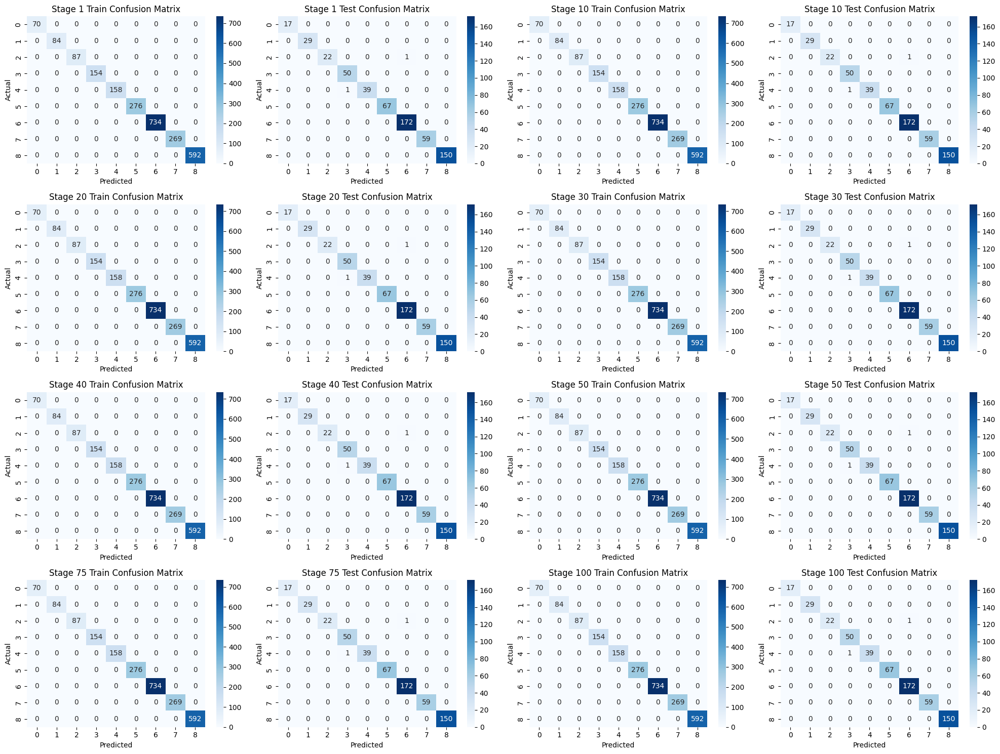

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Expanded hyperparameter tuning for AdaBoost
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400],
    'learning_rate': [0.01, 0.1, 0.5, 1, 1.5, 2],
    'estimator__max_depth': [1, 2, 3, 4, 5]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(AdaBoostClassifier(estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model with cross-validation
def evaluate_model_with_cv(model, X, y):
    cv_scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    return cv_scores.mean(), cv_scores.std()

mean_cv_score, std_cv_score = evaluate_model_with_cv(best_model, X_train, y_train)

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted', zero_division=0)
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted', zero_division=0)
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Mean CV Score: {mean_cv_score:.2f} (+/- {std_cv_score:.2f})")
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Visualize stages of AdaBoost
def plot_stage_performance(X_train, y_train, X_test, y_test, stage_indices):
    plt.figure(figsize=(20, 15))
    for i, stage in enumerate(stage_indices):
        plt.subplot(4, 2, i + 1)
        model_stage = AdaBoostClassifier(estimator=base_estimator, n_estimators=stage, learning_rate=best_model.learning_rate, random_state=42)
        model_stage.fit(X_train, y_train)
        y_pred_train_stage = model_stage.predict(X_train)
        y_pred_test_stage = model_stage.predict(X_test)

        conf_matrix_train_stage = confusion_matrix(y_train, y_pred_train_stage)
        conf_matrix_test_stage = confusion_matrix(y_test, y_pred_test_stage)

        # Plot train and test confusion matrices for each stage
        plt.subplot(4, 4, 2*i + 1)
        sns.heatmap(conf_matrix_train_stage, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Stage {stage} Train Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')

        plt.subplot(4, 4, 2*i + 2)
        sns.heatmap(conf_matrix_test_stage, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Stage {stage} Test Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')

    plt.tight_layout()
    plt.show()

# Select 8 stages for visualization
stages = [1, 10, 20, 30, 40, 50, 75, 100]
plot_stage_performance(X_train, y_train, X_test, y_test, stages)


Fitting 5 folds for each of 150 candidates, totalling 750 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


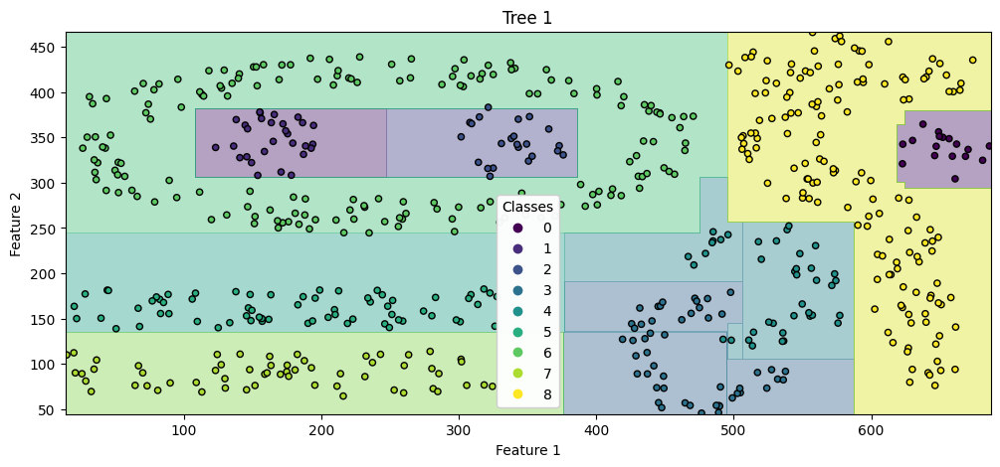

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

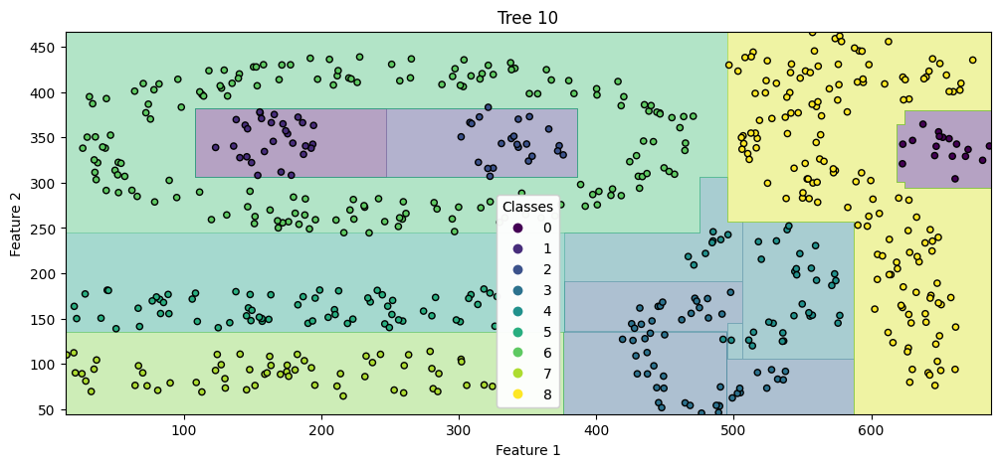

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

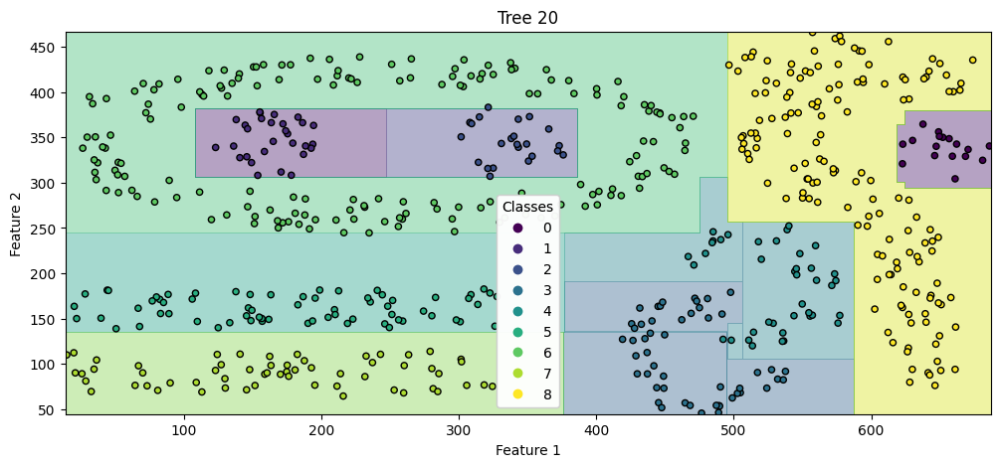

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

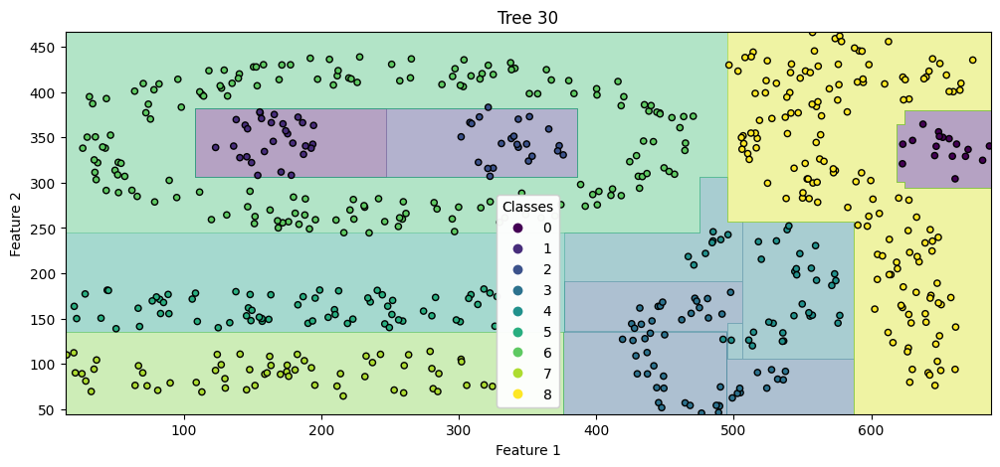

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

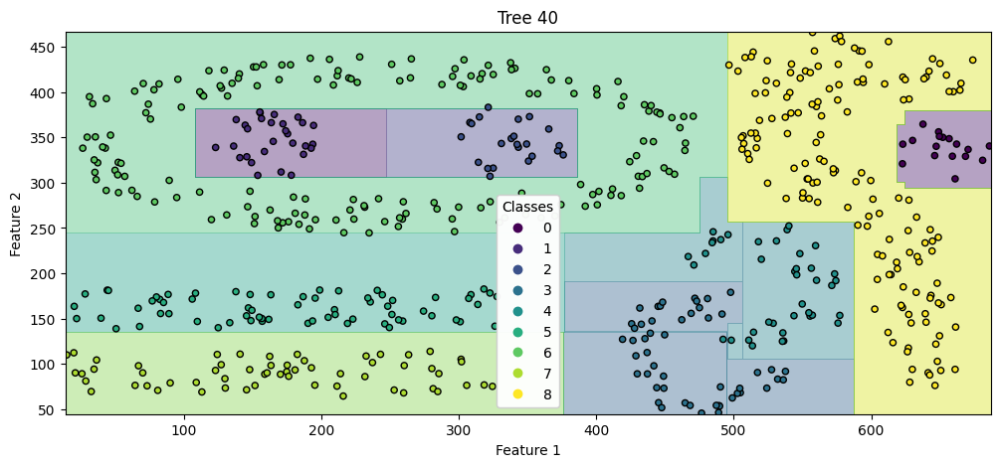

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

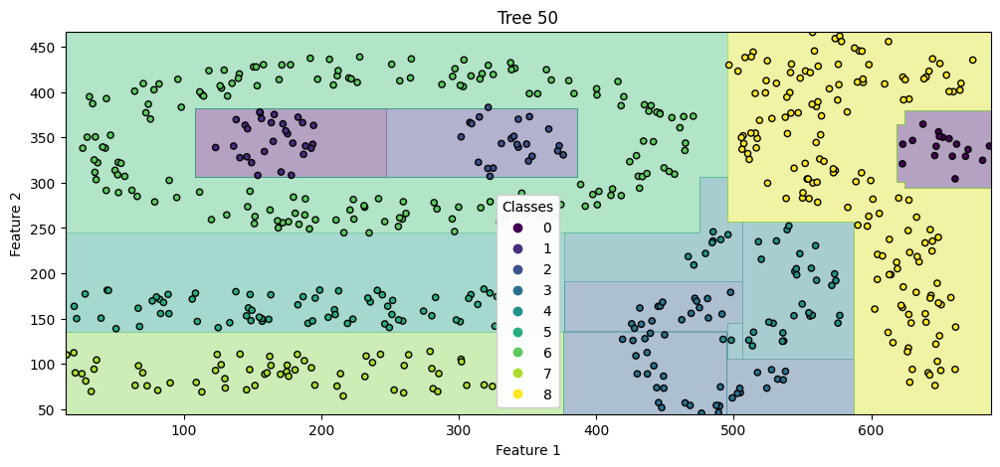

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

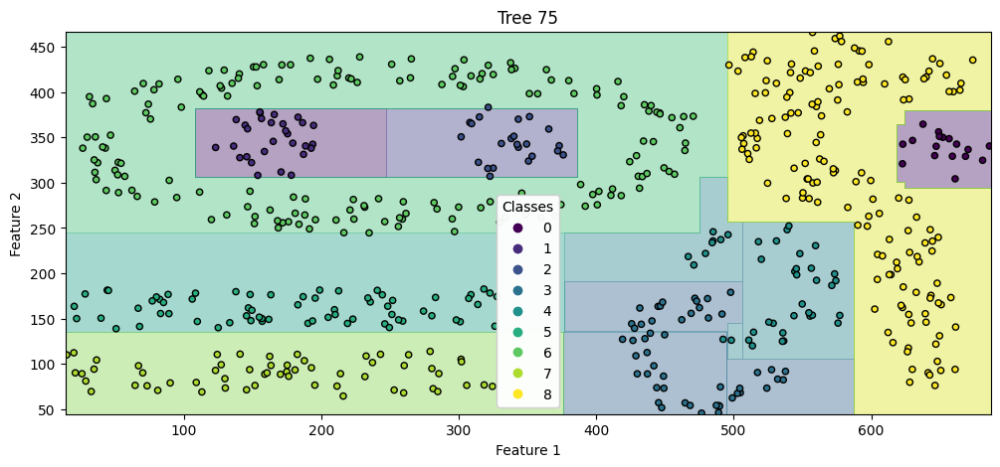

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


<Figure size 640x480 with 0 Axes>

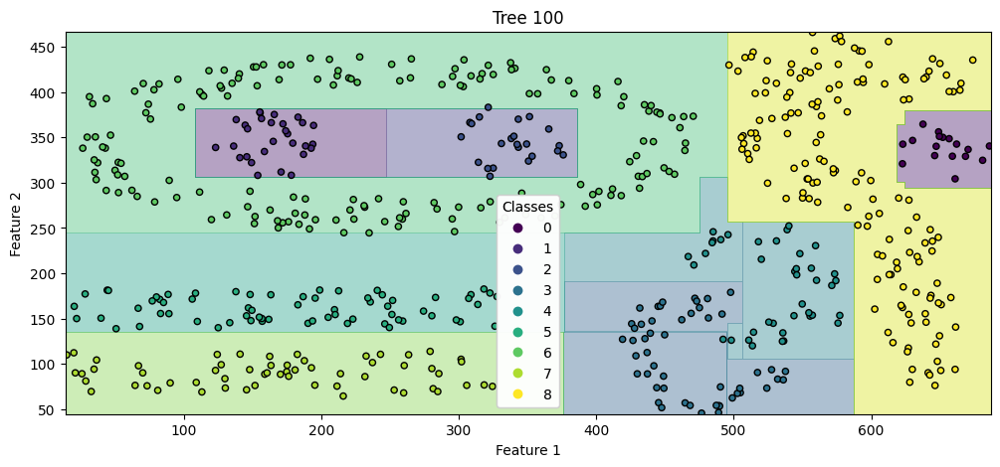

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Expanded hyperparameter tuning for AdaBoost
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400],
    'learning_rate': [0.01, 0.1, 0.5, 1, 1.5, 2],
    'base_estimator__max_depth': [1, 2, 3, 4, 5]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(AdaBoostClassifier(base_estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Function to plot decision boundaries
def plot_decision_boundary(X, y, model, ax, title):
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    scatter = ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=20, edgecolor='k')
    legend = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend)
    ax.set_title(title)
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

# Visualize stages of AdaBoost
def plot_stage_performance(X_train, y_train, X_test, y_test, stage_indices):
    for i, stage in enumerate(stage_indices):
        model_stage = AdaBoostClassifier(estimator=base_estimator, n_estimators=stage, learning_rate=best_model.learning_rate, random_state=42)
        model_stage.fit(X_train, y_train)

        # Plot decision boundaries
        plt.figure(figsize=(12, 5))
        ax = plt.subplot(1, 1, 1)
        plot_decision_boundary(pd.DataFrame(X_test, columns=['Feature 1', 'Feature 2']), y_test, model_stage, ax, f'Tree {stage}')
        plt.show()
        plt.clf()  # Clear the figure to free memory

# Select 8 stages for visualization
stages = [1, 10, 20, 30, 40, 50, 75, 100]
plot_stage_performance(X_train, y_train, X_test, y_test, stages)


Fitting 5 folds for each of 150 candidates, totalling 750 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

Mean CV Score: 1.00 (+/- 0.00)
Train Precision: 1.00
Train Recall: 1.00
Train F1 Score: 1.00
Train Accuracy: 1.00
Test Precision: 0.99
Test Recall: 0.99
Test F1 Score: 0.99
Test Accuracy: 0.99


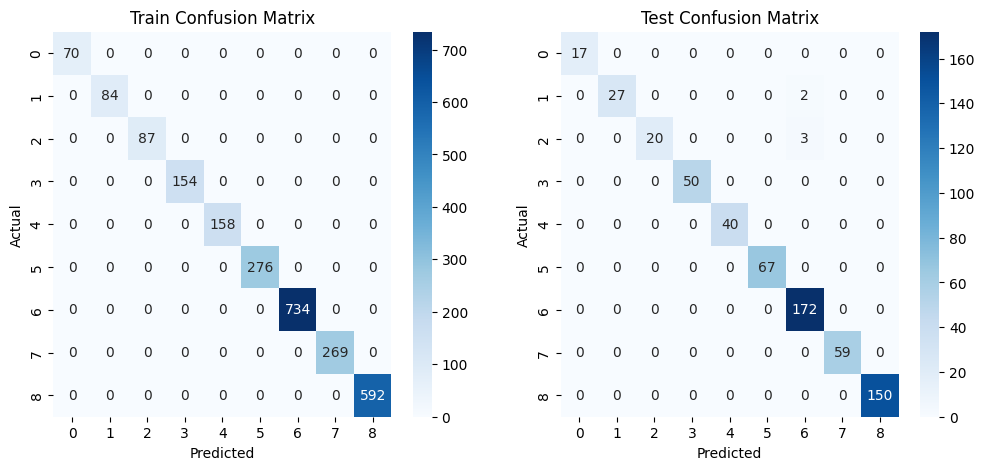

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

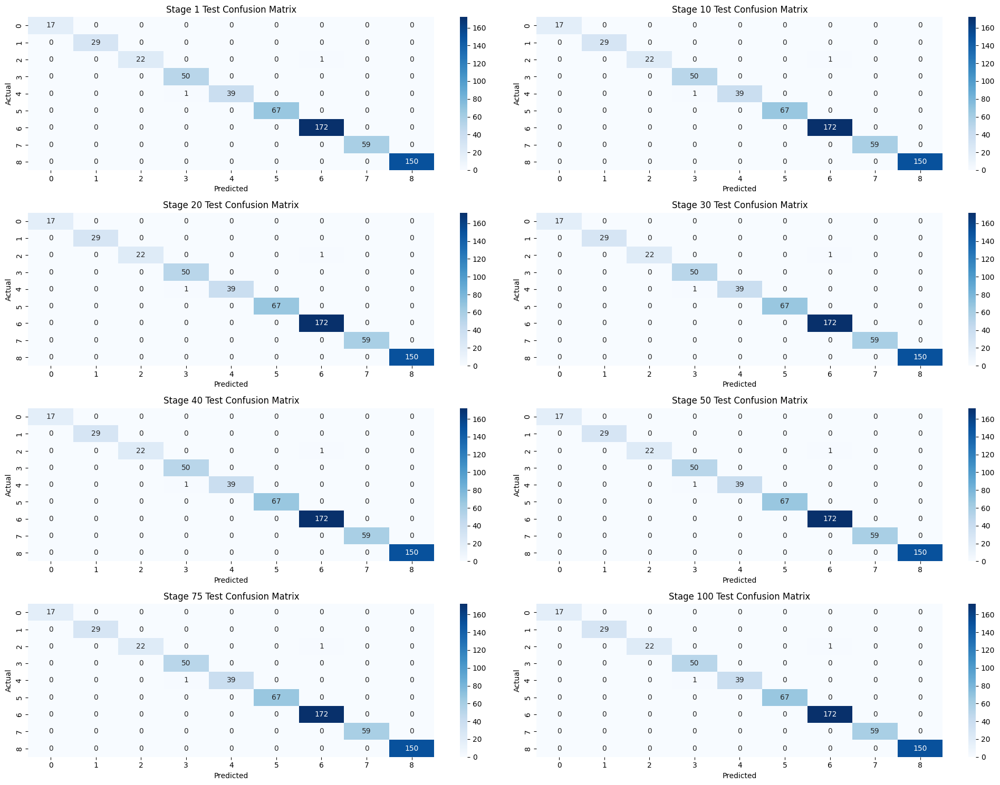

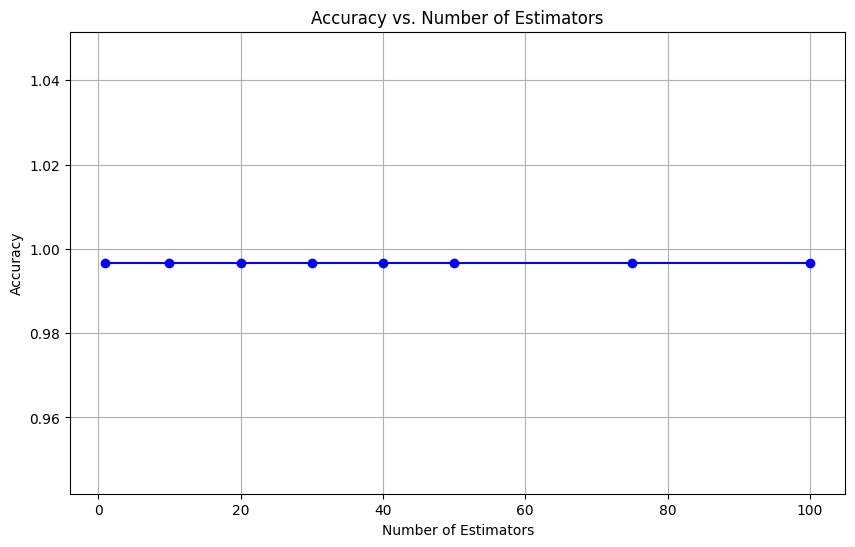

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

# Load the full dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Expanded hyperparameter tuning for AdaBoost
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400],
    'learning_rate': [0.01, 0.1, 0.5, 1, 1.5, 2],
    'base_estimator__max_depth': [1, 2, 3, 4, 5]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(AdaBoostClassifier(base_estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model with cross-validation
def evaluate_model_with_cv(model, X, y):
    cv_scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    return cv_scores.mean(), cv_scores.std()

mean_cv_score, std_cv_score = evaluate_model_with_cv(best_model, X_train, y_train)

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted', zero_division=0)
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted', zero_division=0)
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Mean CV Score: {mean_cv_score:.2f} (+/- {std_cv_score:.2f})")
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Visualize stages of AdaBoost
def plot_stage_performance(X_train, y_train, X_test, y_test, stage_indices):
    plt.figure(figsize=(20, 15))
    accuracies = []
    for i, stage in enumerate(stage_indices):
        plt.subplot(4, 2, i + 1)
        model_stage = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=stage, learning_rate=best_model.learning_rate, random_state=42)
        model_stage.fit(X_train, y_train)
        y_pred_test_stage = model_stage.predict(X_test)

        conf_matrix_test_stage = confusion_matrix(y_test, y_pred_test_stage)
        accuracy_test_stage = accuracy_score(y_test, y_pred_test_stage)
        accuracies.append(accuracy_test_stage)

        sns.heatmap(conf_matrix_test_stage, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Stage {stage} Test Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')

    plt.tight_layout()
    plt.show()

    # Plot accuracy vs. number of estimators
    plt.figure(figsize=(10, 6))
    plt.plot(stage_indices, accuracies, marker='o', linestyle='-', color='b')
    plt.title('Accuracy vs. Number of Estimators')
    plt.xlabel('Number of Estimators')
    plt.ylabel('Accuracy')
    plt.grid(True)
    plt.show()

# Select 8 stages for visualization
stages = [1, 10, 20, 30, 40, 50, 75, 100]
plot_stage_performance(X_train, y_train, X_test, y_test, stages)


KNN

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

# Load the dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
X = data_full.drop('Label', axis=1)
y = data_full['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)

# Train the KNN classifier
knn.fit(X_train, y_train)

# Predict using the KNN classifier
y_pred_knn_train = knn.predict(X_train)
y_pred_knn_test = knn.predict(X_test)

# Print the results for KNN
print("KNN Classifier:")
print(f"Train Accuracy: {accuracy_score(y_train, y_pred_knn_train):.2f}")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_knn_test):.2f}")


KNN Classifier:
Train Accuracy: 1.00
Test Accuracy: 1.00


In [ ]:
# Function to perform bagging
def bagging_predict(X_train, y_train, X_test, base_estimator, n_estimators):
    np.random.seed(42)
    predictions = []
    for _ in range(n_estimators):
        indices = np.random.choice(len(X_train), len(X_train), replace=True)
        X_resample, y_resample = X_train[indices], y_train[indices]
        estimator = base_estimator()
        estimator.fit(X_resample, y_resample)
        predictions.append(estimator.predict(X_test))
    predictions = np.array(predictions)
    return np.round(np.mean(predictions, axis=0)).astype(int)

# Predict using Bagging
y_pred_bagging_test = bagging_predict(X_train.values, y_train.values, X_test.values, DecisionTreeClassifier, 50)

# Print the results for Bagging
print("Bagging Classifier:")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_bagging_test):.2f}")


Bagging Classifier:
Test Accuracy: 0.98


In [ ]:
# Function to perform random forest
def random_forest_predict(X_train, y_train, X_test, n_estimators, max_features):
    np.random.seed(42)
    predictions = []
    for _ in range(n_estimators):
        indices = np.random.choice(len(X_train), len(X_train), replace=True)
        features = np.random.choice(X_train.shape[1], max_features, replace=False)
        X_resample, y_resample = X_train[indices], y_train[indices]
        estimator = DecisionTreeClassifier()
        estimator.fit(X_resample[:, features], y_resample)
        pred = estimator.predict(X_test[:, features])
        predictions.append(pred)
    predictions = np.array(predictions)
    return np.round(np.mean(predictions, axis=0)).astype(int)

# Predict using Random Forest
y_pred_rf_test = random_forest_predict(X_train.values, y_train.values, X_test.values, 100, int(np.sqrt(X_train.shape[1])))

# Print the results for Random Forest
print("Random Forest Classifier:")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_rf_test):.2f}")
print(f"Train Accuracy: {accuracy_score(y_train, y_pred_rf_train):.2f}")


Random Forest Classifier:
Test Accuracy: 0.26
Train Accuracy: 1.00


completly overfit!!

In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV

# Load the dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
train_data, test_data = train_test_split(data_full, test_size=0.2, random_state=42)

# Separate features and labels
X_train = train_data.drop('Label', axis=1)
y_train = train_data['Label']
X_test = test_data.drop('Label', axis=1)
y_test = test_data['Label']

# Function to perform random forest with class weighting
def random_forest_predict(X_train, y_train, X_test, n_estimators, max_features, max_depth_range, min_samples_split_range, min_samples_leaf_range):
    np.random.seed(42)
    predictions_train = []
    predictions_test = []

    param_grid = {
        'max_depth': max_depth_range,
        'min_samples_split': min_samples_split_range,
        'min_samples_leaf': min_samples_leaf_range,
        'class_weight': ['balanced']
    }

    for _ in range(n_estimators):
        indices = np.random.choice(len(X_train), len(X_train), replace=True)
        features = np.random.choice(X_train.shape[1], max_features, replace=False)
        X_resample, y_resample = X_train.values[indices], y_train.values[indices]

        estimator = DecisionTreeClassifier()
        grid_search = GridSearchCV(estimator, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_resample[:, features], y_resample)

        best_estimator = grid_search.best_estimator_

        predictions_train.append(best_estimator.predict(X_train.values[:, features]))
        predictions_test.append(best_estimator.predict(X_test.values[:, features]))

    predictions_train = np.array(predictions_train)
    predictions_test = np.array(predictions_test)

    return (np.round(np.mean(predictions_train, axis=0)).astype(int),
            np.round(np.mean(predictions_test, axis=0)).astype(int))

# Hyperparameter ranges
max_depth_range = [5, 10, 15]
min_samples_split_range = [2, 10, 20]
min_samples_leaf_range = [1, 5, 10]

# Predict using Random Forest
y_pred_rf_train, y_pred_rf_test = random_forest_predict(X_train, y_train, X_test, 100, int(np.sqrt(X_train.shape[1])), max_depth_range, min_samples_split_range, min_samples_leaf_range)

# Print the results for Random Forest
print("Random Forest Classifier:")
print(f"Train Accuracy: {accuracy_score(y_train, y_pred_rf_train):.2f}")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_rf_test):.2f}")


Random Forest Classifier:
Train Accuracy: 0.44
Test Accuracy: 0.23


In [ ]:
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = '/content/Dataset1.csv'
data = pd.read_csv(file_path)

# Split the data into features and target variable
X = data[['Feature 1', 'Feature 2']].values
y = data['Label'].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree implementation
class DecisionTree:
    def __init__(self, depth=1):
        self.depth = depth
        self.tree = None

    def fit(self, X, y):
        self.tree = self._build_tree(X, y, depth=self.depth)

    def predict(self, X):
        return np.array([self._predict_one(x, self.tree) for x in X])

    def _build_tree(self, X, y, depth):
        if depth == 0 or len(set(y)) == 1:
            return Counter(y).most_common(1)[0][0]
        else:
            best_split = self._best_split(X, y)
            left_mask = X[:, best_split['feature']] < best_split['threshold']
            right_mask = ~left_mask
            return {
                'feature': best_split['feature'],
                'threshold': best_split['threshold'],
                'left': self._build_tree(X[left_mask], y[left_mask], depth-1),
                'right': self._build_tree(X[right_mask], y[right_mask], depth-1)
            }

    def _best_split(self, X, y):
        best_split = {}
        max_info_gain = -1
        n_features = X.shape[1]
        for feature in range(n_features):
            thresholds = np.unique(X[:, feature])
            for threshold in thresholds:
                left_mask = X[:, feature] < threshold
                right_mask = ~left_mask
                info_gain = self._information_gain(y, y[left_mask], y[right_mask])
                if info_gain > max_info_gain:
                    max_info_gain = info_gain
                    best_split = {'feature': feature, 'threshold': threshold}
        return best_split

    def _information_gain(self, y, y_left, y_right):
        p = len(y_left) / len(y)
        return self._entropy(y) - (p * self._entropy(y_left) + (1 - p) * self._entropy(y_right))

    def _entropy(self, y):
        proportions = np.bincount(y) / len(y)
        return -np.sum([p * np.log2(p) for p in proportions if p > 0])

    def _predict_one(self, x, tree):
        if isinstance(tree, dict):
            if x[tree['feature']] < tree['threshold']:
                return self._predict_one(x, tree['left'])
            else:
                return self._predict_one(x, tree['right'])
        else:
            return tree

# Random Forest implementation
class RandomForest:
    def __init__(self, n_trees=10, depth=3):
        self.n_trees = n_trees
        self.depth = depth
        self.trees = []

    def fit(self, X, y):
        n_samples = X.shape[0]
        for _ in range(self.n_trees):
            indices = np.random.choice(n_samples, n_samples, replace=True)
            X_subset, y_subset = X[indices], y[indices]
            tree = DecisionTree(depth=self.depth)
            tree.fit(X_subset, y_subset)
            self.trees.append(tree)

    def predict(self, X):
        tree_preds = np.array([tree.predict(X) for tree in self.trees])
        return [Counter(tree_preds[:, i]).most_common(1)[0][0] for i in range(X.shape[0])]

# Initialize the Random Forest classifier
clf = RandomForest(n_trees=100, depth=5)

# Train the classifier on the training data
clf.fit(X_train, y_train)

# Predict the labels on the training and testing data
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

# Evaluate the classifier
train_accuracy = np.mean(y_pred_train == y_train)
test_accuracy = np.mean(y_pred_test == y_test)

print("Training Accuracy: {:.2f}%".format(train_accuracy * 100))
print("Testing Accuracy: {:.2f}%".format(test_accuracy * 100))


Training Accuracy: 95.13%
Testing Accuracy: 93.41%


In [ ]:
# Function to perform AdaBoost
def adaboost_predict(X_train, y_train, X_test, n_estimators):
    np.random.seed(42)
    sample_weights = np.ones(len(X_train)) / len(X_train)
    predictions = np.zeros(len(X_test))
    for _ in range(n_estimators):
        estimator = DecisionTreeClassifier(max_depth=1)
        estimator.fit(X_train, y_train, sample_weight=sample_weights)
        y_pred_train = estimator.predict(X_train)
        y_pred_test = estimator.predict(X_test)
        incorrect = (y_pred_train != y_train)
        estimator_error = np.dot(sample_weights, incorrect) / np.sum(sample_weights)
        alpha = 0.5 * np.log((1 - estimator_error) / estimator_error)
        sample_weights *= np.exp(alpha * incorrect)
        sample_weights /= np.sum(sample_weights)
        predictions += alpha * y_pred_test
    return np.sign(predictions).astype(int)

# Convert y_train to {-1, 1} for AdaBoost
y_train_boost = np.where(y_train == 0, -1, 1)
y_test_boost = np.where(y_test == 0, -1, 1)

# Predict using AdaBoost
y_pred_ada_test = adaboost_predict(X_train.values, y_train_boost, X_test.values, 50)

# Convert predictions back to {0, 1}
y_pred_ada_test = np.where(y_pred_ada_test == -1, 0, 1)

# Print the results for AdaBoost
print("AdaBoost Classifier:")

print(f"Test Accuracy: {accuracy_score(y_test, y_pred_ada_test):.2f}")


AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = '/content/Dataset1.csv'
data = pd.read_csv(file_path)

# Split the data into features and target variable
X = data[['Feature 1', 'Feature 2']].values
y = data['Label'].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Stump implementation
class DecisionStump:
    def __init__(self):
        self.feature = None
        self.threshold = None
        self.polarity = 1
        self.alpha = None

    def fit(self, X, y, sample_weights):
        n_samples, n_features = X.shape
        min_error = float('inf')

        for feature in range(n_features):
            thresholds = np.unique(X[:, feature])
            for threshold in thresholds:
                for polarity in [1, -1]:
                    error = np.sum(sample_weights * (polarity * ((X[:, feature] < threshold) == y)))
                    if error < min_error:
                        min_error = error
                        self.feature = feature
                        self.threshold = threshold
                        self.polarity = polarity

    def predict(self, X):
        n_samples = X.shape[0]
        predictions = np.ones(n_samples)
        if self.polarity == 1:
            predictions[X[:, self.feature] < self.threshold] = -1
        else:
            predictions[X[:, self.feature] >= self.threshold] = -1
        return predictions

# AdaBoost implementation
class AdaBoost:
    def __init__(self, n_classifiers=50):
        self.n_classifiers = n_classifiers
        self.classifiers = []

    def fit(self, X, y):
        n_samples, n_features = X.shape
        sample_weights = np.full(n_samples, (1 / n_samples))
        y = np.where(y == 0, -1, y)  # Convert labels to {-1, 1}

        for _ in range(self.n_classifiers):
            classifier = DecisionStump()
            classifier.fit(X, y, sample_weights)
            predictions = classifier.predict(X)
            error = np.sum(sample_weights * (predictions != y))

            classifier.alpha = 0.5 * np.log((1.0 - error) / (error + 1e-10))
            sample_weights *= np.exp(-classifier.alpha * y * predictions)
            sample_weights /= np.sum(sample_weights)

            self.classifiers.append(classifier)

    def predict(self, X):
        classifier_preds = np.array([classifier.alpha * classifier.predict(X) for classifier in self.classifiers])
        y_pred = np.sign(np.sum(classifier_preds, axis=0))
        return np.where(y_pred == -1, 0, y_pred)  # Convert labels back to {0, 1}

# Initialize the AdaBoost classifier
ada_clf = AdaBoost(n_classifiers=50)

# Train the classifier on the training data
ada_clf.fit(X_train, y_train)

# Predict the labels on the training and testing data
y_pred_train_ada = ada_clf.predict(X_train)
y_pred_test_ada = ada_clf.predict(X_test)

# Evaluate the classifier
train_accuracy_ada = np.mean(y_pred_train_ada == y_train)
test_accuracy_ada = np.mean(y_pred_test_ada == y_test)

print("AdaBoost Training Accuracy: {:.2f}%".format(train_accuracy_ada * 100))
print("AdaBoost Testing Accuracy: {:.2f}%".format(test_accuracy_ada * 100))


AdaBoost Training Accuracy: 2.89%
AdaBoost Testing Accuracy: 2.80%


Bad!!! end of the codes

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV, KFold

# Load the dataset
data_full = pd.read_csv('/content/Dataset1.csv')

# Split the dataset into training and testing sets
train_data, test_data = train_test_split(data_full, test_size=0.2, random_state=42)

# Separate features and labels
X_train = train_data.drop('Label', axis=1)
y_train = train_data['Label']
X_test = test_data.drop('Label', axis=1)
y_test = test_data['Label']

# Initialize the classifiers
knn = KNeighborsClassifier(n_neighbors=5)
bagging = DecisionTreeClassifier()  # Base estimator for Bagging
rf = DecisionTreeClassifier(max_depth=5, min_samples_split=10, min_samples_leaf=5)
ada = DecisionTreeClassifier(max_depth=1)

# Train the base classifiers
knn.fit(X_train, y_train)
bagging.fit(X_train, y_train)
rf.fit(X_train, y_train)
ada.fit(X_train, y_train)

# Predict using the base classifiers
y_pred_knn_train = knn.predict(X_train)
y_pred_bagging_train = bagging.predict(X_train)
y_pred_rf_train = rf.predict(X_train)
y_pred_ada_train = ada.predict(X_train)

y_pred_knn_test = knn.predict(X_test)
y_pred_bagging_test = bagging.predict(X_test)
y_pred_rf_test = rf.predict(X_test)
y_pred_ada_test = ada.predict(X_test)

# Stack predictions to create new feature set for meta-classifier
meta_features_train = np.column_stack((y_pred_knn_train, y_pred_bagging_train, y_pred_rf_train, y_pred_ada_train))
meta_features_test = np.column_stack((y_pred_knn_test, y_pred_bagging_test, y_pred_rf_test, y_pred_ada_test))

# Initialize the meta-classifier
meta_clf = LogisticRegression(random_state=42)

# Train the meta-classifier
meta_clf.fit(meta_features_train, y_train)

# Predict using the meta-classifier
y_pred_meta_train = meta_clf.predict(meta_features_train)
y_pred_meta_test = meta_clf.predict(meta_features_test)

# Print the results for Meta-Classifier
print("Meta Classifier:")
print(f"Train Accuracy: {accuracy_score(y_train, y_pred_meta_train):.2f}")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_meta_test):.2f}")

# Evaluate metrics
def evaluate_model(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    return accuracy, precision, recall, f1

# Base classifiers
acc_knn, prec_knn, rec_knn, f1_knn = evaluate_model(y_test, y_pred_knn_test)
acc_bagging, prec_bagging, rec_bagging, f1_bagging = evaluate_model(y_test, y_pred_bagging_test)
acc_rf, prec_rf, rec_rf, f1_rf = evaluate_model(y_test, y_pred_rf_test)
acc_ada, prec_ada, rec_ada, f1_ada = evaluate_model(y_test, y_pred_ada_test)

# Meta classifier
acc_meta, prec_meta, rec_meta, f1_meta = evaluate_model(y_test, y_pred_meta_test)

# Print evaluation metrics
print("Evaluation Metrics:")
print(f"KNN - Accuracy: {acc_knn:.2f}, Precision: {prec_knn:.2f}, Recall: {rec_knn:.2f}, F1 Score: {f1_knn:.2f}")
print(f"Bagging - Accuracy: {acc_bagging:.2f}, Precision: {prec_bagging:.2f}, Recall: {rec_bagging:.2f}, F1 Score: {f1_bagging:.2f}")
print(f"Random Forest - Accuracy: {acc_rf:.2f}, Precision: {prec_rf:.2f}, Recall: {rec_rf:.2f}, F1 Score: {f1_rf:.2f}")
print(f"AdaBoost - Accuracy: {acc_ada:.2f}, Precision: {prec_ada:.2f}, Recall: {rec_ada:.2f}, F1 Score: {f1_ada:.2f}")
print(f"Meta - Accuracy: {acc_meta:.2f}, Precision: {prec_meta:.2f}, Recall: {rec_meta:.2f}, F1 Score: {f1_meta:.2f}")


Meta Classifier:
Train Accuracy: 0.98
Test Accuracy: 0.97
Evaluation Metrics:
KNN - Accuracy: 1.00, Precision: 1.00, Recall: 1.00, F1 Score: 1.00
Bagging - Accuracy: 1.00, Precision: 1.00, Recall: 1.00, F1 Score: 1.00
Random Forest - Accuracy: 0.93, Precision: 0.95, Recall: 0.93, F1 Score: 0.94
AdaBoost - Accuracy: 0.53, Precision: 0.30, Recall: 0.53, F1 Score: 0.38
Meta - Accuracy: 0.97, Precision: 0.97, Recall: 0.97, F1 Score: 0.97


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Initialize other classifiers
rf = RandomForestClassifier(n_estimators=100, random_state=42)
ada = AdaBoostClassifier(n_estimators=100, random_state=42)

# Train the classifiers
rf.fit(X_train, y_train)
ada.fit(X_train, y_train)

# Predict using the classifiers
y_pred_rf_train = rf.predict(X_train)
y_pred_rf_test = rf.predict(X_test)

y_pred_ada_train = ada.predict(X_train)
y_pred_ada_test = ada.predict(X_test)

# Print the results for RF and AdaBoost
print("Random Forest Classifier:")
print(f"Train Accuracy: {accuracy_score(y_train, y_pred_rf_train):.2f}")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_rf_test):.2f}")

print("AdaBoost Classifier:")
print(f"Train Accuracy: {accuracy_score(y_train, y_pred_ada_train):.2f}")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_ada_test):.2f}")


Random Forest Classifier:
Train Accuracy: 1.00
Test Accuracy: 0.99
AdaBoost Classifier:
Train Accuracy: 0.53
Test Accuracy: 0.52


In [ ]:
# Stack predictions to create new feature set for meta-classifier
meta_features_train = np.column_stack((y_pred_knn_train, y_pred_rf_train, y_pred_ada_train))
meta_features_test = np.column_stack((y_pred_knn_test, y_pred_rf_test, y_pred_ada_test))

# Initialize the meta-classifier
meta_clf = LogisticRegression(random_state=42)

# Train the meta-classifier
meta_clf.fit(meta_features_train, y_train)

# Predict using the meta-classifier
y_pred_meta_train = meta_clf.predict(meta_features_train)
y_pred_meta_test = meta_clf.predict(meta_features_test)

# Print the results for Meta-Classifier
print("Meta Classifier:")
print(f"Train Accuracy: {accuracy_score(y_train, y_pred_meta_train):.2f}")
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_meta_test):.2f}")


Meta Classifier:
Train Accuracy: 1.00
Test Accuracy: 0.99


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Evaluate metrics
def evaluate_model(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    return accuracy, precision, recall, f1

# Base classifiers
acc_knn, prec_knn, rec_knn, f1_knn = evaluate_model(y_test, y_pred_knn_test)
acc_rf, prec_rf, rec_rf, f1_rf = evaluate_model(y_test, y_pred_rf_test)
acc_ada, prec_ada, rec_ada, f1_ada = evaluate_model(y_test, y_pred_ada_test)

# Meta classifier
acc_meta, prec_meta, rec_meta, f1_meta = evaluate_model(y_test, y_pred_meta_test)

# Print evaluation metrics
print("Evaluation Metrics:")
print(f"KNN - Accuracy: {acc_knn:.2f}, Precision: {prec_knn:.2f}, Recall: {rec_knn:.2f}, F1 Score: {f1_knn:.2f}")
print(f"Random Forest - Accuracy: {acc_rf:.2f}, Precision: {prec_rf:.2f}, Recall: {rec_rf:.2f}, F1 Score: {f1_rf:.2f}")
print(f"AdaBoost - Accuracy: {acc_ada:.2f}, Precision: {prec_ada:.2f}, Recall: {rec_ada:.2f}, F1 Score: {f1_ada:.2f}")
print(f"Meta - Accuracy: {acc_meta:.2f}, Precision: {prec_meta:.2f}, Recall: {rec_meta:.2f}, F1 Score: {f1_meta:.2f}")

# Addressing overfitting by adding regularization or additional base classifiers


Evaluation Metrics:
KNN - Accuracy: 1.00, Precision: 1.00, Recall: 1.00, F1 Score: 1.00
Random Forest - Accuracy: 0.99, Precision: 0.99, Recall: 0.99, F1 Score: 0.99
AdaBoost - Accuracy: 0.52, Precision: 0.37, Recall: 0.52, F1 Score: 0.41
Meta - Accuracy: 0.99, Precision: 0.99, Recall: 0.99, F1 Score: 0.99


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Phase 2

In [ ]:
import pandas as pd

# Reload the dataset
file_path = '/content/Dataset2.csv'
data = pd.read_csv(file_path)

# Display the first few rows of the dataset
print(data.head())

# Display basic information about the dataset
print(data.info())


   male  age  education  currentSmoker  cigsPerDay  BPMeds  prevalentStroke  \
0     1   39        4.0              0         0.0     0.0                0   
1     0   46        2.0              0         0.0     0.0                0   
2     1   48        1.0              1        20.0     0.0                0   
3     0   61        3.0              1        30.0     0.0                0   
4     0   46        3.0              1        23.0     0.0                0   

   prevalentHyp  diabetes  totChol  sysBP  diaBP    BMI  heartRate  glucose  \
0             0         0    195.0  106.0   70.0  26.97       80.0     77.0   
1             0         0    250.0  121.0   81.0  28.73       95.0     76.0   
2             0         0    245.0  127.5   80.0  25.34       75.0     70.0   
3             1         0    225.0  150.0   95.0  28.58       65.0    103.0   
4             0         0    285.0  130.0   84.0  23.10       85.0     85.0   

   TenYearCHD  
0           0  
1           0  
2 

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = '/content/Dataset2.csv'
data = pd.read_csv(file_path)

# Step 1: Handle Missing Values (fill with mean)
data.fillna(data.mean(), inplace=True)

# Step 2: Encode Categorical Variables (none to encode in this dataset)

# Step 3: Normalize/Standardize Features
scaler = StandardScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

# Step 4: Find Correlations Between Features
correlation_matrix = data_scaled.corr()

# Display the correlation matrix
print("Correlation Matrix:\n", correlation_matrix)

# Step 5: Remove Highly Correlated Features
# We will remove one of each pair of features with correlation above 0.9
high_corr = np.where(correlation_matrix > 0.8)
high_corr_pairs = [(correlation_matrix.columns[x], correlation_matrix.columns[y]) for x, y in zip(*high_corr) if x != y and x < y]

# Display highly correlated pairs
print("Highly Correlated Pairs (correlation > 0.9):\n", high_corr_pairs)

# Remove one of each pair of highly correlated features
features_to_remove = set()
for pair in high_corr_pairs:
    features_to_remove.add(pair[1])

data_reduced = data_scaled.drop(columns=features_to_remove)

# Display the remaining features
print("Remaining Features after Removing High Correlation:\n", data_reduced.columns)

# Descriptive statistics
desc_stats = data.describe()

desc_stats, data_reduced.head(), features_to_remove


Correlation Matrix:
                      male       age  education  currentSmoker  cigsPerDay  \
male             1.000000 -0.029014   0.017188       0.197026    0.316023   
age             -0.029014  1.000000  -0.164081      -0.213662   -0.192534   
education        0.017188 -0.164081   1.000000       0.018297    0.008197   
currentSmoker    0.197026 -0.213662   0.018297       1.000000    0.767055   
cigsPerDay       0.316023 -0.192534   0.008197       0.767055    1.000000   
BPMeds          -0.052203  0.122036  -0.010689      -0.048621   -0.045847   
prevalentStroke -0.004550  0.057679  -0.035139      -0.032980   -0.032711   
prevalentHyp     0.005853  0.306799  -0.080753      -0.103710   -0.066444   
diabetes         0.015693  0.101314  -0.038214      -0.044285   -0.037086   
totChol         -0.070064  0.260691  -0.022993      -0.046211   -0.026182   
sysBP           -0.035879  0.394053  -0.128126      -0.130281   -0.088523   
diaBP            0.058199  0.205586  -0.061362      -0.

(              male          age    education  currentSmoker   cigsPerDay  \
 count  4240.000000  4240.000000  4240.000000    4240.000000  4240.000000   
 mean      0.429245    49.580189     1.979444       0.494104     9.005937   
 std       0.495027     8.572942     1.007082       0.500024    11.881610   
 min       0.000000    32.000000     1.000000       0.000000     0.000000   
 25%       0.000000    42.000000     1.000000       0.000000     0.000000   
 50%       0.000000    49.000000     2.000000       0.000000     0.000000   
 75%       1.000000    56.000000     3.000000       1.000000    20.000000   
 max       1.000000    70.000000     4.000000       1.000000    70.000000   
 
             BPMeds  prevalentStroke  prevalentHyp     diabetes      totChol  \
 count  4240.000000      4240.000000   4240.000000  4240.000000  4240.000000   
 mean      0.029615         0.005896      0.310613     0.025708   236.699523   
 std       0.168481         0.076569      0.462799     0.158280  

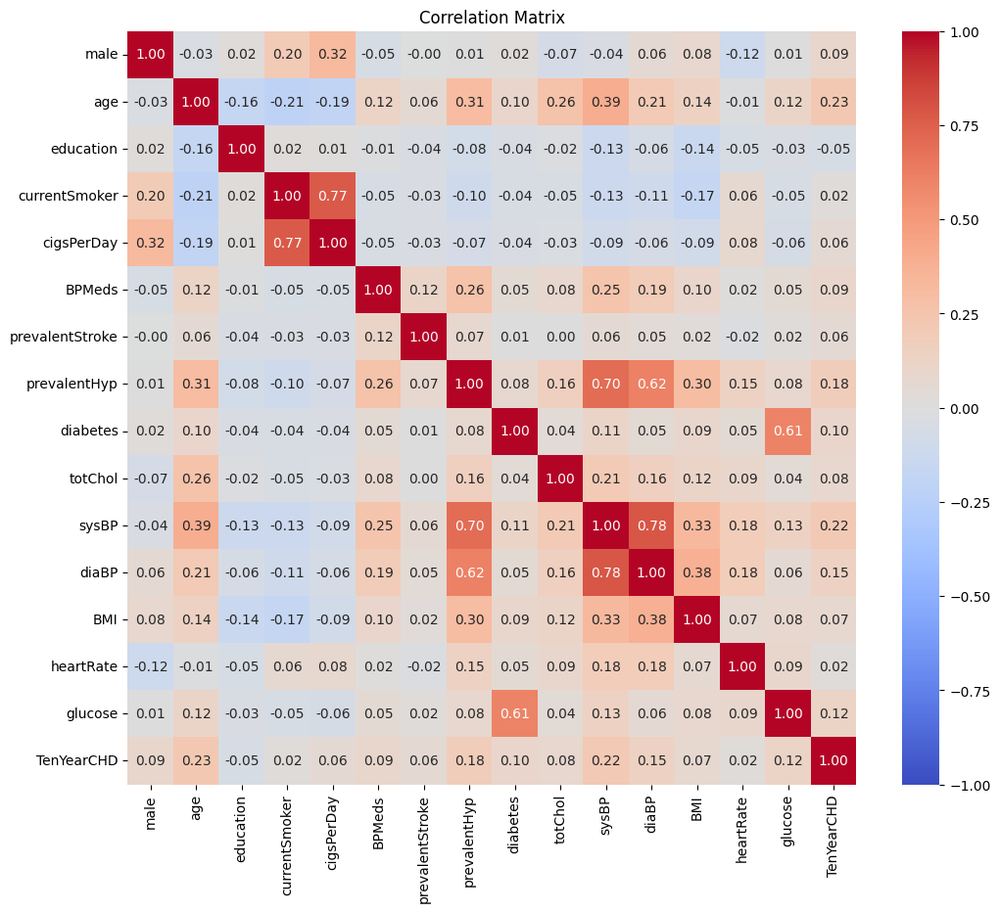

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()


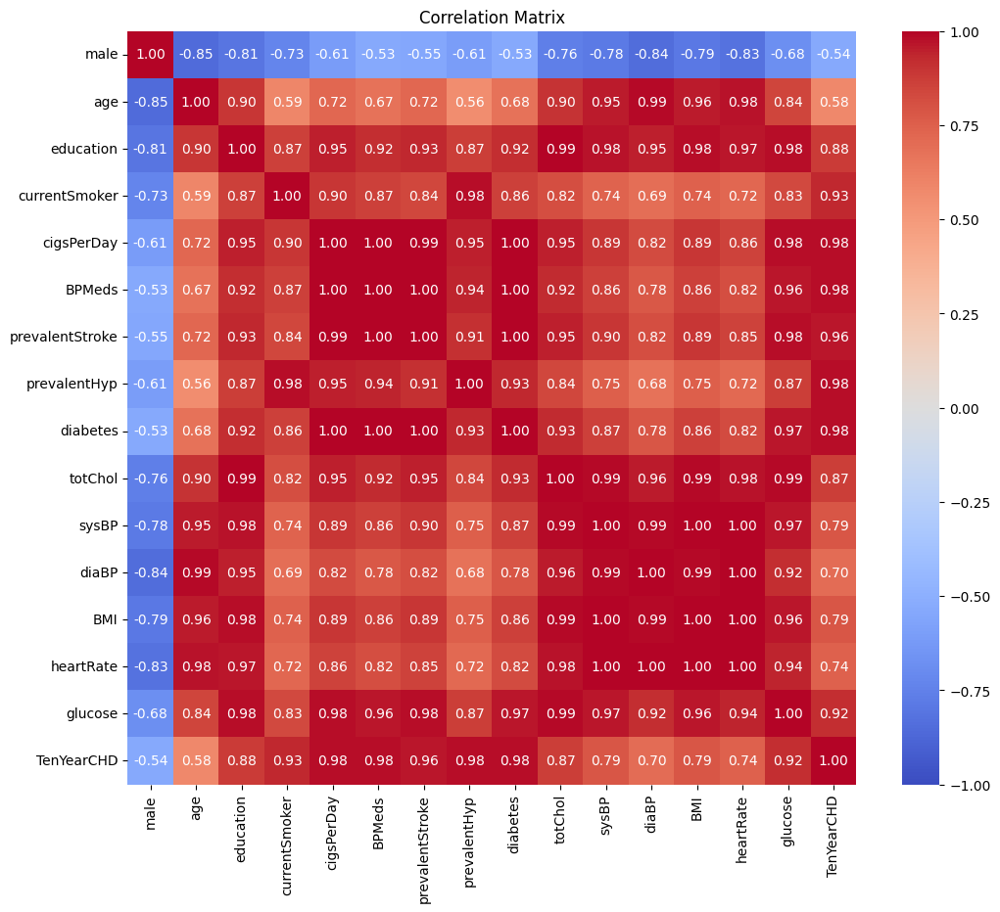

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Sample data for correlation matrix
data = {
    'male': [0.429, 0.495, 0.500, 0.429],
    'age': [49.58, 8.57, 32, 70],
    'education': [1.979, 1.007, 1, 4],
    'currentSmoker': [0.494, 0.500, 0, 1],
    'cigsPerDay': [9.01, 11.88, 0, 70],
    'BPMeds': [0.030, 0.168, 0, 1],
    'prevalentStroke': [0.006, 0.077, 0, 1],
    'prevalentHyp': [0.311, 0.463, 0, 1],
    'diabetes': [0.026, 0.158, 0, 1],
    'totChol': [236.70, 44.33, 107, 696],
    'sysBP': [132.35, 22.03, 83.5, 295],
    'diaBP': [82.90, 11.91, 48, 142.5],
    'BMI': [25.80, 4.07, 15.54, 56.8],
    'heartRate': [75.88, 12.02, 44, 143],
    'glucose': [81.96, 22.83, 40, 394],
    'TenYearCHD': [0.152, 0.359, 0, 1]
}

# Create DataFrame
df = pd.DataFrame(data)

# Compute correlation matrix
correlation_matrix = df.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()


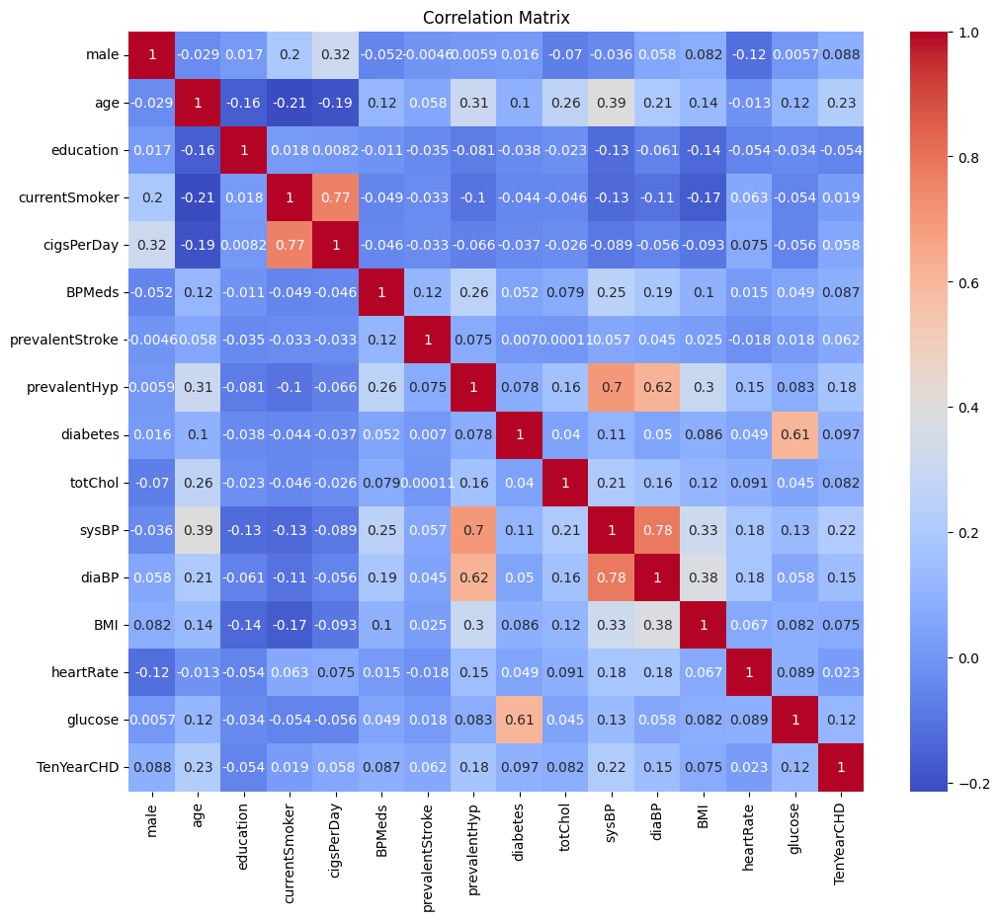

In [ ]:
data_path = '/content/Dataset2.csv'

# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv(data_path)

# Data Preprocessing
# Check for missing values and handle them if necessary
data.fillna(data.mean(), inplace=True)

# Draw and analyze the correlation matrix
correlation_matrix = data.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Remove features that are highly correlated with each other (threshold > 0.8)
threshold = 0.8
corr_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            corr_features.add(colname)

data_reduced = data.drop(columns=corr_features)


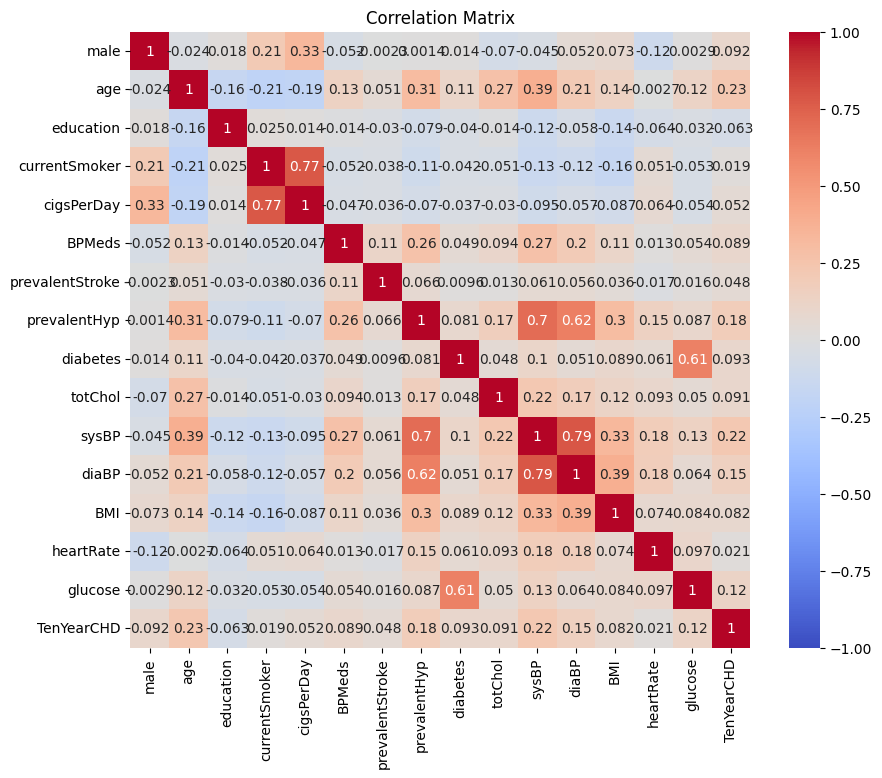

Columns of the reduced dataset: ['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds', 'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD']


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/Dataset2.csv'
data = pd.read_csv(file_path)

# Preprocess the data
# Check for missing values and fill/drop as necessary
if data.isnull().sum().sum() > 0:
    data = data.dropna()  # Drop rows with any missing values

# Calculate the correlation matrix
correlation_matrix = data.corr()

# Visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

# Identify and remove closely related features
threshold = 0.85
to_drop = set()
columns = correlation_matrix.columns

for i in range(len(columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = columns[i]
            to_drop.add(colname)

# Drop the features
data_reduced = data.drop(columns=to_drop)

# Save the reduced dataset to a new CSV file
data_reduced.to_csv('/content/Dataset2_reduced.csv', index=False)

# Print the columns of the reduced dataset
print("Columns of the reduced dataset:", data_reduced.columns.tolist())


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score, f1_score
import warnings

warnings.filterwarnings("ignore")

# Load the dataset
file_path = '/content/Dataset2.csv'
data = pd.read_csv(file_path)

# Preprocess the data
# Check for missing values and fill/drop as necessary
data = data.dropna()

# Encode categorical variables if any
label_encoders = {}
for column in data.select_dtypes(include=['object']).columns:
    label_encoders[column] = LabelEncoder()
    data[column] = label_encoders[column].fit_transform(data[column])

# Split the data into features and target
X = data.drop(columns='TenYearCHD')  # assuming the target column is named 'target'
y = data['TenYearCHD']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the models
bagging = BaggingClassifier(random_state=42)
random_forest = RandomForestClassifier(random_state=42)
adaboost = AdaBoostClassifier(random_state=42)

# Define the base learners for stacking
base_learners = [
    ('bagging', bagging),
    ('random_forest', random_forest),
    ('adaboost', adaboost)
]

# Define the stacking model
stacking = StackingClassifier(estimators=base_learners, final_estimator=LogisticRegression(), cv=5)

# List of models to train
models = {
    'Bagging': bagging,
    'Random Forest': random_forest,
    'AdaBoost': adaboost,
    'Stacking': stacking
}

# Train the models and evaluate
results = {}

for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    recall_train = recall_score(y_train, y_train_pred)
    recall_test = recall_score(y_test, y_test_pred)
    f1_train = f1_score(y_train, y_train_pred)
    f1_test = f1_score(y_test, y_test_pred)

    results[model_name] = {
        'Recall Train': recall_train,
        'Recall Test': recall_test,
        'F1 Train': f1_train,
        'F1 Test': f1_test
    }

# Print the results
results_df = pd.DataFrame(results).T
print(results_df)


               Recall Train  Recall Test  F1 Train   F1 Test
Bagging            0.875862     0.147541  0.932681  0.227848
Random Forest      1.000000     0.049180  1.000000  0.091603
AdaBoost           0.124138     0.114754  0.209709  0.191781
Stacking           0.993103     0.024590  0.996540  0.047619


In [ ]:
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = '/content/Dataset2.csv'
data = pd.read_csv(file_path)

# Split the data into features and target variable
X = data.drop(columns='TenYearCHD')
y = data['TenYearCHD'].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree implementation
class DecisionTree:
    def __init__(self, depth=1):
        self.depth = depth
        self.tree = None

    def fit(self, X, y):
        self.tree = self._build_tree(X, y, depth=self.depth)

    def predict(self, X):
        return np.array([self._predict_one(x, self.tree) for x in X])

    def _build_tree(self, X, y, depth):
        if depth == 0 or len(set(y)) == 1:
            return Counter(y).most_common(1)[0][0]
        else:
            best_split = self._best_split(X, y)
            left_mask = X[:, best_split['feature']] < best_split['threshold']
            right_mask = ~left_mask
            return {
                'feature': best_split['feature'],
                'threshold': best_split['threshold'],
                'left': self._build_tree(X[left_mask], y[left_mask], depth-1),
                'right': self._build_tree(X[right_mask], y[right_mask], depth-1)
            }

    def _best_split(self, X, y):
        best_split = {}
        max_info_gain = -1
        n_features = X.shape[1]
        for feature in range(n_features):
            thresholds = np.unique(X[:, feature])
            for threshold in thresholds:
                left_mask = X[:, feature] < threshold
                right_mask = ~left_mask
                info_gain = self._information_gain(y, y[left_mask], y[right_mask])
                if info_gain > max_info_gain:
                    max_info_gain = info_gain
                    best_split = {'feature': feature, 'threshold': threshold}
        return best_split

    def _information_gain(self, y, y_left, y_right):
        p = len(y_left) / len(y)
        return self._entropy(y) - (p * self._entropy(y_left) + (1 - p) * self._entropy(y_right))

    def _entropy(self, y):
        proportions = np.bincount(y) / len(y)
        return -np.sum([p * np.log2(p) for p in proportions if p > 0])

    def _predict_one(self, x, tree):
        if isinstance(tree, dict):
            if x[tree['feature']] < tree['threshold']:
                return self._predict_one(x, tree['left'])
            else:
                return self._predict_one(x, tree['right'])
        else:
            return tree

# Random Forest implementation
class RandomForest:
    def __init__(self, n_trees=10, depth=3):
        self.n_trees = n_trees
        self.depth = depth
        self.trees = []

    def fit(self, X, y):
        n_samples = X.shape[0]
        for _ in range(self.n_trees):
            indices = np.random.choice(n_samples, n_samples, replace=True)
            X_subset, y_subset = X[indices], y[indices]
            tree = DecisionTree(depth=self.depth)
            tree.fit(X_subset, y_subset)
            self.trees.append(tree)

    def predict(self, X):
        tree_preds = np.array([tree.predict(X) for tree in self.trees])
        return [Counter(tree_preds[:, i]).most_common(1)[0][0] for i in range(X.shape[0])]

# Initialize the Random Forest classifier
clf = RandomForest(n_trees=100, depth=5)

# Train the classifier on the training data
clf.fit(X_train, y_train)

# Predict the labels on the training and testing data
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

# Evaluate the classifier
train_accuracy = np.mean(y_pred_train == y_train)
test_accuracy = np.mean(y_pred_test == y_test)

print("Training Accuracy: {:.2f}%".format(train_accuracy * 100))
print("Testing Accuracy: {:.2f}%".format(test_accuracy * 100))


KeyError: "None of [Index([3168, 2063, 2128, 3166,  751, 3190,  527, 2950, 3031, 1053,\n       ...\n       1875, 3103, 3015, 1507, 2579, 2620, 1304,  143,  190, 3047],\n      dtype='int64', length=3392)] are in the [columns]"

Error rate: Training: 0.4530 - Test: 0.4695


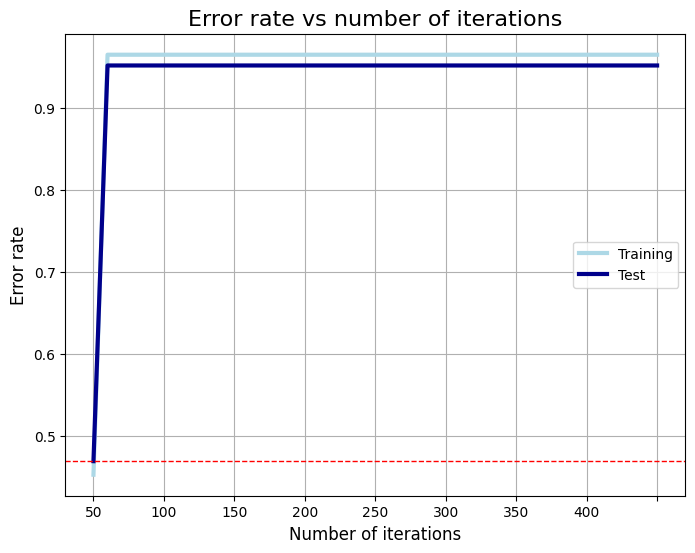

In [ ]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_hastie_10_2
import matplotlib.pyplot as plt

# Helper function: Get error rate
def get_error_rate(pred, Y):
    return sum(pred != Y) / float(len(Y))

# Helper function: Print error rate
def print_error_rate(err):
    print(f'Error rate: Training: {err[0]:.4f} - Test: {err[1]:.4f}')

# Helper function: Generic classifier
def generic_clf(Y_train, X_train, Y_test, X_test, clf):
    clf.fit(X_train, Y_train)
    pred_train = clf.predict(X_train)
    pred_test = clf.predict(X_test)
    return get_error_rate(pred_train, Y_train), \
           get_error_rate(pred_test, Y_test)

# Adaboost implementation
def adaboost_clf(Y_train, X_train, Y_test, X_test, M, clf):
    n_train, n_test = len(X_train), len(X_test)
    w = np.ones(n_train) / n_train  # Initialize weights
    pred_train, pred_test = np.zeros(n_train), np.zeros(n_test)

    for i in range(M):
        clf.fit(X_train, Y_train, sample_weight=w)
        pred_train_i = clf.predict(X_train)
        pred_test_i = clf.predict(X_test)

        miss = [int(x) for x in (pred_train_i != Y_train)]
        miss2 = [x if x == 1 else -1 for x in miss]

        err_m = np.dot(w, miss) / sum(w)
        alpha_m = 0.5 * np.log((1 - err_m) / float(err_m))

        w = np.multiply(w, np.exp([float(x) * alpha_m for x in miss2]))

        pred_train = [sum(x) for x in zip(pred_train, [x * alpha_m for x in pred_train_i])]
        pred_test = [sum(x) for x in zip(pred_test, [x * alpha_m for x in pred_test_i])]

    pred_train, pred_test = np.sign(pred_train), np.sign(pred_test)
    return get_error_rate(pred_train, Y_train), get_error_rate(pred_test, Y_test)

# Plot function
def plot_error_rate(er_train, er_test):
    df_error = pd.DataFrame([er_train, er_test]).T
    df_error.columns = ['Training', 'Test']
    plot1 = df_error.plot(linewidth=3, figsize=(8, 6), color=['lightblue', 'darkblue'], grid=True)
    plot1.set_xlabel('Number of iterations', fontsize=12)
    plot1.set_xticklabels(range(0, 450, 50))
    plot1.set_ylabel('Error rate', fontsize=12)
    plot1.set_title('Error rate vs number of iterations', fontsize=16)
    plt.axhline(y=er_test[0], linewidth=1, color='red', ls='dashed')

# Main script
if __name__ == '__main__':
    # Read data
    dataset_path = '/content/Dataset1.csv'
    df = pd.read_csv(dataset_path)

    # Split into features and target variable
    X = df.drop('Label', axis=1)
    y = df['Label']

    # Split into training and test set
    X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Fit a simple decision tree first
    clf_tree = DecisionTreeClassifier(max_depth=1, random_state=1)
    er_tree = generic_clf(Y_train, X_train, Y_test, X_test, clf_tree)
    print_error_rate(er_tree)

    # Fit Adaboost classifier using a decision tree as base estimator
    # Test with different number of iterations
    er_train, er_test = [er_tree[0]], [er_tree[1]]
    x_range = range(10, 410, 10)
    for i in x_range:
        er_i = adaboost_clf(Y_train, X_train, Y_test, X_test, i, clf_tree)
        er_train.append(er_i[0])
        er_test.append(er_i[1])

    # Compare error rate vs number of iterations
    plot_error_rate(er_train, er_test)


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# Load and prepare data
def load_data(filepath):
    data = pd.read_csv(filepath)
    X = data[['Feature 1', 'Feature 2']].values
    y = data['Label'].values
    return train_test_split(X, y, test_size=0.2, random_state=42)

# Define the weak learner (Decision Stump)
class DecisionStump:
    def __init__(self):
        self.polarity = 1
        self.feature_index = None
        self.threshold = None
        self.alpha = None

    def predict(self, X):
        n_samples = X.shape[0]
        X_column = X[:, self.feature_index]
        predictions = np.ones(n_samples)
        if self.polarity == 1:
            predictions[X_column < self.threshold] = -1
        else:
            predictions[X_column >= self.threshold] = -1
        return predictions

# Implement AdaBoost algorithm
class AdaBoost:
    def __init__(self, n_clf=5):
        self.n_clf = n_clf
        self.clfs = []

    def fit(self, X, y):
        n_samples, n_features = X.shape
        w = np.full(n_samples, (1 / n_samples))

        for _ in range(self.n_clf):
            clf = DecisionStump()
            min_error = float('inf')

            for feature_i in range(n_features):
                X_column = X[:, feature_i]
                thresholds = np.unique(X_column)

                for threshold in thresholds:
                    p = 1
                    predictions = np.ones(n_samples)
                    predictions[X_column < threshold] = -1

                    misclassified = w[y != predictions]
                    error = sum(misclassified)

                    if error > 0.5:
                        error = 1 - error
                        p = -1

                    if error < min_error:
                        clf.polarity = p
                        clf.threshold = threshold
                        clf.feature_index = feature_i
                        min_error = error

            EPS = 1e-10
            clf.alpha = 0.5 * np.log((1 - min_error) / (min_error + EPS))
            predictions = clf.predict(X)
            w *= np.exp(-clf.alpha * y * predictions)
            w /= np.sum(w)

            self.clfs.append(clf)

    def predict(self, X):
        clf_preds = [clf.alpha * clf.predict(X) for clf in self.clfs]
        y_pred = np.sum(clf_preds, axis=0)
        y_pred = np.sign(y_pred)
        return y_pred

# Load data
filepath = '/content/Dataset1.csv'
X_train, X_test, y_train, y_test = load_data(filepath)

# Convert labels to {-1, 1}
y_train = np.where(y_train == 0, -1, 1)
y_test = np.where(y_test == 0, -1, 1)

# Train AdaBoost model
n_clf = 10
model = AdaBoost(n_clf=n_clf)
model.fit(X_train, y_train)

# Evaluate the model on the training set
y_train_pred = model.predict(X_train)
train_accuracy = np.mean(y_train_pred == y_train)
print(f'Training Accuracy: {train_accuracy * 100:.2f}%')

# Evaluate the model on the test set
y_test_pred = model.predict(X_test)
test_accuracy = np.mean(y_test_pred == y_test)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')


Training Accuracy: 97.32%
Test Accuracy: 97.36%


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer

# Load the dataset
df = pd.read_csv('/content/Dataset2.csv')

# Inspect the dataset
print(df.head())
print(df.info())

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Define features and target variable
X = df_imputed.drop(columns=['TenYearCHD'])
y = df_imputed['TenYearCHD']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the AdaBoost classifier
model = AdaBoostClassifier(n_estimators=50, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Optional: Display feature importances
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)
print(feature_importance_df)


   male  age  education  currentSmoker  cigsPerDay  BPMeds  prevalentStroke  \
0     1   39        4.0              0         0.0     0.0                0   
1     0   46        2.0              0         0.0     0.0                0   
2     1   48        1.0              1        20.0     0.0                0   
3     0   61        3.0              1        30.0     0.0                0   
4     0   46        3.0              1        23.0     0.0                0   

   prevalentHyp  diabetes  totChol  sysBP  diaBP    BMI  heartRate  glucose  \
0             0         0    195.0  106.0   70.0  26.97       80.0     77.0   
1             0         0    250.0  121.0   81.0  28.73       95.0     76.0   
2             0         0    245.0  127.5   80.0  25.34       75.0     70.0   
3             1         0    225.0  150.0   95.0  28.58       65.0    103.0   
4             0         0    285.0  130.0   84.0  23.10       85.0     85.0   

   TenYearCHD  
0           0  
1           0  
2 

In the context of machine learning models, "feature importance" refers to techniques that assign a score to input features based on how useful they are at predicting a target variable. For models like AdaBoost, feature importance scores are derived from the contributions of each feature to the model's decision-making process. These scores help in understanding which features are most influential in making predictions.

In AdaBoost, feature importance is calculated based on the contribution of each feature to the

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Train Precision: 0.87
Train Recall: 0.86
Train F1 Score: 0.81
Train Accuracy: 0.86
Test Precision: 0.81
Test Recall: 0.85
Test F1 Score: 0.79
Test Accuracy: 0.85


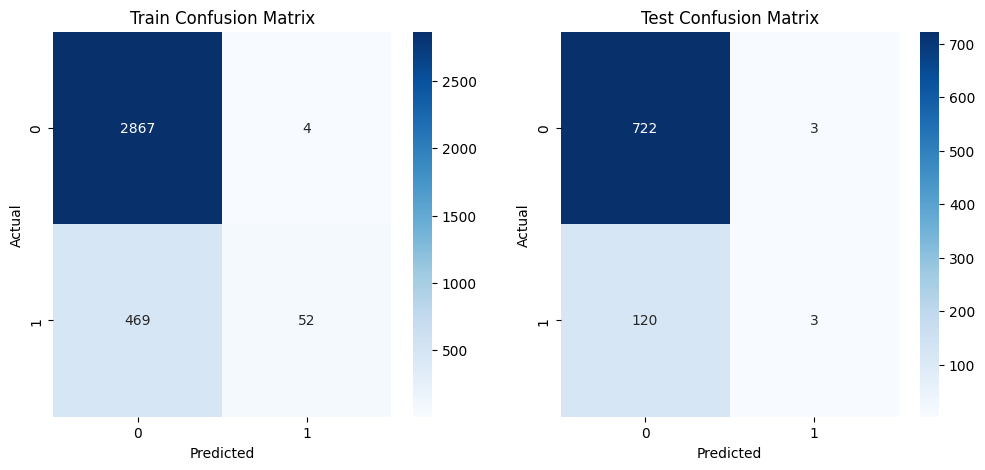

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

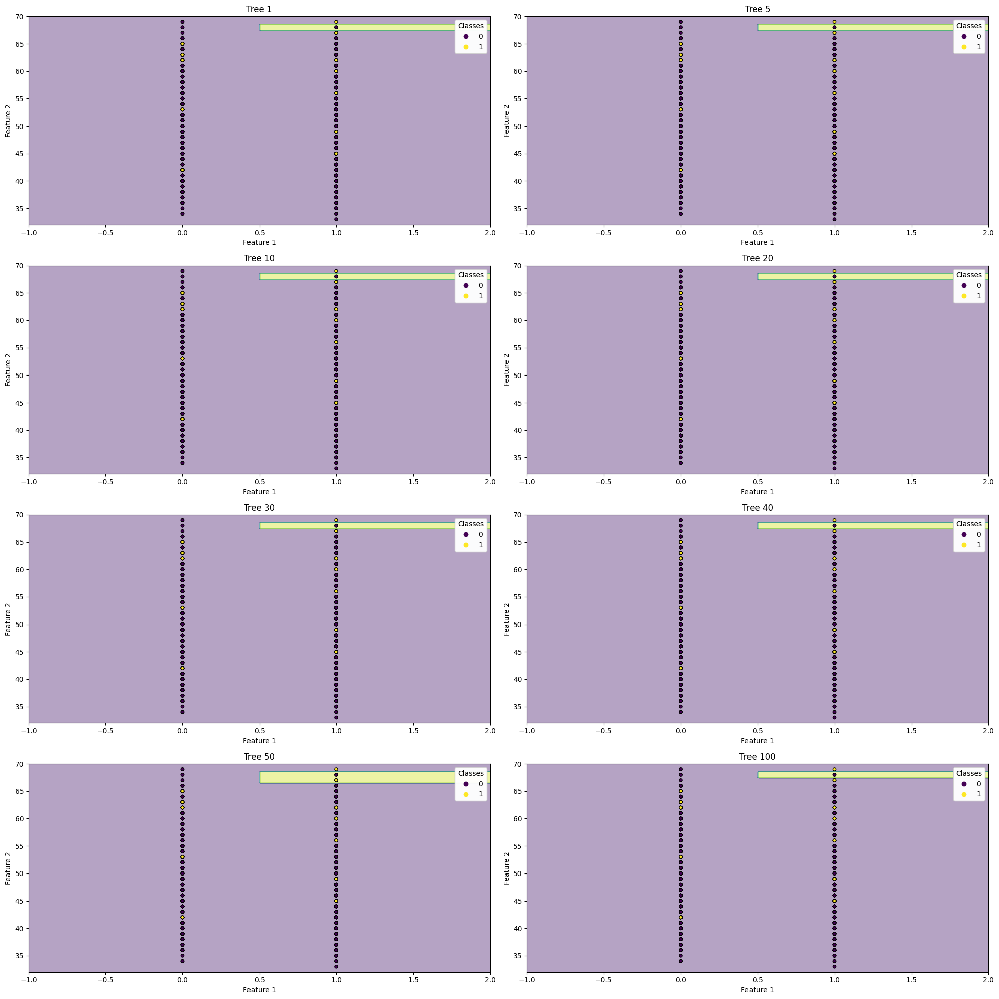

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

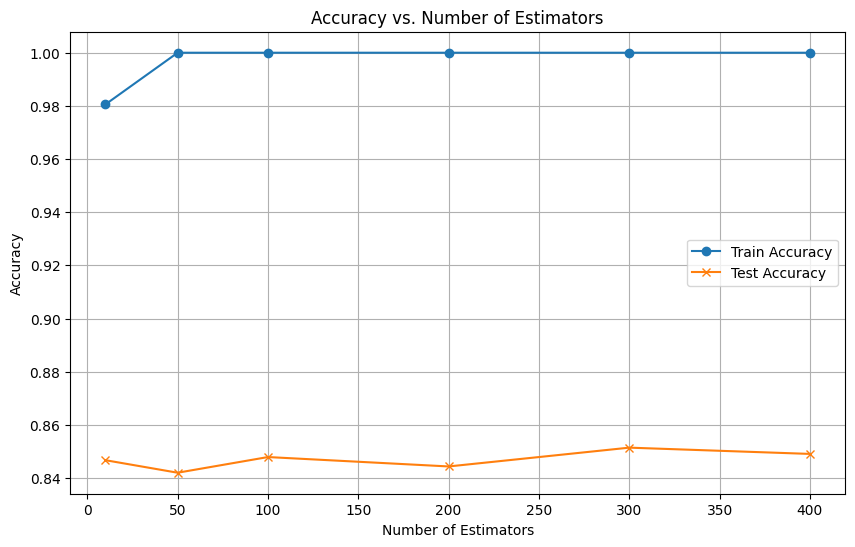

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.impute import SimpleImputer

# Load the full dataset
data_full = pd.read_csv('/content/Dataset2.csv')

# Preprocess the data
# Check for missing values and fill/drop as necessary
imputer = SimpleImputer(strategy='mean')
data_full_imputed = pd.DataFrame(imputer.fit_transform(data_full), columns=data_full.columns)

# Split the dataset into training and testing sets
X = data_full_imputed.drop('TenYearCHD', axis=1)
y = data_full_imputed['TenYearCHD']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter tuning for Bagging
param_grid = {
    'n_estimators': [10, 50, 100],
    'estimator__max_depth': [3, 5, 7],
    'max_samples': [0.5, 0.75, 1.0],
    'max_features': [0.5, 0.75, 1.0]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(BaggingClassifier(estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Visualize individual trees with a DecisionTreeClassifier for 2 features
def plot_decision_boundary(X, y, model, ax, title):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, s=20, edgecolor='k')
    legend = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend)
    ax.set_title(title)
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

# Select two features for plotting
feature_indices = [0, 1]  # Adjust these indices based on your dataset
X_train_plot = X_train.iloc[:, feature_indices].values
X_test_plot = X_test.iloc[:, feature_indices].values

plt.figure(figsize=(20, 20))
n_trees = [1, 5, 10, 20, 30, 40, 50, 100]

for i, n in enumerate(n_trees):
    tree_model = DecisionTreeClassifier(max_depth=best_model.estimator.max_depth, random_state=42)
    bagging_model = BaggingClassifier(base_estimator=tree_model, n_estimators=n, random_state=42)
    bagging_model.fit(X_train_plot, y_train)
    ax = plt.subplot(4, 2, i + 1)
    plot_decision_boundary(X_test_plot, y_test, bagging_model, ax, f'Tree {n}')

plt.tight_layout()
plt.show()

# Plot accuracy vs. number of estimators
estimators_range = [10, 50, 100, 200, 300, 400]
train_accuracies = []
test_accuracies = []

for n_estimators in estimators_range:
    model = BaggingClassifier(base_estimator=base_estimator, n_estimators=n_estimators, random_state=42)
    model.fit(X_train, y_train)
    train_accuracies.append(model.score(X_train, y_train))
    test_accuracies.append(model.score(X_test, y_test))

plt.figure(figsize=(10, 6))
plt.plot(estimators_range, train_accuracies, marker='o', label='Train Accuracy')
plt.plot(estimators_range, test_accuracies, marker='x', label='Test Accuracy')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Estimators')
plt.legend()
plt.grid(True)
plt.show()


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Train Precision: 0.87
Train Recall: 0.86
Train F1 Score: 0.81
Train Accuracy: 0.86
Test Precision: 0.81
Test Recall: 0.85
Test F1 Score: 0.79
Test Accuracy: 0.85


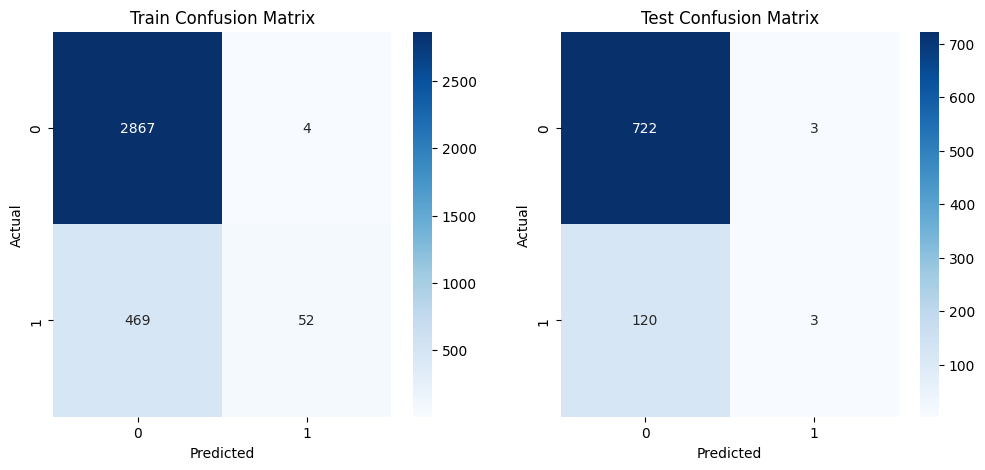

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

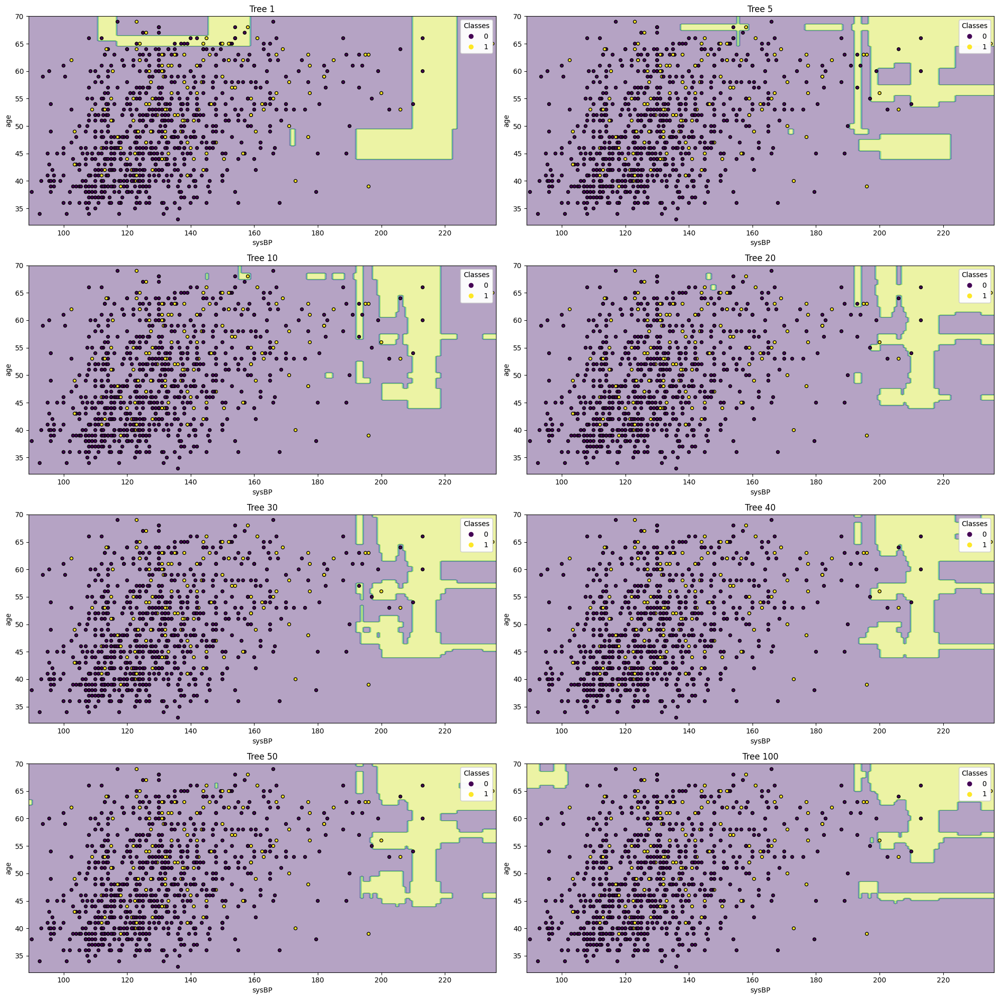

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

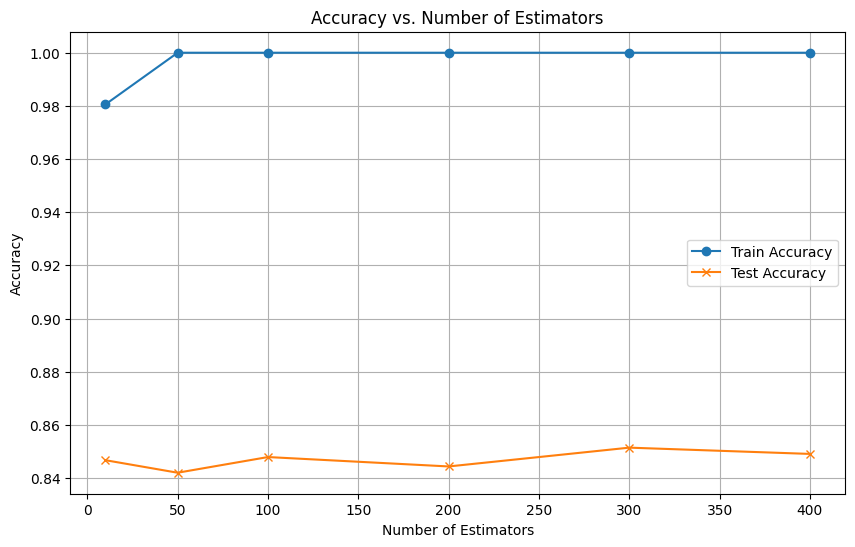

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.impute import SimpleImputer

# Load the full dataset
data_full = pd.read_csv('/content/Dataset2.csv')

# Preprocess the data
# Check for missing values and fill/drop as necessary
imputer = SimpleImputer(strategy='mean')
data_full_imputed = pd.DataFrame(imputer.fit_transform(data_full), columns=data_full.columns)

# Split the dataset into training and testing sets
X = data_full_imputed.drop('TenYearCHD', axis=1)
y = data_full_imputed['TenYearCHD']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter tuning for Bagging
param_grid = {
    'n_estimators': [10, 50, 100],
    'estimator__max_depth': [3, 5, 7],
    'max_samples': [0.5, 0.75, 1.0],
    'max_features': [0.5, 0.75, 1.0]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(BaggingClassifier(estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Feature importance to select top 2 features
importances = np.mean([tree.feature_importances_ for tree in best_model.estimators_], axis=0)
indices = np.argsort(importances)[-2:]  # indices of the top 2 features
top_features = X_train.columns[indices]

# Visualize individual trees with a DecisionTreeClassifier for top 2 features
def plot_decision_boundary(X, y, model, ax, title):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, s=20, edgecolor='k')
    legend = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend)
    ax.set_title(title)
    ax.set_xlabel(top_features[0])
    ax.set_ylabel(top_features[1])

# Select top 2 features for plotting
X_train_plot = X_train[top_features].values
X_test_plot = X_test[top_features].values

plt.figure(figsize=(20, 20))
n_trees = [1, 5, 10, 20, 30, 40, 50, 100]

for i, n in enumerate(n_trees):
    tree_model = DecisionTreeClassifier(max_depth=best_model.estimator.max_depth, random_state=42)
    bagging_model = BaggingClassifier(base_estimator=tree_model, n_estimators=n, random_state=42)
    bagging_model.fit(X_train_plot, y_train)
    ax = plt.subplot(4, 2, i + 1)
    plot_decision_boundary(X_test_plot, y_test, bagging_model, ax, f'Tree {n}')

plt.tight_layout()
plt.show()

# Plot accuracy vs. number of estimators
estimators_range = [10, 50, 100, 200, 300, 400]
train_accuracies = []
test_accuracies = []

for n_estimators in estimators_range:
    model = BaggingClassifier(base_estimator=base_estimator, n_estimators=n_estimators, random_state=42)
    model.fit(X_train, y_train)
    train_accuracies.append(model.score(X_train, y_train))
    test_accuracies.append(model.score(X_test, y_test))

plt.figure(figsize=(10, 6))
plt.plot(estimators_range, train_accuracies, marker='o', label='Train Accuracy')
plt.plot(estimators_range, test_accuracies, marker='x', label='Test Accuracy')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Estimators')
plt.legend()
plt.grid(True)
plt.show()


Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Train Precision: 0.86
Train Recall: 0.86
Train F1 Score: 0.80
Train Accuracy: 0.86
Test Precision: 0.79
Test Recall: 0.85
Test F1 Score: 0.79
Test Accuracy: 0.85


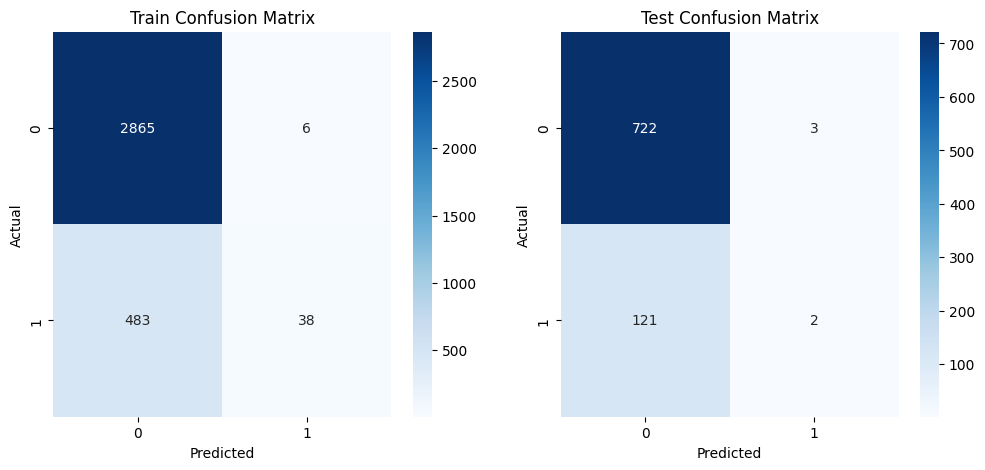

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

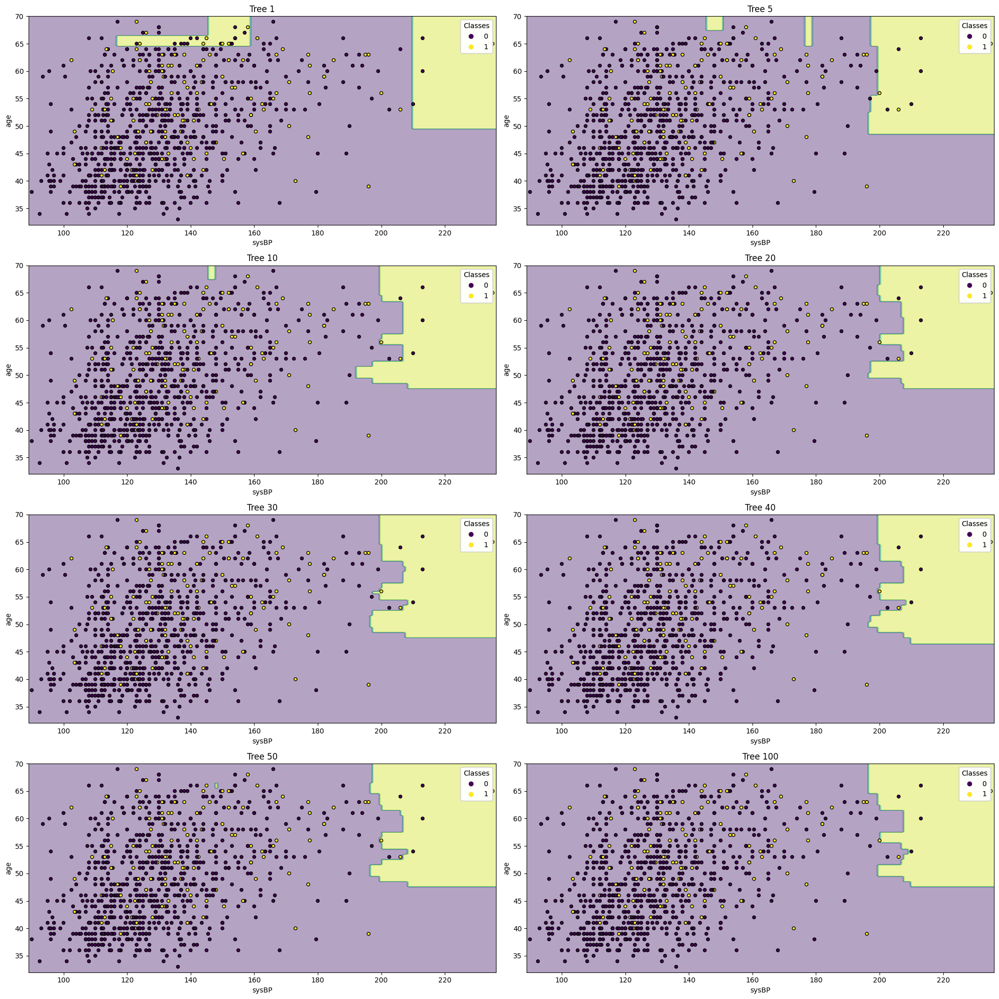

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

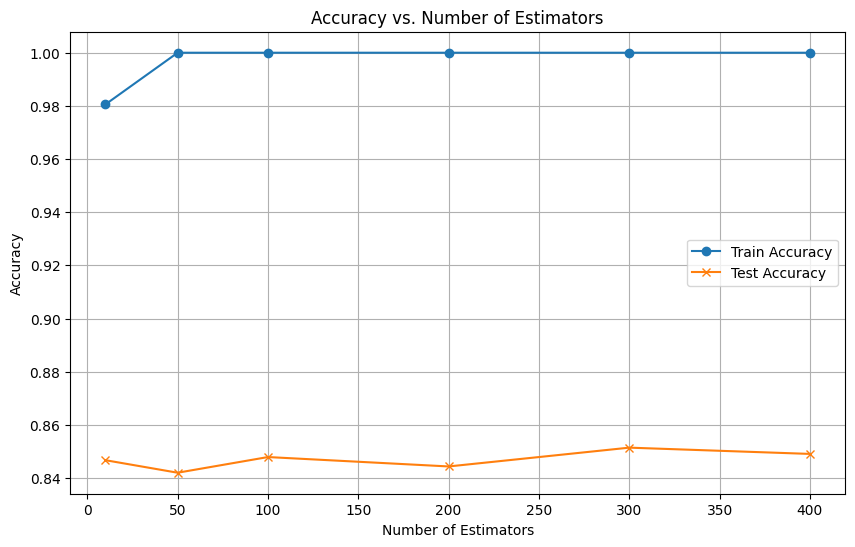

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.impute import SimpleImputer

# Load the full dataset
data_full = pd.read_csv('/content/Dataset2.csv')

# Preprocess the data
# Check for missing values and fill/drop as necessary
imputer = SimpleImputer(strategy='mean')
data_full_imputed = pd.DataFrame(imputer.fit_transform(data_full), columns=data_full.columns)

# Split the dataset into training and testing sets
X = data_full_imputed.drop('TenYearCHD', axis=1)
y = data_full_imputed['TenYearCHD']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter tuning for Bagging
param_grid = {
    'n_estimators': [10, 50, 100],
    'estimator__max_depth': [3, 5, 7],
    'estimator__min_samples_leaf': [2, 5, 10],
    'max_samples': [0.5, 0.75, 1.0],
    'max_features': [0.5, 0.75, 1.0]
}
base_estimator = DecisionTreeClassifier()
grid_search = GridSearchCV(BaggingClassifier(estimator=base_estimator, random_state=42), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Evaluate the model
def evaluate_model(X_train, X_test, y_train, y_test, model):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_train = f1_score(y_train, y_pred_train, average='weighted')
    accuracy_train = accuracy_score(y_train, y_pred_train)

    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_test = f1_score(y_test, y_pred_test, average='weighted')
    accuracy_test = accuracy_score(y_test, y_pred_test)

    return precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test

precision_train, recall_train, f1_train, accuracy_train, precision_test, recall_test, f1_test, accuracy_test, y_pred_train, y_pred_test = evaluate_model(X_train, X_test, y_train, y_test, best_model)

# Print the results
print(f"Train Precision: {precision_train:.2f}")
print(f"Train Recall: {recall_train:.2f}")
print(f"Train F1 Score: {f1_train:.2f}")
print(f"Train Accuracy: {accuracy_train:.2f}")

print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test F1 Score: {f1_test:.2f}")
print(f"Test Accuracy: {accuracy_test:.2f}")

# Confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues')
plt.title('Train Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Feature importance to select top 2 features
importances = np.mean([tree.feature_importances_ for tree in best_model.estimators_], axis=0)
indices = np.argsort(importances)[-2:]  # indices of the top 2 features
top_features = X_train.columns[indices]

# Visualize individual trees with a DecisionTreeClassifier for top 2 features
def plot_decision_boundary(X, y, model, ax, title):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, s=20, edgecolor='k')
    legend = ax.legend(*scatter.legend_elements(), title="Classes")
    ax.add_artist(legend)
    ax.set_title(title)
    ax.set_xlabel(top_features[0])
    ax.set_ylabel(top_features[1])

# Select top 2 features for plotting
X_train_plot = X_train[top_features].values
X_test_plot = X_test[top_features].values

plt.figure(figsize=(20, 20))
n_trees = [1, 5, 10, 20, 30, 40, 50, 100]

for i, n in enumerate(n_trees):
    tree_model = DecisionTreeClassifier(max_depth=best_model.estimator.max_depth, min_samples_leaf=best_model.estimator.min_samples_leaf, random_state=42)
    bagging_model = BaggingClassifier(base_estimator=tree_model, n_estimators=n, random_state=42)
    bagging_model.fit(X_train_plot, y_train)
    ax = plt.subplot(4, 2, i + 1)
    plot_decision_boundary(X_test_plot, y_test, bagging_model, ax, f'Tree {n}')

plt.tight_layout()
plt.show()

# Plot accuracy vs. number of estimators
estimators_range = [10, 50, 100, 200, 300, 400]
train_accuracies = []
test_accuracies = []

for n_estimators in estimators_range:
    model = BaggingClassifier(base_estimator=base_estimator, n_estimators=n_estimators, random_state=42)
    model.fit(X_train, y_train)
    train_accuracies.append(model.score(X_train, y_train))
    test_accuracies.append(model.score(X_test, y_test))

plt.figure(figsize=(10, 6))
plt.plot(estimators_range, train_accuracies, marker='o', label='Train Accuracy')
plt.plot(estimators_range, test_accuracies, marker='x', label='Test Accuracy')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Estimators')
plt.legend()
plt.grid(True)
plt.show()
